In [1]:
# IBM HR Analyst

# Problem Statement:-
Employee attrition, commonly known as turnover, is a significant concern for companies as it directly impacts productivity, team dynamics, and financial stability. High attrition rates lead to increased recruitment and training costs, disrupt team cohesion, and cause a loss of institutional knowledge. Understanding the underlying factors that contribute to employee attrition is crucial for HR departments to implement effective retention strategies.

The objective of this project is to analyze employee attrition data to uncover patterns and factors influencing turnover. By leveraging data analytics and machine learning, we aim to develop predictive models that can identify employees at risk of leaving, thereby enabling proactive interventions to retain valuable talent.

# Objectives of the Analysis
1. Primary Objectives:

Understand Current Turnover Rates:

- Gain a comprehensive understanding of the employee turnover rate within the organization.
Analyze the demographic distribution of attrition, considering factors such as age, gender, education, department, and job role.

Identify Key Factors Influencing Turnover:

- Examine the main factors contributing to employee attrition, including job satisfaction indicators (job involvement, work-life balance), salary factors (monthly income, stock options), and other relevant variables.
Uncover patterns and correlations that drive higher attrition rates, aiding in the development of targeted retention strategies.
Secondary Objectives:

2. Predictive Modeling:

- Develop a machine learning model to predict which employees are at the highest risk of attrition.
Evaluate the model’s performance using key metrics and interpret the importance of various features in predicting attrition.
Actionable Insights:

- Provide actionable insights to HR teams to focus on the most influential factors driving attrition.
Offer recommendations to improve employee retention and reduce turnover rates.

In [4]:
import pandas as pd
import numpy as np

In [5]:
import matplotlib.pyplot as plt

In [6]:
import seaborn as sns

In [7]:
# Load datasets
df=pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [8]:
# display all columns 
pd.set_option("display.max_columns",None)
# pd.set_option('display.max_columns', None)

In [9]:
# How dataset looks like?
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [10]:
# what is the name of features?

In [11]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

About Features:-
1. Age :-("int") Represents the age of the employee in year.
2. Attrition :- ("object") Indicates whether the employee has left the company (Yes) or is still with the company (No)
3. BusinessTravel:- ("object")  Describe business travel for the employee. Categories include "Travel_Rarely," "Travel_Frequently," and "Non-Travel."
4. DailyRate :- ("int") Represents the daily rate of the employee.
5. Department : -("Object") Indicates the department in which the employee works.
6. DistanceFromHome (int64): Distance between home and workplace in miles.
7. Education (int64): Employee's education level.
8. EducationField (object): Field of education.
9. EmployeeCount (int64): Number of employees (constant value).
10. EmployeeNumber (int64): Unique identifier for each employee.
11. EnvironmentSatisfaction (int64): Satisfaction with the work environment (1-4 scale).
12. Gender (object): Employee's gender.
13. HourlyRate (int64): Hourly wage.
14. JobInvolvement (int64): Level of job involvement (1-4 scale).
15. JobLevel (int64): Employee's position level within the company.
16. JobRole (object): Employee's job title.
17. JobSatisfaction (int64): Satisfaction with the job (1-4 scale).
18. MaritalStatus (object): Employee's marital status.
19. MonthlyIncome (int64): Monthly salary.(fixed) 
20. MonthlyRate (int64): Monthly salary rate.(vary based on hours worked.)
21. NumCompaniesWorked (int64): Number of companies the employee has worked for.
22. Over18 (object): Indicates if the employee is over 18 (constant Yes).
23. OverTime (object): Indicates if the employee works overtime (Yes/No).
24. PercentSalaryHike (int64): Percentage salary increase last year.
25. PerformanceRating (int64): Employee's performance rating (1-4 scale).
26. RelationshipSatisfaction (int64): Satisfaction with workplace relationships (1-4 scale).
27. StandardHours (int64): Standard working hours (constant value).
28. StockOptionLevel (int64): Level of stock options (0-3 scale).
29. TotalWorkingYears (int64): Total years of work experience.
30. TrainingTimesLastYear (int64): Number of training sessions attended last year.
31. WorkLifeBalance (int64): Satisfaction with work-life balance (1-4 scale).
32. YearsAtCompany (int64): Number of years with the current company.
33. YearsInCurrentRole (int64): Number of years in the current role.
34. YearsSinceLastPromotion (int64): Years since the last promotion.
35. YearsWithCurrManager (int64): Number of years working with the current manager.

In [13]:
# How big is the dataset?

In [14]:
df.shape

(1470, 35)

In [15]:
# what is the datatype of features?

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [17]:
# Are there any missing values ?
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

# insight:-  there is no missing values.

In [19]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [20]:
df.duplicated().sum()

0

In [21]:
df.drop(columns="EmployeeNumber").duplicated().sum()

0

# Insight :- There is no duplicate value in dataset.

In [23]:
df["Attrition"].value_counts()

Attrition
No     1233
Yes     237
Name: count, dtype: int64

In [24]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [25]:
df.drop(columns=["EmployeeNumber","Over18"],inplace=True)

In [26]:
df["Age"].dtypes=="int64"

True

In [27]:
num=[]
cat=[]
for i in df.columns:
    if df[i].dtypes=="int64":
        num.append(i)
    else:
        cat.append(i)

In [28]:
# Numerical columns:-
num

['Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EmployeeCount',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [29]:
# Categorical columns
cat

['Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

# 3. EDA : Exploatory Data Analysis

In [31]:
for i in cat:
    print(df[i].value_counts())
    print()

Attrition
No     1233
Yes     237
Name: count, dtype: int64

BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64

Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64

EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: count, dtype: int64

Gender
Male      882
Female    588
Name: count, dtype: int64

JobRole
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: count, dtype: int64

MaritalStatus
Married     673
Single      470
Divorced    327
Name: count, dtype: int64

OverTime
No     1054
Y

# 3.1. Univariate Analysis

# 3.1.1. Categorical Features

<Axes: xlabel='Attrition', ylabel='count'>

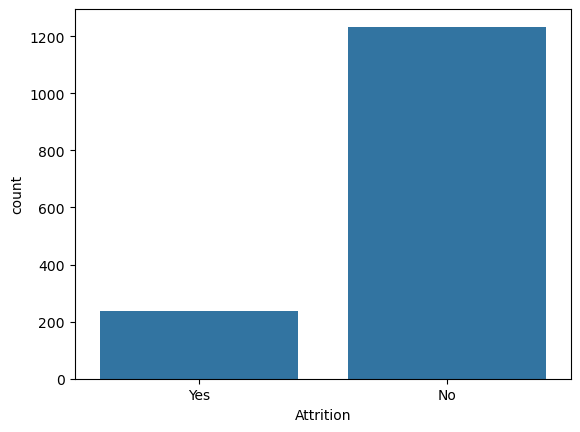

In [34]:
sns.countplot(data=df,x="Attrition")

In [35]:
dict(df["OverTime"].value_counts())

{'No': 1054, 'Yes': 416}

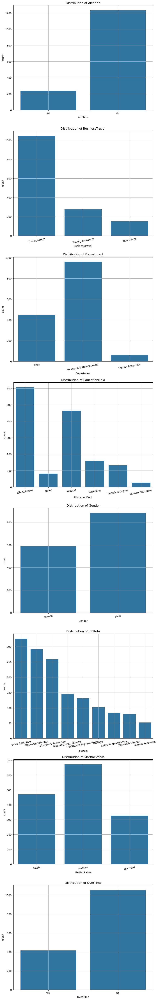

In [36]:
plt.figure(figsize=(10,80))
j=1
for i in cat:
    plt.subplot(9,1,j)
    sns.countplot(data=df,x=i)
    plt.xticks(rotation=10)
    plt.grid()
    plt.title(f'Distribution of {i}')
    j+=1
plt.show()
    

# Insight:-
1. Attrition:- The dataset indicates a significantly lower rate of employee attrition compared to those who have remained with the company. This suggests that the majority of employees are either satisfied or there are strong retention factors at play within the organization.
- Simple:- (The dataset reveals that number of employee has left the company is very less compare to employee still with the company.)

2. Business Travel: The dataset shows that the majority of employees are categorized as "Travel_Rarely," while the "Non-Travel" category has the fewest employees.

3. Department :- The countplot reveals that the majority of employees work in the Research & Development department, followed by Sales, with Human Resources having the fewest employees.
- Insight:- the company places a strong emphasis on R&D activities, likely reflecting a focus on innovation and product development, while Sales plays a critical supporting role. The smaller size of the Human Resources department may indicate streamlined HR operations or a focus on specialized personnel management.

4. Educational field:- The dataset shows that the majority of employees have an educational background in "Life Sciences," making it the most common field, followed by "Medical" as the second most prevalent.
- insight:- the company mainly hires people with backgrounds in Life Sciences and Medical fields, while there are fewer employees with degrees in Human Resources or Technical fields.

5. Gender : the majority of employees are male,

6. JobRole : The countplot reveals that the most common job roles are "Sales Executive" (326 employees), followed by "Research Scientist" (292 employees), and "Laboratory Technician" (259 employees). Other roles include "Manufacturing Director" (145 employees), "Healthcare Representative" (131 employees), "Manager" (102 employees), "Sales Representative" (83 employees), "Research Director" (80 employees), and "Human Resources" (52 employees). 
- Insight: This distribution shows that the company has a strong focus on sales and research-related positions.

7. MaritalStatus : most employees are "Married" (673 employees), followed by "Single" (470 employees), and "Divorced" (327 employees)

 8. OverTime : most employees do not work overtime ("No" – 1054 employees), while a smaller number do work overtime ("Yes" – 416 employees).

# Insight of Insight:-
- effective retention strategies and a generally satisfied workforce.
- business travel is not a frequent requirement for most roles.
- Company are more focus on research and development.
- specialized expertise in Life Sciences and Medical fields is a key hiring focus.
- dataset indicate gender imbalance in the company's employment practices or industry-specific trends.
- the company's focus on sales and research functions.
- The majority of employees are married, suggesting a workforce with a stable family life, which could influence work preferences and stability.
- Most employees do not work overtime, indicating that the company likely maintains a standard work schedule for most roles.

# 3.1.2 Numerical Features

In [47]:
np.array(num)

array(['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EmployeeCount', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'], dtype='<U24')

In [48]:
import warnings
warnings.filterwarnings("ignore")

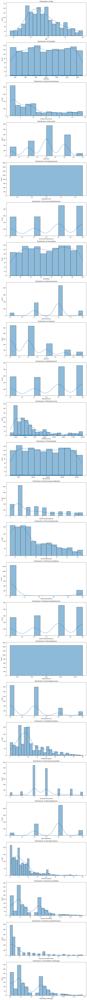

In [49]:
plt.figure(figsize=(12,150))
l=len(num)
k=1
for i in num:
    plt.subplot(l,1,k)
    sns.histplot(data=df,x=i,kde=True)
    sns.rugplot(data=df,x=i)
    plt.title(f'Distribution of {i}')
    k+=1
plt.show()

# Insight:-
# 1. Age:-
- <font color="red"> Distribution is slightly right skewed this might suggest that older employees are either underrepresented in the workforce or leave the company earlier. (Area of investigate ) </font>

- <font color="red">The company might focus on hiring younger employees, but understanding the reasons behind the decline in older employees could help in designing better retention strategies or in ensuring a more balanced age distribution. </font>
 
- majority of employees are in the age range of 25 to 45 years.
- peak is at 30 to 37.
- gradualy decrease in number of employee after age of 40.

# 2. DailyRate :- 
- DailyRate is quite evenly distributed among employees, with some variation that might correspond to different job levels or roles within the company.
  

# 3. DistanceFromHome :-
- Most employees live very close to the company, as indicated companys location in a densely populated area or the employees preference for shorter distance.
- Reason:- densely populated area, traffic, transpotation charges, own preference.

# 4. Education :-
- Mainly this columns is categorical but in this dataset it is treated as discret variable.
- majority of employees fall with education level 2 to 4 with particularly high at education level 3.

In [54]:
# we want to add Education columns to categorical columns cat and remove from num.
cat.append("Education")

In [55]:
num.remove("Education")

# 5. EmployeeCount :-
- This columns indicate that there is no importance of this columns for analysis and prediction.

In [57]:
df.drop(columns="EmployeeCount",inplace=True)

# 6. EnvironmentSatisfaction :-
- Most of the employees are statisfied by the work environment of company but fewer are very much disatisfied with working environment.(investiagtion required )

# 7. HourlyRate:-
- distribution are distributed among all means hourly salary is distributed among all job similarly but quiet difference due to different job levels or roles within the company.

# 8. JobInvolvement :- 
- most of the employee are moderate job involvement (3) but area of concern are those small quantity of employee which are very less job involvement.

# 9. JobLevel :- 
- most of the employee are in lower level.
- This suggests that it might be difficult for employees to move up in the company 
- that the company is structured in a way that favors a larger number of employees at lower levels.

# 10. JobSatisfaction :-
- distribution is left skewed means most of the employees are happy with there job but fewer are not satisfied with there job.

# 11. MonthlyIncome :-
- The right-skewness suggests a degree of income inequality within the organization, with a larger proportion of employees earning lower salaries and a smaller proportion earning higher salaries.
- 2500 to 5000 is the common monthly income of employess.

# 12. MonthlyRate :- 
- Monthly income range distributed among similarly with all employess.

# 13. NumCompaniesWorked :-
- maximum number of employee have only one company experience suggesting that many employees exhibit strong loyalty or stability, staying with a single employer throughout their careers.
- company hire a large number of freshers.


# 14. PercentSalaryHike :- 
- Distribution is right skewed means fewer employee are performing very well that why only few employee get higher hike in their salary.
- Average employee get 10% - 15% salary hike.

# 15. PerformanceRating :
- the average rating is 3 and fewer are high rating 4 maybe fewer are get high rating that replicate salary hike.

# 16. RelationshipSatisfaction :
- most of the employees are high Relationship Satisfaction means they get support from supervisors and colleagues.
- few employee may be experiencing issues in their work relationships, such as conflicts, lack of support, or poor communication, 

# 17. StandardHours :-
- this features values are same for all employee so we remove this features from the datasets.

In [70]:
df.drop(columns="StandardHours",inplace=True)

# 18. StockOptionLevel : 
- Right skewed means very few employees get more than 1 stock option.
- most of the employee have 0 or 1 stock option.

# 19. TotalWorkingYears :- 
- Right skewed distribution 
- most of the employee work experience lie between 5 to 12.
- as the working year increase employee left the company (investigation)

# 20. TrainingTimesLastYear :
- normal distribution
- most of the employee train 2-3 times previous year.
- few are not train .

# 21. WorkLifeBalance : 
- few employee are think their work life is well balance and few are think work life is very badly unbalance.
- most of the employees give 3 rating which is 2nd highest rating means they think their work life going in balance ( Average ) way.

# 22. YearsAtCompany : 
- distribution is right skewed 
- after 10 year in the company most of the people start leaveing the company. ( their may be multiple reason for leaving )[investigation]
- as the experience increase the chances of employee stay in the company is decrease.

# 23. YearsInCurrentRole :
- most of the employee job role change within 5 years but rare employee get stack in same job role for more than 12 years.

# 24. YearsSinceLastPromotion :
- dataset contain most of the employee which recently get promotion within 1-2 years.

# 25. YearsWithCurrManager: 
- While the majority of employees have been with their current manager for a shorter duration, there are a few individuals who have had long-term relationships with their managers.

# 3.2 Bivariate Analysis and Multivariate Analysis

In [80]:
df["Attrition"].value_counts(normalize=True)*100

Attrition
No     83.877551
Yes    16.122449
Name: proportion, dtype: float64

In [81]:
df["Attrition"].value_counts()

Attrition
No     1233
Yes     237
Name: count, dtype: int64

# 3.2.1. Age and Attrition

<Figure size 1600x800 with 0 Axes>

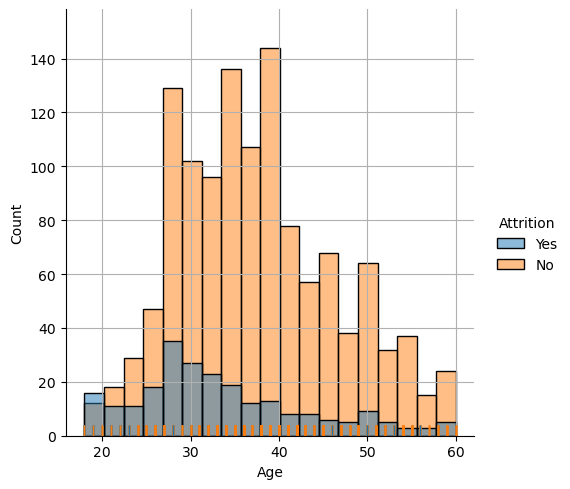

In [83]:
plt.figure(figsize=(16,8))
sns.displot(data=df,x="Age",hue="Attrition",rug=True)
plt.grid()
plt.show()

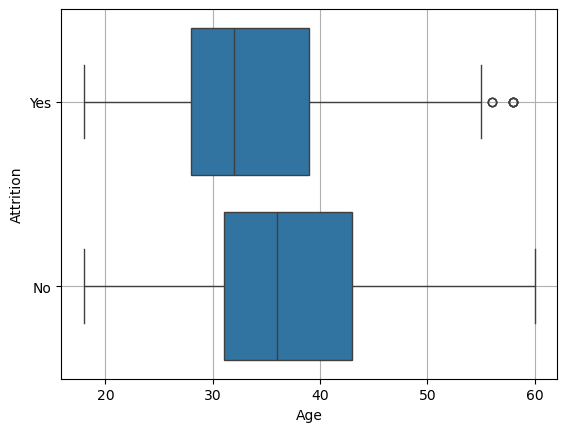

In [84]:
sns.boxplot(data=df,x='Age',y="Attrition")
plt.grid()

#  Age and Attrition Insight :- 
- [+ve point] majority of employee stay in company are above 35 year age. 
- [-ve point] majority of employee leave company are below 30 year age.
- [-ve point] 50% of employee which has leaved the company is of age below 32.

Possible Reason:-
- <font color="red"> Employees age below 30 are more prone to leaving the company, which might indicate a higher job turnover among younger employees. This could be due to various factors like seeking better opportunities, job dissatisfaction, or career changes. </font>

# 3.2.2. Age,Gender and Attrition

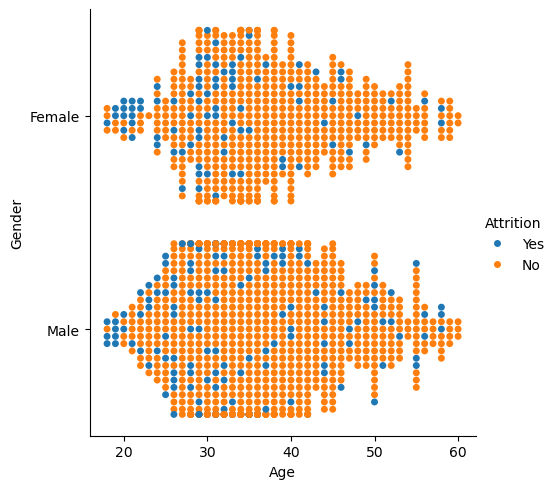

In [88]:
sns.catplot(data=df,x="Age",y="Gender",hue="Attrition",kind="swarm")
#  "strip", "swarm", "box", "violin","boxen", "point", "bar", or "count".

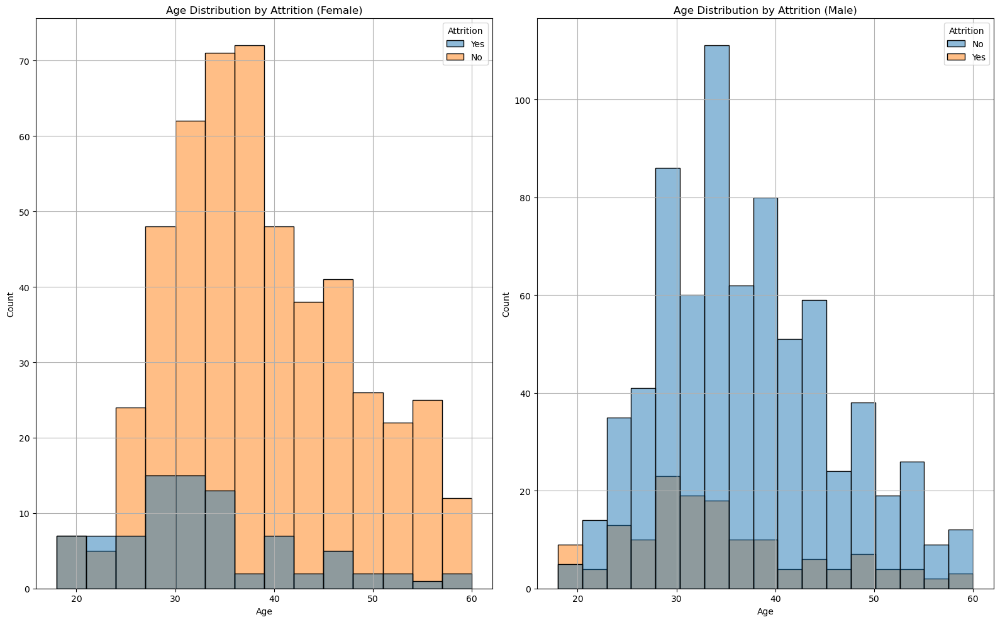

In [89]:
fig, ax = plt.subplots(1, 2, figsize=(16, 10))

# Plot for Female
sns.histplot(data=df[df["Gender"]=="Female"], x="Age", hue="Attrition", ax=ax[0])
ax[0].set_title('Age Distribution by Attrition (Female)')
ax[0].grid()

# Plot for Male
sns.histplot(data=df[df["Gender"]=="Male"], x="Age", hue="Attrition", ax=ax[1])
ax[1].set_title('Age Distribution by Attrition (Male)')

# Show the plots
ax[1].grid()
plt.tight_layout()
plt.show()

# Age,Gender and Attrition Insight:- 
- (+ve point) After the age of 35 of Female their was certain decrease in Attrition rate.

In [91]:
# sns.catplot(data=df,x="Age",hue="Gender",col="Attrition",kind="count")
# #  "strip", "swarm", "box", "violin","boxen", "point", "bar", or "count".

# 3.2.3. Age, MaritalStatus, Gender and Attrition 

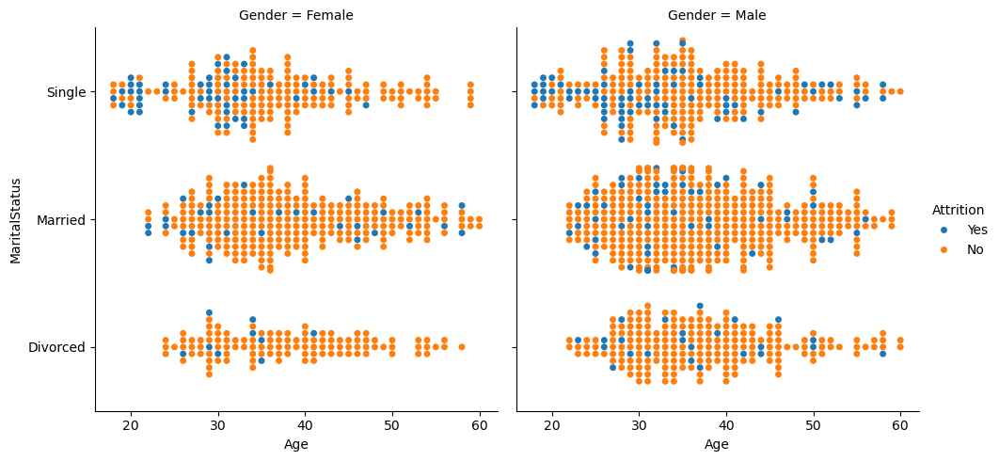

In [93]:
sns.catplot(data=df,x="Age",y="MaritalStatus",hue="Attrition",kind="swarm",col="Gender")
#  "strip", "swarm", "box", "violin","boxen", "point", "bar", or "count".

 # MaritalStatus, Age,Gender and Attrition Insight :-
- [+ve point] Divorced female of age above 35 are less interested for switching different company. (divorced female above 35 year of age are more loyal to the company.)

# 3.2.4. Age,Education, Gender and Attrition 

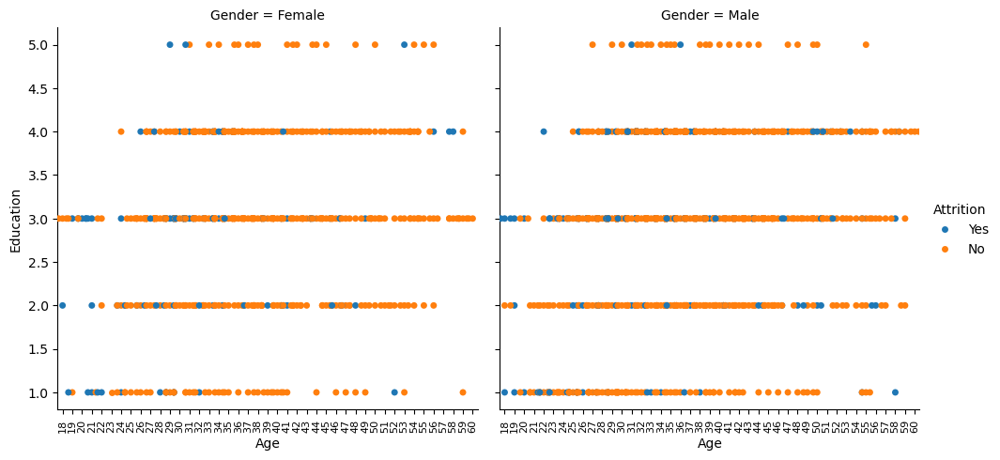

In [96]:
g= sns.catplot(data=df,x="Age",y="Education",hue="Attrition",kind="swarm",col="Gender")
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=8)
plt.show()

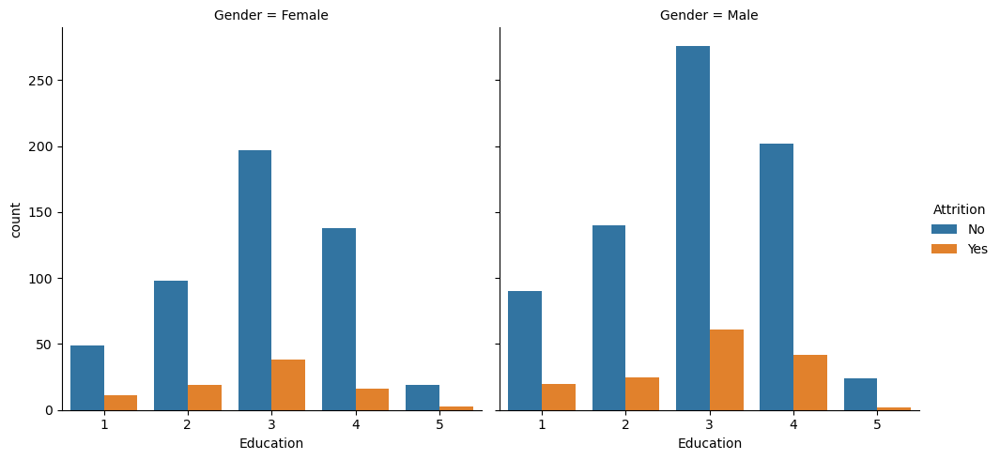

In [97]:
sns.catplot(data=df,x="Education",hue="Attrition",col="Gender",kind="count")

In [98]:
Male_Education=pd.crosstab(df[df["Gender"]=="Male"]["Education"],df[df["Gender"]=="Male"]["Attrition"])
(Male_Education["Yes"]*100)/(Male_Education["Yes"]+Male_Education["No"])

Education
1    18.181818
2    15.151515
3    18.100890
4    17.213115
5     7.692308
dtype: float64

In [99]:
Female_Education=pd.crosstab(df[df["Gender"]=="Female"]["Education"],df[df["Gender"]=="Female"]["Attrition"])
(Female_Education["Yes"]*100)/(Female_Education["Yes"]+Female_Education["No"])

Education
1    18.333333
2    16.239316
3    16.170213
4    10.389610
5    13.636364
dtype: float64

# Education, Gender and Attrition Insight:
- [ +vepoint ] Male person with education level 5 is low attrition rate.

# 3.2.5. EducationField,Age,Gender and Attrition.

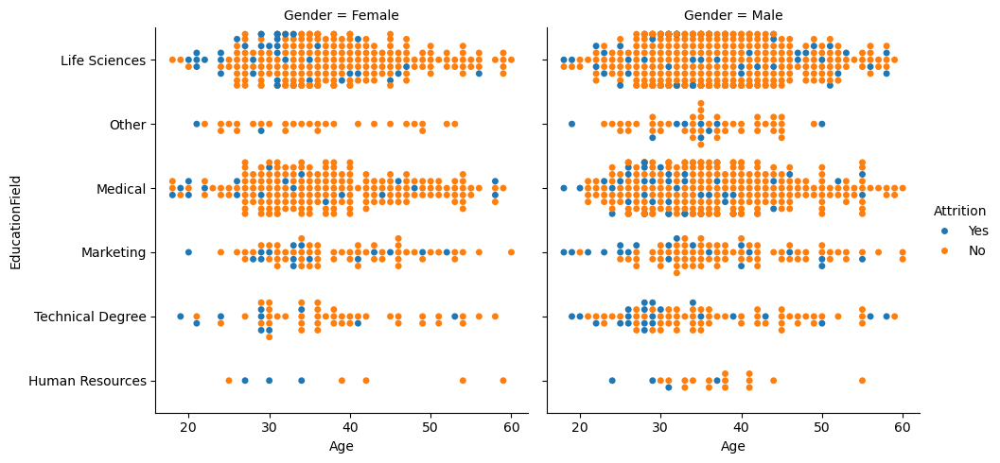

In [102]:
sns.catplot(data=df,x="Age",y="EducationField",hue="Attrition",kind="swarm",col="Gender")

In [103]:
Female_Education_Field=pd.crosstab(df[df["Gender"]=="Female"]["EducationField"],df[df["Gender"]=="Female"]["Attrition"])
(Female_Education_Field["Yes"]*100)/(Female_Education_Field["Yes"]+Female_Education_Field["No"])

EducationField
Human Resources     37.500000
Life Sciences       15.833333
Marketing           21.739130
Medical             10.000000
Other                6.896552
Technical Degree    19.230769
dtype: float64

In [104]:
Female_Education_Field=pd.crosstab(df[df["Gender"]=="Male"]["EducationField"],df[df["Gender"]=="Male"]["Attrition"])
(Female_Education_Field["Yes"]*100)/(Female_Education_Field["Yes"]+Female_Education_Field["No"])

EducationField
Human Resources     21.052632
Life Sciences       13.934426
Marketing           22.222222
Medical             16.058394
Other               16.981132
Technical Degree    27.500000
dtype: float64

# EducationField,Age,Gender and Attrition Insight :
- [-ve point ] Marketing, Human Resources and Technical Degree Education Field employee are high Attrition rate.

# 3.2.6. Job level ,Gender and Attrition

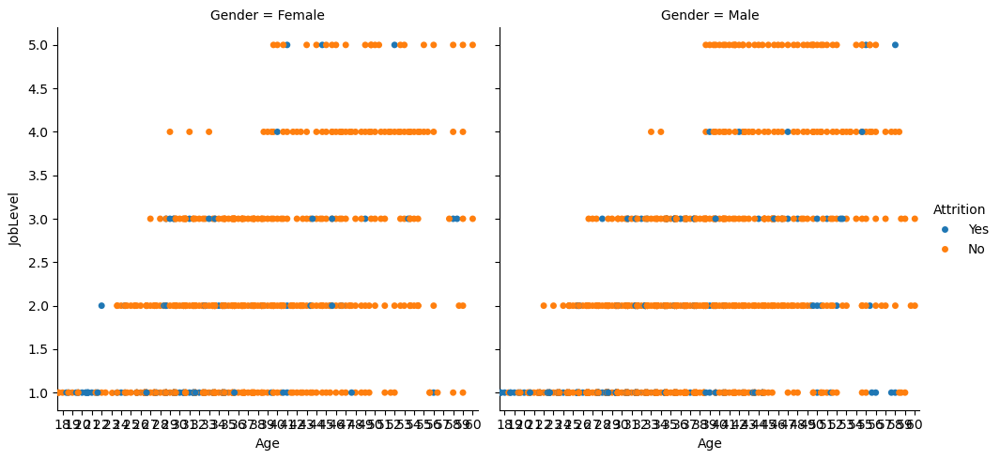

In [107]:
sns.catplot(data=df,y="JobLevel",x="Age",hue="Attrition",kind="swarm",col="Gender")

In [108]:
job_level_Attrition=pd.crosstab(df["JobLevel"],df["Attrition"])
job_level_Attrition

Attrition,No,Yes
JobLevel,,
1,400,143
2,482,52
3,186,32
4,101,5
5,64,5


In [109]:
(job_level_Attrition.iloc[:,1]*100)/(job_level_Attrition.iloc[:,0]+job_level_Attrition.iloc[:,1])

JobLevel
1    26.335175
2     9.737828
3    14.678899
4     4.716981
5     7.246377
dtype: float64

In [110]:
job_level_Attrition_Female=pd.crosstab(df[df["Gender"]=="Female"]["JobLevel"],df[df["Gender"]=="Female"]["Attrition"])
job_level_Attrition_Female

Attrition,No,Yes
JobLevel,,
1,146,53
2,202,18
3,82,12
4,50,1
5,21,3


In [111]:
(job_level_Attrition_Female.iloc[:,1]*100)/(job_level_Attrition_Female.iloc[:,0]+job_level_Attrition_Female.iloc[:,1])

JobLevel
1    26.633166
2     8.181818
3    12.765957
4     1.960784
5    12.500000
dtype: float64

In [112]:
job_level_Attrition_Male=pd.crosstab(df[df["Gender"]=="Male"]["JobLevel"],df[df["Gender"]=="Male"]["Attrition"])
job_level_Attrition_Male

Attrition,No,Yes
JobLevel,,
1,254,90
2,280,34
3,104,20
4,51,4
5,43,2


In [113]:
(job_level_Attrition_Male.iloc[:,1]*100)/(job_level_Attrition_Male.iloc[:,0]+job_level_Attrition_Male.iloc[:,1])

JobLevel
1    26.162791
2    10.828025
3    16.129032
4     7.272727
5     4.444444
dtype: float64

# Job level ,Gender and Attrition Insight :
- [-ve point ]Employee with Joblevel 1 are high Attrition rate whether it is male or female.
- [+ve point ]level 4 employee are very low Attrition rate in both Gender but male Attrition rate is quite high than the Female Attrition rate in 4 job level.

# 3.2.7. JobRole ,Gender and Attrition 

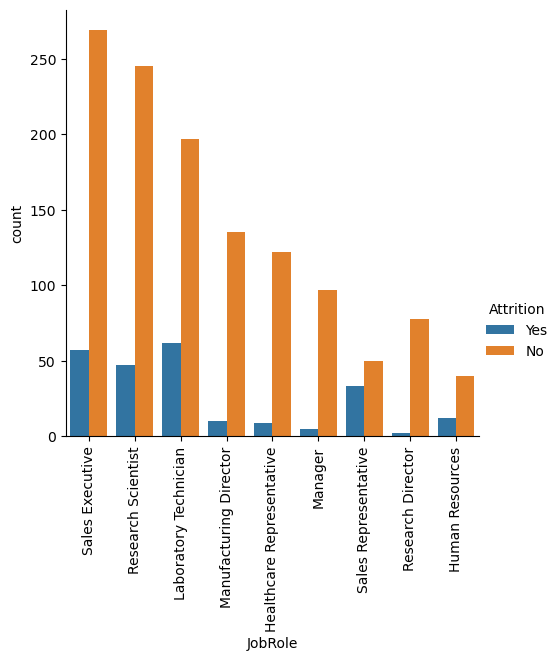

In [116]:
sns.catplot(data=df,x="JobRole",hue="Attrition",kind="count")
plt.xticks(rotation=90)
plt.show()

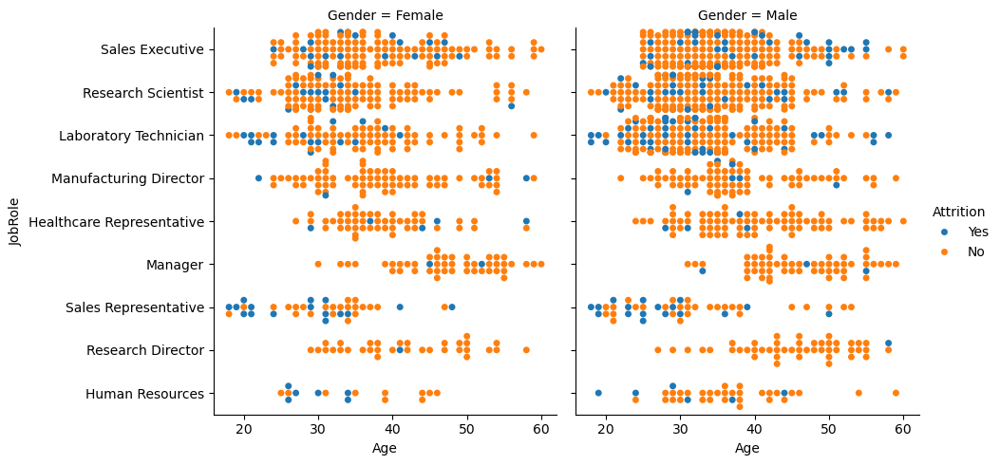

In [117]:
 sns.catplot(data=df,x="Age",y="JobRole",hue="Attrition",kind="swarm",col="Gender")

In [118]:
jobrole_Attrition_ratio=pd.crosstab(df["JobRole"],df["Attrition"])
(jobrole_Attrition_ratio["Yes"]*100)/(jobrole_Attrition_ratio["Yes"]+jobrole_Attrition_ratio["No"])

JobRole
Healthcare Representative     6.870229
Human Resources              23.076923
Laboratory Technician        23.938224
Manager                       4.901961
Manufacturing Director        6.896552
Research Director             2.500000
Research Scientist           16.095890
Sales Executive              17.484663
Sales Representative         39.759036
dtype: float64

In [119]:
jobrole_Attrition_ratio_Female=pd.crosstab(df[df["Gender"]=="Female"]["JobRole"],df[df["Gender"]=="Female"]["Attrition"])

In [120]:
(jobrole_Attrition_ratio_Female["Yes"]*100)/(jobrole_Attrition_ratio_Female["Yes"]+jobrole_Attrition_ratio_Female["No"])

JobRole
Healthcare Representative     9.803922
Human Resources              37.500000
Laboratory Technician        18.823529
Manager                       4.255319
Manufacturing Director        5.555556
Research Director             3.030303
Research Scientist           14.912281
Sales Executive              15.151515
Sales Representative         42.105263
dtype: float64

In [121]:
jobrole_Attrition_ratio_Male=pd.crosstab(df[df["Gender"]=="Male"]["JobRole"],df[df["Gender"]=="Male"]["Attrition"])

In [122]:
(jobrole_Attrition_ratio_Male["Yes"]*100)/(jobrole_Attrition_ratio_Male["Yes"]+jobrole_Attrition_ratio_Male["No"])

JobRole
Healthcare Representative     5.000000
Human Resources              16.666667
Laboratory Technician        26.436782
Manager                       5.454545
Manufacturing Director        8.219178
Research Director             2.127660
Research Scientist           16.853933
Sales Executive              19.072165
Sales Representative         37.777778
dtype: float64

# JobRole ,Gender and Attrition Insight:
- [-ve point] male are little bit higher attrition rate than female.
- [+ve point] Research Director, Manager, Manufacturing Director and Healthcare Representative are more stable than other job role.
- [-ve point] 'Human Resources', 'Laboratory Technician','Research Scientist', 'Sales Executive', 'Sales Representative' are unstable with the company.
- [-ve point] Sales Representative are higher Attrition rate. (investigate and )
- [-ve point] may be attrition rate of these job role is high due to low income in the company.

# 3.2.8. Department,Age,Gender and Attrition

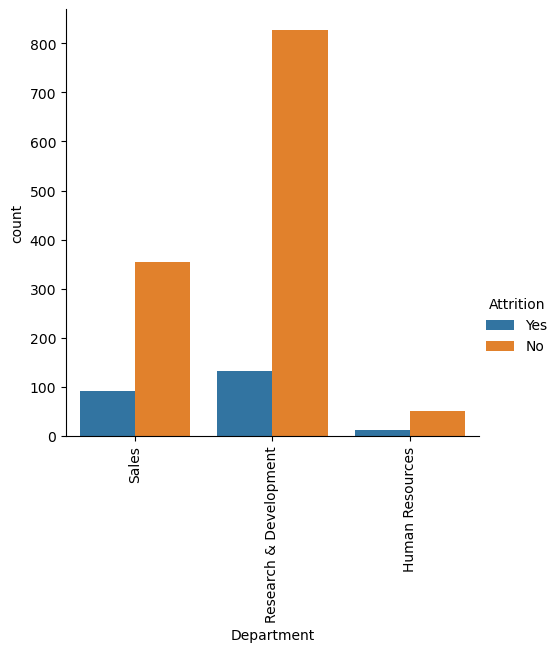

In [125]:
sns.catplot(data=df,x="Department",hue="Attrition",kind="count")
plt.xticks(rotation=90)
plt.show()

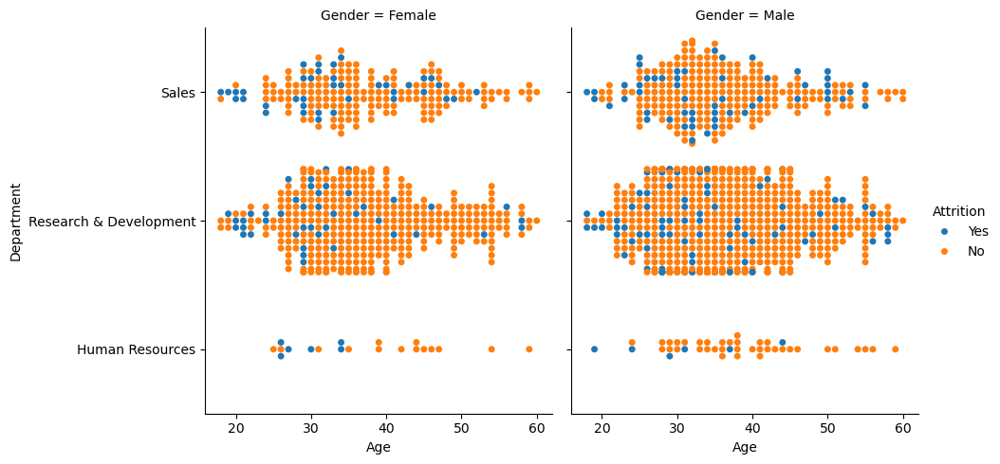

In [126]:
sns.catplot(data=df,x="Age",y="Department",hue="Attrition",kind="swarm",col="Gender")

In [127]:
Department_Attrition_ratio=pd.crosstab(df["Department"],df["Attrition"])

In [128]:
(Department_Attrition_ratio["Yes"]*100)/(Department_Attrition_ratio["Yes"]+Department_Attrition_ratio["No"])

Department
Human Resources           19.047619
Research & Development    13.839750
Sales                     20.627803
dtype: float64

In [129]:
Department_Attrition_ratio_Female=pd.crosstab(df[df["Gender"]=="Female"]["Department"],df[df["Gender"]=="Female"]["Attrition"])

In [130]:
(Department_Attrition_ratio_Female["Yes"]*100)/(Department_Attrition_ratio_Female["Yes"]+Department_Attrition_ratio_Female["No"])

Department
Human Resources           30.000000
Research & Development    11.345646
Sales                     20.105820
dtype: float64

In [131]:
Department_Attrition_ratio_Male=pd.crosstab(df[df["Gender"]=="Male"]["Department"],df[df["Gender"]=="Male"]["Attrition"])

In [132]:
(Department_Attrition_ratio_Male["Yes"]*100)/(Department_Attrition_ratio_Male["Yes"]+Department_Attrition_ratio_Male["No"])

Department
Human Resources           13.953488
Research & Development    15.463918
Sales                     21.011673
dtype: float64

# Department,Age,Gender and Attrition Insight:
- No Insight

# 3.2.9. BusinessTravel

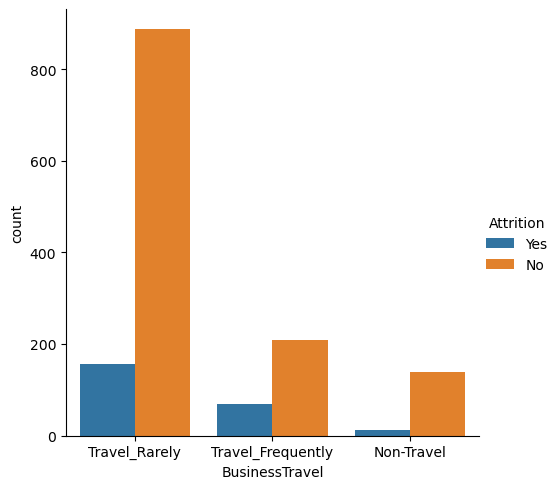

In [135]:
sns.catplot(data=df,x="BusinessTravel",hue="Attrition",kind="count")

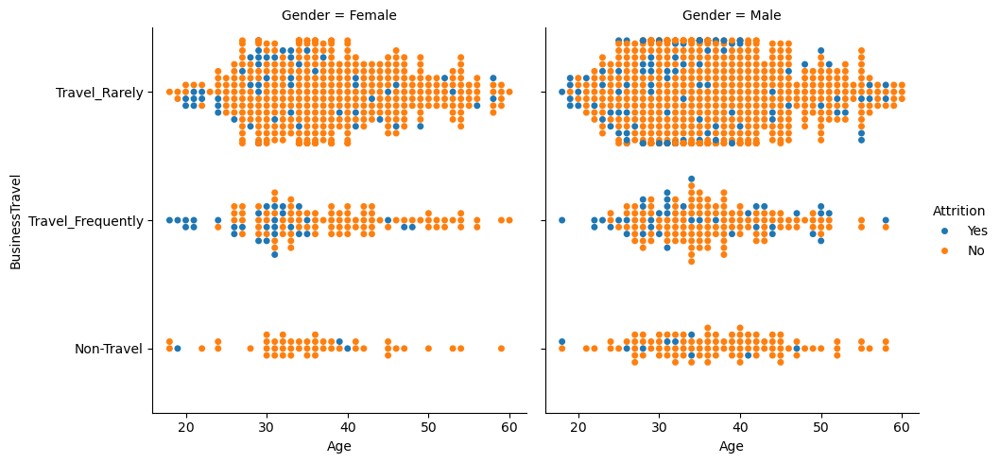

In [136]:
sns.catplot(data=df,y="BusinessTravel",x="Age",hue="Attrition",kind="swarm",col="Gender")

In [137]:
pd.crosstab(df["BusinessTravel"],df["Attrition"])

Attrition,No,Yes
BusinessTravel,,
Non-Travel,138,12
Travel_Frequently,208,69
Travel_Rarely,887,156


In [138]:
bt=pd.crosstab(df["BusinessTravel"],df["Attrition"])
btm=pd.crosstab(df[df["Gender"]=="Male"]["BusinessTravel"],df[df["Gender"]=="Male"]["Attrition"])
btf=pd.crosstab(df[df["Gender"]=="Female"]["BusinessTravel"],df[df["Gender"]=="Female"]["Attrition"])

In [139]:
print((bt.iloc[:,1]*100)/(bt.iloc[:,0]+bt.iloc[:,1]))
print((btm.iloc[:,1]*100)/(btm.iloc[:,0]+btm.iloc[:,1]))
print((btf.iloc[:,1]*100)/(btf.iloc[:,0]+btf.iloc[:,1]))

BusinessTravel
Non-Travel            8.000000
Travel_Frequently    24.909747
Travel_Rarely        14.956855
dtype: float64
BusinessTravel
Non-Travel            8.910891
Travel_Frequently    24.375000
Travel_Rarely        16.425121
dtype: float64
BusinessTravel
Non-Travel            6.122449
Travel_Frequently    25.641026
Travel_Rarely        12.796209
dtype: float64


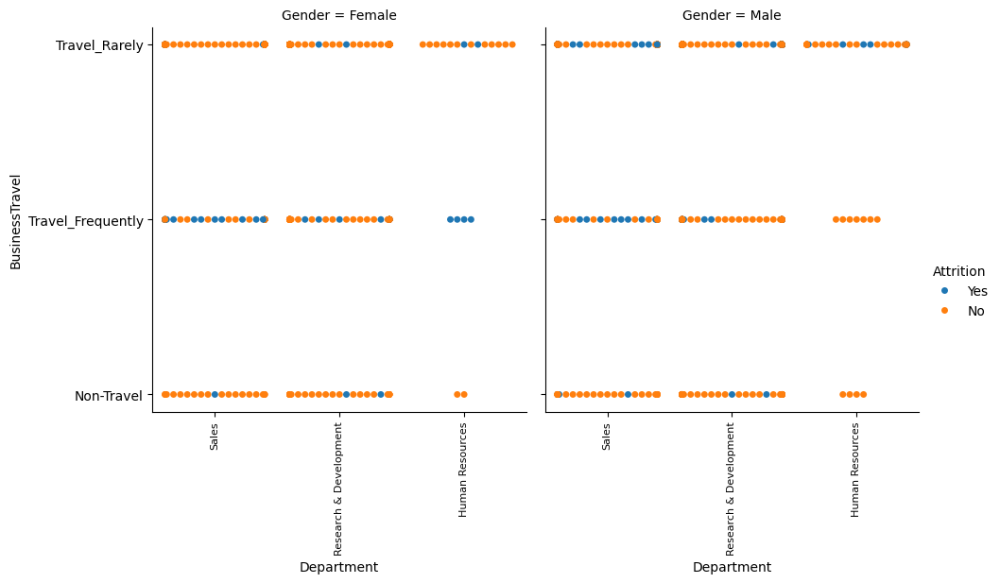

In [140]:
g=sns.catplot(data=df,y="BusinessTravel",x="Department",hue="Attrition",kind="swarm",col="Gender")
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=8)
plt.show()

# BusinessTravel Insight:
- [+ve point]as usual after the age of 32 Attrition rate decrease in female.
- [+ve point]Non-Travel are more stable mean they have low Attrition rate.

# 3.2.10. DistanceFromHome

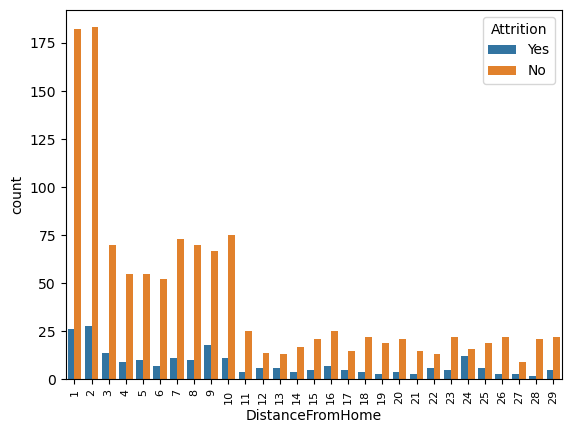

In [143]:
sns.countplot(data=df,x="DistanceFromHome",hue="Attrition")
plt.xticks(rotation=90, fontsize=8)
plt.show()

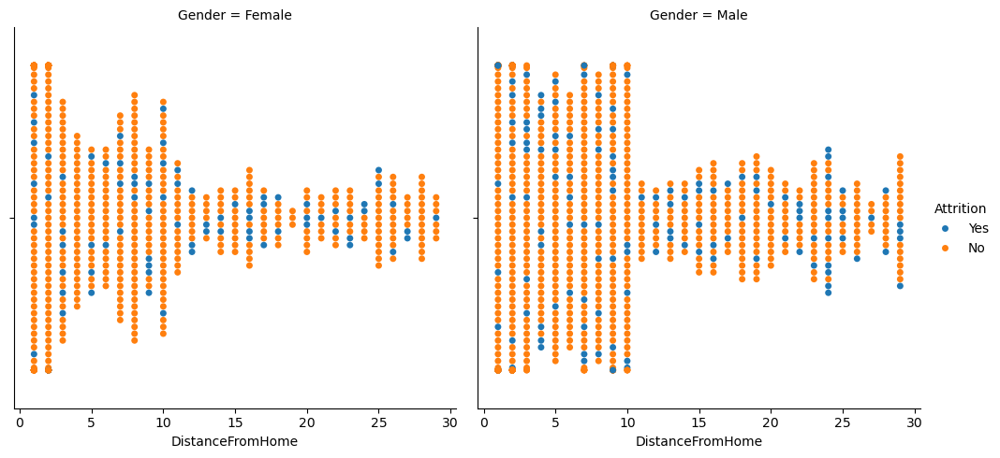

In [144]:
sns.catplot(data=df,x="DistanceFromHome",hue="Attrition",col="Gender",kind="swarm")

In [145]:
dfh_m=pd.crosstab(df[df["Gender"]=="Male"]["DistanceFromHome"],df[df["Gender"]=="Male"]["Attrition"])
dfh_m.head()

Attrition,No,Yes
DistanceFromHome,,
1,106,16
2,105,19
3,40,8
4,29,9
5,37,6


In [146]:
(dfh_m.loc[:,"Yes"]*100)/(dfh_m.loc[:,"No"]+dfh_m.loc[:,"Yes"])

DistanceFromHome
1     13.114754
2     15.322581
3     16.666667
4     23.684211
5     13.953488
6     13.157895
7     13.207547
8     16.279070
9     19.047619
10    11.764706
11     8.333333
12    30.000000
13    33.333333
14    18.181818
15    25.000000
16    17.647059
17    18.181818
18    11.111111
19    15.789474
20     6.666667
21    18.181818
22    40.000000
23    11.111111
24    45.454545
25    40.000000
26     8.333333
27    20.000000
28    20.000000
29    20.000000
dtype: float64

In [147]:
dfh_f=pd.crosstab(df[df["Gender"]=="Female"]["DistanceFromHome"],df[df["Gender"]=="Female"]["Attrition"])
dfh_f.head()

Attrition,No,Yes
DistanceFromHome,,
1,76,10
2,78,9
3,30,6
4,26,0
5,18,4


In [148]:
(dfh_f.loc[:,"Yes"]*100)/(dfh_f.loc[:,"No"]+dfh_f.loc[:,"Yes"])

DistanceFromHome
1     11.627907
2     10.344828
3     16.666667
4      0.000000
5     18.181818
6      9.523810
7     12.903226
8      8.108108
9     27.272727
10    14.285714
11    17.647059
12    30.000000
13    28.571429
14    20.000000
15    10.000000
16    26.666667
17    33.333333
18    25.000000
19     0.000000
20    30.000000
21    14.285714
22    22.222222
23    33.333333
24    33.333333
25    13.333333
26    15.384615
27    28.571429
28     0.000000
29    14.285714
dtype: float64

In [149]:
dfh=pd.crosstab(df["DistanceFromHome"],df["Attrition"])
(dfh.loc[:,"Yes"]*100)/(dfh.loc[:,"No"]+dfh.loc[:,"Yes"])

DistanceFromHome
1     12.500000
2     13.270142
3     16.666667
4     14.062500
5     15.384615
6     11.864407
7     13.095238
8     12.500000
9     21.176471
10    12.790698
11    13.793103
12    30.000000
13    31.578947
14    19.047619
15    19.230769
16    21.875000
17    25.000000
18    15.384615
19    13.636364
20    16.000000
21    16.666667
22    31.578947
23    18.518519
24    42.857143
25    24.000000
26    12.000000
27    25.000000
28     8.695652
29    18.518519
dtype: float64

# 3.2.11. NumCompaniesWorked,Gender,Attrition

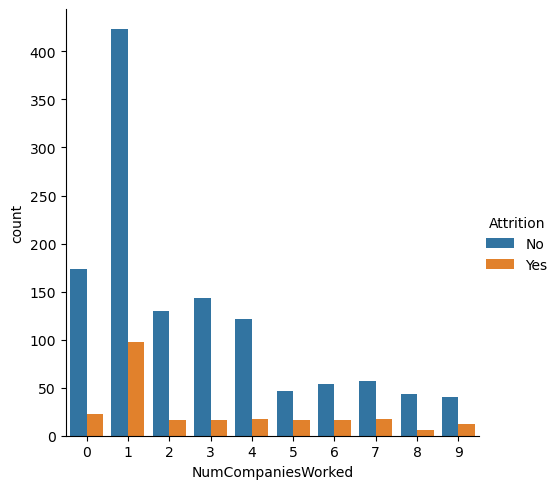

In [151]:
sns.catplot(data=df,x="NumCompaniesWorked",hue="Attrition",kind="count")

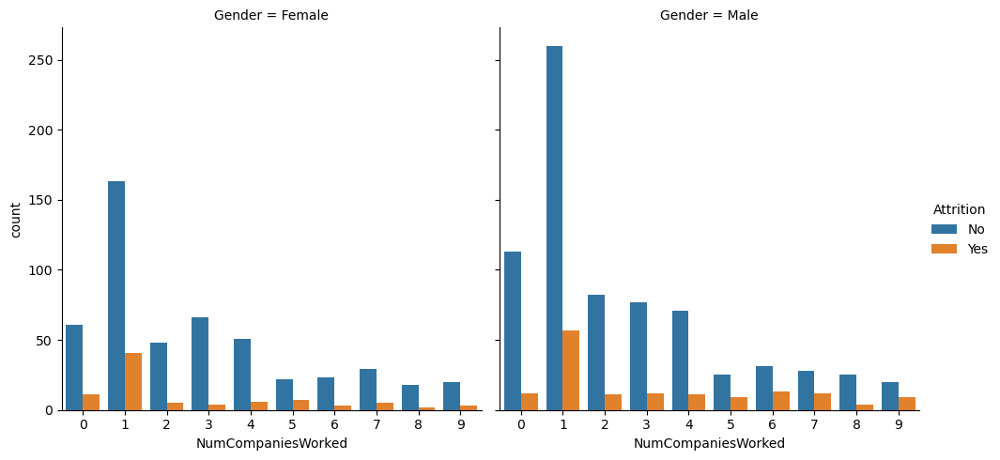

In [152]:
sns.catplot(data=df,x="NumCompaniesWorked",col="Gender",hue="Attrition",kind="count")

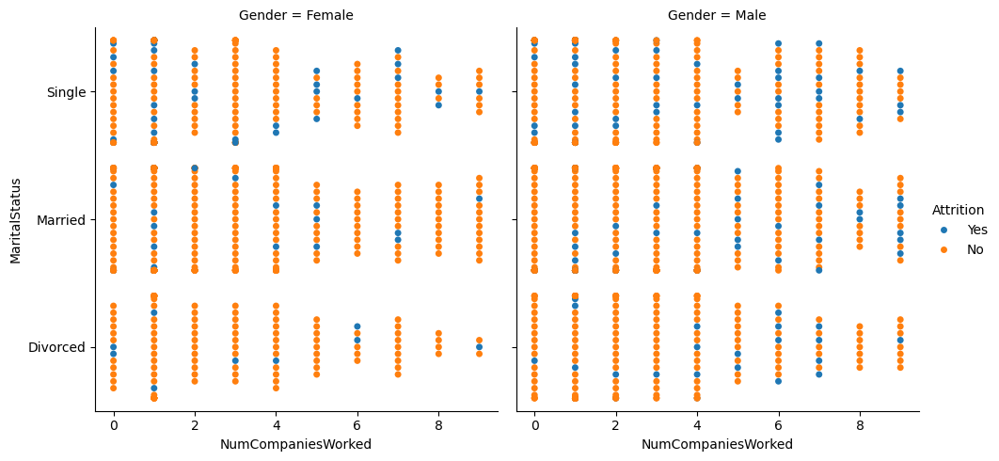

In [153]:
sns.catplot(data=df,x="NumCompaniesWorked",y="MaritalStatus",col="Gender",hue="Attrition",kind="swarm")

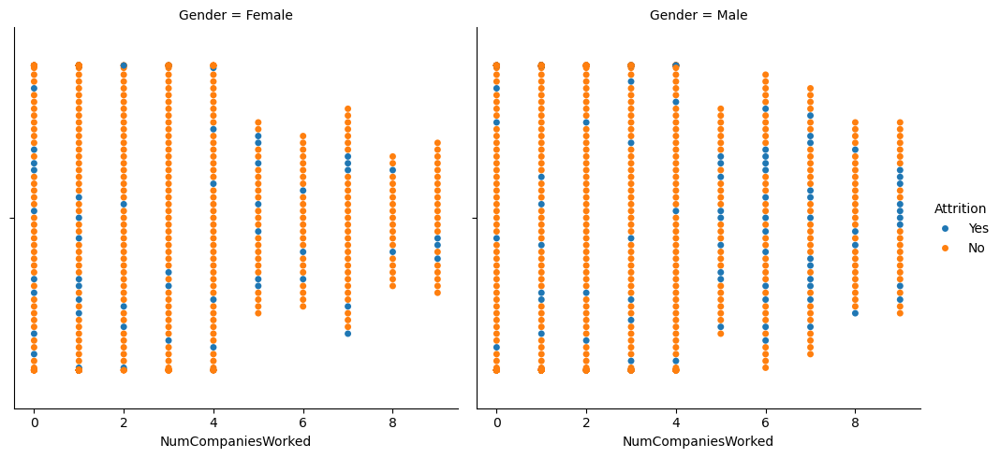

In [154]:
sns.catplot(data=df,x="NumCompaniesWorked",col="Gender",hue="Attrition",kind="swarm")

In [155]:
ncw=pd.crosstab(df["NumCompaniesWorked"],df["Attrition"])
(ncw.loc[:,"Yes"]*100)/(ncw.loc[:,"No"]+ncw.loc[:,"Yes"])

NumCompaniesWorked
0    11.675127
1    18.809981
2    10.958904
3    10.062893
4    12.230216
5    25.396825
6    22.857143
7    22.972973
8    12.244898
9    23.076923
dtype: float64

In [156]:
ncw_m=pd.crosstab(df[df["Gender"]=="Male"]["NumCompaniesWorked"],df[df["Gender"]=="Male"]["Attrition"])
(ncw_m.loc[:,"Yes"]*100)/(ncw_m.loc[:,"No"]+ncw_m.loc[:,"Yes"])

NumCompaniesWorked
0     9.600000
1    17.981073
2    11.827957
3    13.483146
4    13.414634
5    26.470588
6    29.545455
7    30.000000
8    13.793103
9    31.034483
dtype: float64

In [157]:
ncw_f=pd.crosstab(df[df["Gender"]=="Female"]["NumCompaniesWorked"],df[df["Gender"]=="Female"]["Attrition"])
(ncw_f.loc[:,"Yes"]*100)/(ncw_f.loc[:,"No"]+ncw_f.loc[:,"Yes"])

NumCompaniesWorked
0    15.277778
1    20.098039
2     9.433962
3     5.714286
4    10.526316
5    24.137931
6    11.538462
7    14.705882
8    10.000000
9    13.043478
dtype: float64

# NumCompaniesWorked Insight:
-As the number of companies worked (indicating work experience) increases among male employees, the attrition rate also tends to rise.

# Overall Negative Summary of Demographic Distribution Analysis
- Younger employees (under 30) have a higher attrition rate.
- Marketing, Human Resources, and Technical Degree holders have high attrition rates.
- Job Level 1 shows a high attrition rate for both genders.
- High attrition is seen in roles like Sales Representatives, Human Resources, and Laboratory Technicians, potentially due to low income.
- Males with more work experience (having worked at more companies) show higher attrition rates.

# Overall Positive Summary of Demographic Distribution Analysis
- Employees above 35 are more likely to stay with the company.
- Female attrition rates decrease significantly after age 35.
- Job Level 4 employees have low attrition rates, especially among females.
- Research Directors, Managers, Manufacturing Directors, and Healthcare Representatives are more stable roles.
- Non-traveling employees are more stable and have lower attrition rates.
- Divorced females over 35 show strong company loyalty, with low attrition rates.

# Analyze Key Factors Influencing Turnover

In [163]:
from scipy.stats import chi2_contingency, ttest_ind

In [164]:
df["Attrition1"]=df["Attrition"].replace(("Yes","No"),("1","0"))
df["Attrition1"]=df["Attrition1"].astype("int64")

In [165]:
# we know chi2 only work good in categorical features but our few numerical features can also treat as categorical. 
# we are not using t-test for numerical features.
imp=[]
for i in df.columns:
    contingency_table = pd.crosstab(df['Attrition'], df[i])
    chi2, p, dof, ex = chi2_contingency(contingency_table)
    if p<0.05:
        imp.append(i)
    print(f"Chi-square Test for Attrition vs {i}: p-value = {p}")

Chi-square Test for Attrition vs Age: p-value = 2.5758529842770143e-09
Chi-square Test for Attrition vs Attrition: p-value = 0.0
Chi-square Test for Attrition vs BusinessTravel: p-value = 5.608614476449931e-06
Chi-square Test for Attrition vs DailyRate: p-value = 0.6202800346988611
Chi-square Test for Attrition vs Department: p-value = 0.004525606574479633
Chi-square Test for Attrition vs DistanceFromHome: p-value = 0.09525313501707136
Chi-square Test for Attrition vs Education: p-value = 0.5455253376565949
Chi-square Test for Attrition vs EducationField: p-value = 0.006773980139025222
Chi-square Test for Attrition vs EnvironmentSatisfaction: p-value = 5.1234689062894205e-05
Chi-square Test for Attrition vs Gender: p-value = 0.29057244902890855
Chi-square Test for Attrition vs HourlyRate: p-value = 0.41056974856829825
Chi-square Test for Attrition vs JobInvolvement: p-value = 2.8631806367134195e-06
Chi-square Test for Attrition vs JobLevel: p-value = 6.634684715458909e-15
Chi-square Te

In [166]:
# factors are more likely to influence employee turnover based on the Chi-square test:
imp.remove("Attrition")
imp.remove("Attrition1")
imp

['Age',
 'BusinessTravel',
 'Department',
 'EducationField',
 'EnvironmentSatisfaction',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'NumCompaniesWorked',
 'OverTime',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsWithCurrManager']

In [167]:
notimp=list(set(df.columns)-set(imp))
notimp.remove("Attrition")
notimp.remove("Attrition1")

In [168]:
df[notimp].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   PercentSalaryHike         1470 non-null   int64 
 1   RelationshipSatisfaction  1470 non-null   int64 
 2   Education                 1470 non-null   int64 
 3   PerformanceRating         1470 non-null   int64 
 4   MonthlyRate               1470 non-null   int64 
 5   YearsSinceLastPromotion   1470 non-null   int64 
 6   DistanceFromHome          1470 non-null   int64 
 7   HourlyRate                1470 non-null   int64 
 8   MonthlyIncome             1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  DailyRate                 1470 non-null   int64 
dtypes: int64(10), object(1)
memory usage: 126.5+ KB


# Now, first i am going to work with important features according to chi-squared test.

# 1. JobInvolvement :- 

In [171]:
df.JobInvolvement.value_counts()

JobInvolvement
3    868
2    375
4    144
1     83
Name: count, dtype: int64

<Axes: xlabel='JobInvolvement', ylabel='Count'>

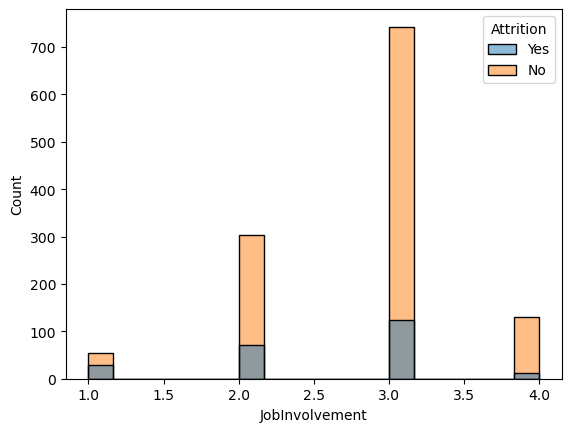

In [172]:
sns.histplot(data=df,x="JobInvolvement",hue="Attrition")

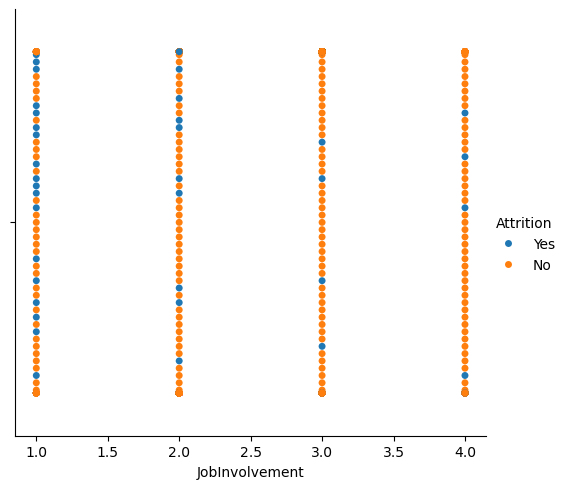

In [173]:
sns.catplot(data=df,x="JobInvolvement",hue="Attrition",kind="swarm")

In [174]:
comp=pd.crosstab(df["JobInvolvement"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

JobInvolvement
1    33.734940
2    18.933333
3    14.400922
4     9.027778
dtype: float64

# Insight :- (High impact)-- continous decrease
- JobInvolvement 1 has the highest attrition rate at 33.7%.
- JobInvolvement 4 has the lowest attrition rate at 9.0%.

# Strategy:
- As JobInvolvement increases, the attrition rate decreases. This suggests that employees with higher job involvement are less likely to leave the company. This pattern indicates that increasing job involvement could be a strategy to improve employee retention.

# 2. JobSatisfaction: 

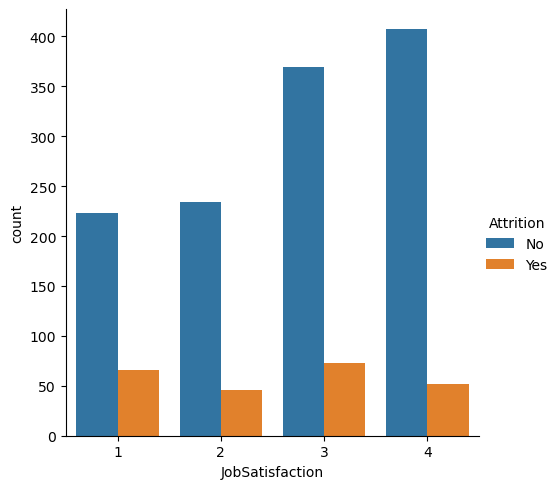

In [178]:
sns.catplot(data=df,x="JobSatisfaction",kind="count",hue="Attrition")

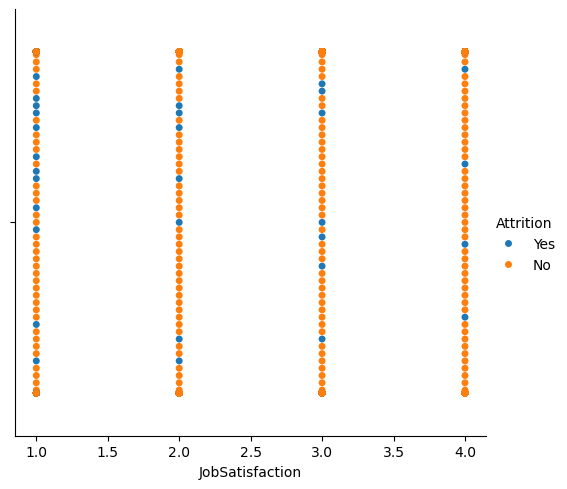

In [179]:
sns.catplot(data=df,x="JobSatisfaction",kind="swarm",hue="Attrition")

In [180]:
comp=pd.crosstab(df["JobSatisfaction"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

JobSatisfaction
1    22.837370
2    16.428571
3    16.515837
4    11.328976
dtype: float64

# Insight :- (Medium impact) variation in decreasing rate.
- JobSatisfaction 1 has the highest attrition rate at 22.8%.
- JobSatisfaction 4 has the lowest attrition rate at 11.3%.
# Strategy:
-  To improve employee retention, it is crucial to focus on increasing job satisfaction. Addressing factors that contribute to job satisfaction can help in reducing the attrition rate.

# 3. WorkLifeBalance

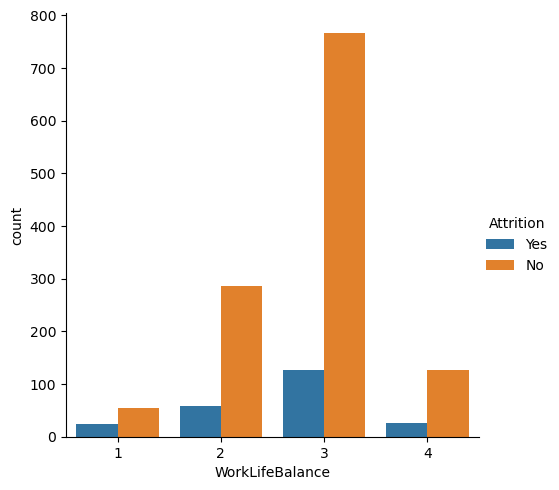

In [183]:
sns.catplot(data=df,x="WorkLifeBalance",hue="Attrition",kind="count")

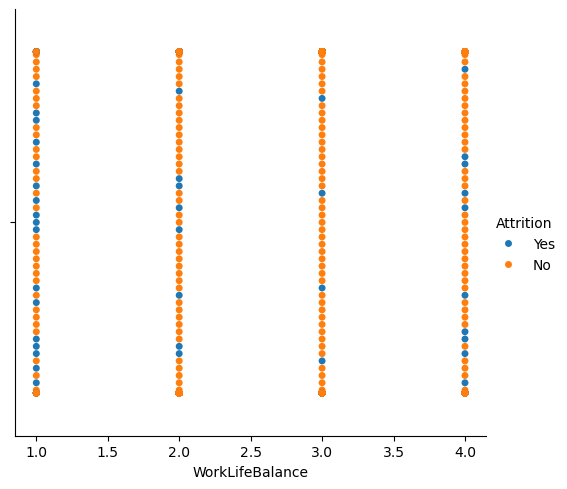

In [184]:
sns.catplot(data=df,x="WorkLifeBalance",hue="Attrition",kind="swarm")

In [185]:
comp=pd.crosstab(df["WorkLifeBalance"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

WorkLifeBalance
1    31.250000
2    16.860465
3    14.221725
4    17.647059
dtype: float64

# Insight:
-  WorkLifeBalance level 1 has the highest attrition rate at 31.25%. This indicates that employees with very poor work-life balance are significantly more likely to leave the company.

# Strategy:
- For employees with WorkLifeBalance 1, may addressing issues related to workload, flexibility, and overall job satisfaction can help in reducing the high attrition rate.

# 4. EnvironmentSatisfaction

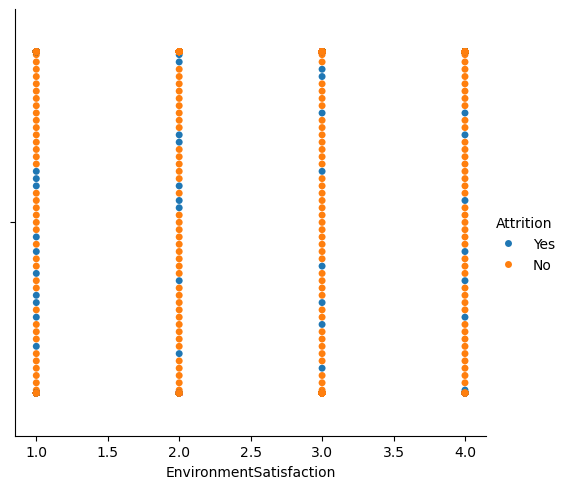

In [189]:
sns.catplot(data=df,x="EnvironmentSatisfaction",hue="Attrition",kind="swarm")

In [190]:
comp=pd.crosstab(df["EnvironmentSatisfaction"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

EnvironmentSatisfaction
1    25.352113
2    14.982578
3    13.686534
4    13.452915
dtype: float64

# Insight:
- EnvironmentSatisfaction level 1 has the highest attrition rate at 25.35%. This indicates that employees with very low environment satisfaction are significantly more likely to leave the company.
# Strategy: 
- For employees with EnvironmentSatisfaction level 1, addressing concerns related to the work environment, such as office conditions, management practices, and team dynamics, can help reduce the high attrition rate.

# 5. RelationshipSatisfaction (" according to chi-sqaured it has less impact" )

In [193]:
comp=pd.crosstab(df["RelationshipSatisfaction"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

RelationshipSatisfaction
1    20.652174
2    14.851485
3    15.468410
4    14.814815
dtype: float64

In [194]:
df["RelationshipSatisfaction"].value_counts()

RelationshipSatisfaction
3    459
4    432
2    303
1    276
Name: count, dtype: int64

# Insight:
- RelationshipSatisfaction level 1 has the highest attrition rate at 20.65%. This indicates that employees with very low satisfaction regarding their relationships at work are more likely to leave the company.
# Strategy:
- Improving relationship satisfaction among employees can help reduce attrition. Organizations should work on fostering a positive and supportive work culture to enhance interpersonal relationships and reduce turnover.

# 6. MonthlyIncome

<Axes: xlabel='MonthlyIncome', ylabel='Count'>

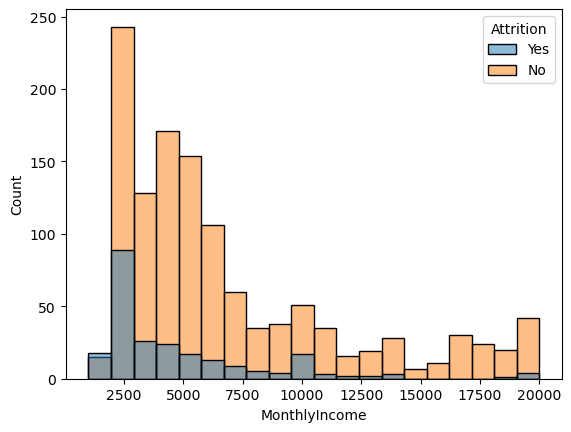

In [197]:
sns.histplot(data=df,x="MonthlyIncome",hue="Attrition")

<Axes: xlabel='Attrition', ylabel='MonthlyIncome'>

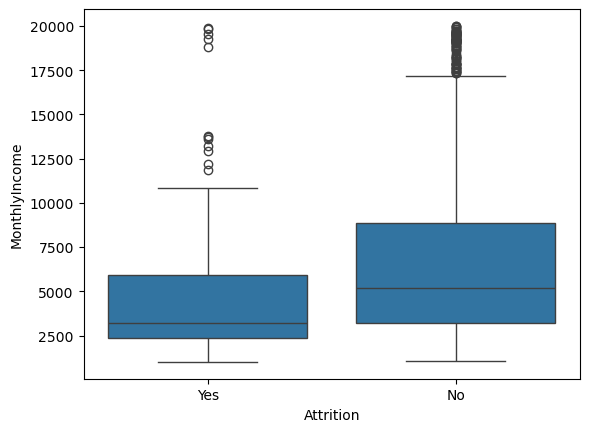

In [198]:
sns.boxplot(data=df,x="Attrition",y="MonthlyIncome")

# Insight:-
- Employee who stayed tend to have a higher median monthly income compare to those who left.
# Strategy:-
- Providing higher salaries or incentives to attract and retain top talent.
- Recognizing and rewarding top performers to boost morale and retention.

# 7. StockOptionLevel

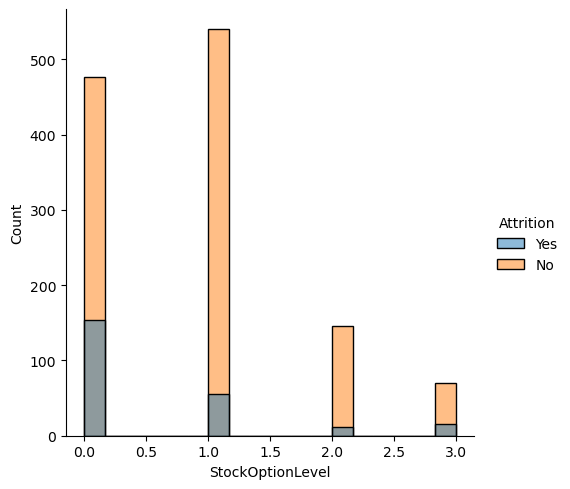

In [201]:
sns.displot(data=df,x="StockOptionLevel",hue="Attrition")

In [202]:
comp=pd.crosstab(df["StockOptionLevel"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

StockOptionLevel
0    24.405705
1     9.395973
2     7.594937
3    17.647059
dtype: float64

# StockOptionLevel Insight:-
- Employee with 0 StockOptionLevel is highest attrition rate with 24.40%. these level employee are more likely to leave the company.
- Employee with 4 StockOptionLevel are 2nd highest attrition rate of 17.64.
# strategy:
- Offering stock options or increasing stock option levels could be a strategic move to improve employee retention.
- maybe Employee with 4 stoockOptionLevel doesnot increase after level 4 that may the reason of leaving the company. Decide something on that.

# 8. PercentSalaryHike

In [205]:
comp=pd.crosstab(df["PercentSalaryHike"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

PercentSalaryHike
11    19.523810
12    16.666667
13    16.267943
14    11.940299
15    17.821782
16    17.948718
17    17.073171
18    14.606742
19    11.842105
20    12.727273
21    10.416667
22    21.428571
23    21.428571
24    28.571429
25     5.555556
dtype: float64

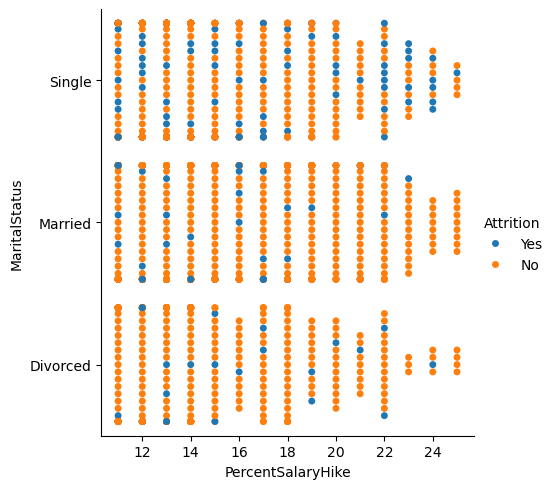

In [206]:
sns.catplot(data=df,x="PercentSalaryHike",y="MaritalStatus",kind="swarm",hue="Attrition")

# Insight:-
-  salary hikes alone may not be a strong determinant of whether employees stay or leave.
-  There are <u> more attrition among single employees </u> compared to married or divorced employees, especially in the mid-range of salary hikes (around 15% to 24%).
-  Employees who are <u> married </u> tend to exhibit <u> greater retention </u> in the company when they receive a salary hike of 18% or more.

In [208]:
comp=pd.crosstab(df["PercentSalaryHike"],[df["Attrition"],df["Gender"]])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

Gender,Female,Male
PercentSalaryHike,,
11,17.582418,21.008403
12,12.195122,19.827586
13,14.102564,17.557252
14,9.090909,13.709677
15,21.621622,15.625000
16,22.857143,13.953488
17,12.000000,19.298246
18,15.151515,14.285714
19,11.111111,12.500000


# 9. JobLevel

In [210]:
comp=pd.crosstab(df["JobLevel"],df["Attrition"])
(comp["Yes"]*100)/(comp["Yes"]+comp["No"])

JobLevel
1    26.335175
2     9.737828
3    14.678899
4     4.716981
5     7.246377
dtype: float64

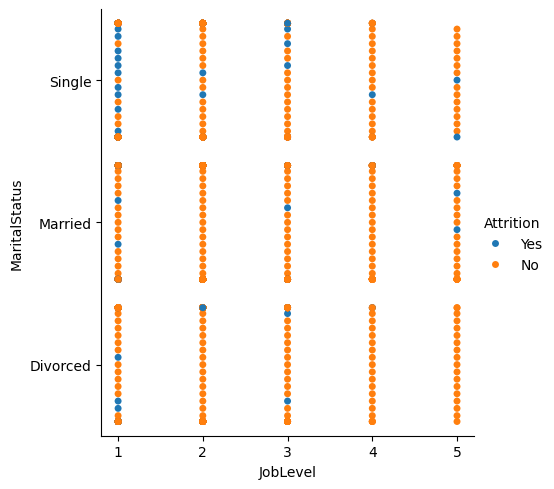

In [211]:
sns.catplot(data=df,x="JobLevel",hue="Attrition",y="MaritalStatus",kind="swarm")

In [212]:
comp=pd.crosstab(df["JobLevel"],[df["JobSatisfaction"],df["Attrition"]])
comp

JobSatisfaction   1       2        3        4    
Attrition        No Yes  No Yes   No Yes   No Yes
JobLevel                                         
1                65  41  79  29  119  43  137  30
2                89  13  88   9  142  21  163   9
3                40  10  32   5   58   6   56  11
4                20   1  21   1   26   2   34   1
5                 9   1  14   2   24   1   17   1

In [213]:
# JobSatisfaction 1 Attrition rate according to Job Level.
(comp[1]["Yes"]*100)/(comp[1]["Yes"]+comp[1]["No"])

JobLevel
1    38.679245
2    12.745098
3    20.000000
4     4.761905
5    10.000000
dtype: float64

In [214]:
(comp[2]["Yes"]*100)/(comp[2]["Yes"]+comp[2]["No"])

JobLevel
1    26.851852
2     9.278351
3    13.513514
4     4.545455
5    12.500000
dtype: float64

In [215]:
(comp[3]["Yes"]*100)/(comp[3]["Yes"]+comp[3]["No"])

JobLevel
1    26.543210
2    12.883436
3     9.375000
4     7.142857
5     4.000000
dtype: float64

In [216]:
(comp[4]["Yes"]*100)/(comp[4]["Yes"]+comp[4]["No"])

JobLevel
1    17.964072
2     5.232558
3    16.417910
4     2.857143
5     5.555556
dtype: float64

# Job level insight:-
- jobLevel 2 and 4 show low Attrition rate.
- Job Level 1 has the highest overall attrition, especially for employees with lower JobSatisfaction (1,2 and 3).
- Job Levels 4 and 5 have the lowest attrition rates, indicating that senior employees are generally more satisfied and less likely to leave.

# 10. TotalWorkingYears

In [219]:
df["TotalWorkingYears"].value_counts()

TotalWorkingYears
10    202
6     125
8     103
9      96
5      88
7      81
1      81
4      63
12     48
3      42
15     40
16     37
11     36
13     36
21     34
17     33
2      31
14     31
20     30
18     27
19     22
23     22
22     21
24     18
25     14
28     14
26     14
0      11
29     10
31      9
32      9
30      7
33      7
27      7
36      6
34      5
37      4
35      3
40      2
38      1
Name: count, dtype: int64

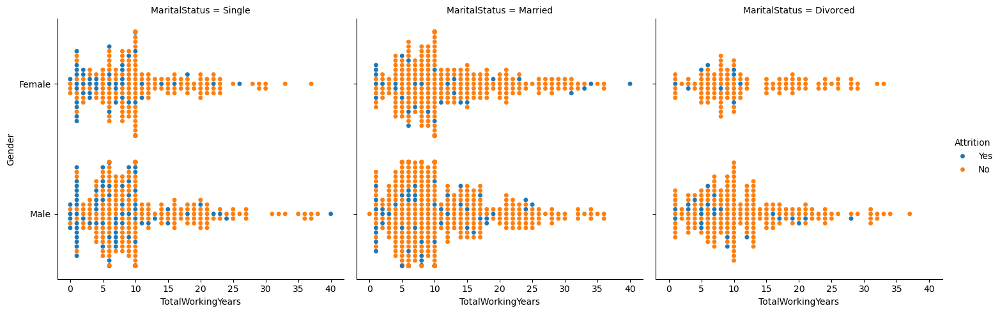

In [220]:
sns.catplot(data=df,x="TotalWorkingYears",kind="swarm",hue="Attrition",y="Gender",col="MaritalStatus")

- Early Career Attrition: Both male and female employees, especially those who are <font color="red"> single </font> and have fewer total working years, are at a higher risk of attrition. This could indicate that the company needs to focus on improving retention strategies for newer employees.

- Retention of Experienced Employees:<font color="red"> Married and divorced employees </font> with more total working years show better retention, suggesting that the company is more successful in retaining experienced employees.

- Gender: Neutral Attrition: The similar patterns observed across genders suggest that attrition is influenced more by factors like marital status and total working years rather than gender itself.

# 11. NumCompaniesWorked

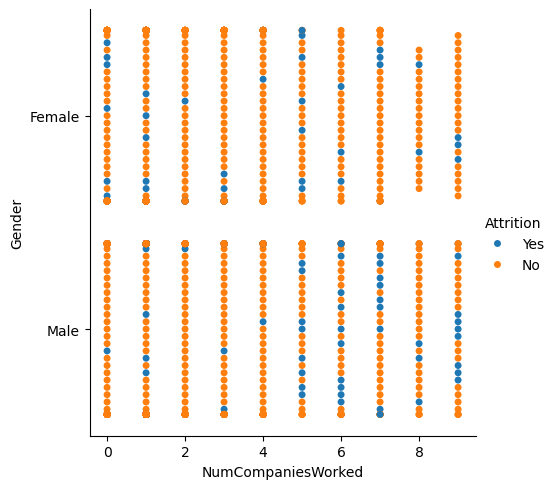

In [223]:
sns.catplot(data=df,x="NumCompaniesWorked",y="Gender",kind="swarm",hue="Attrition")

- More Applicable in Male Gender: Employees who have worked for multiple companies before their current role are more likely to leave the company.

# 12.YearsAtCompany

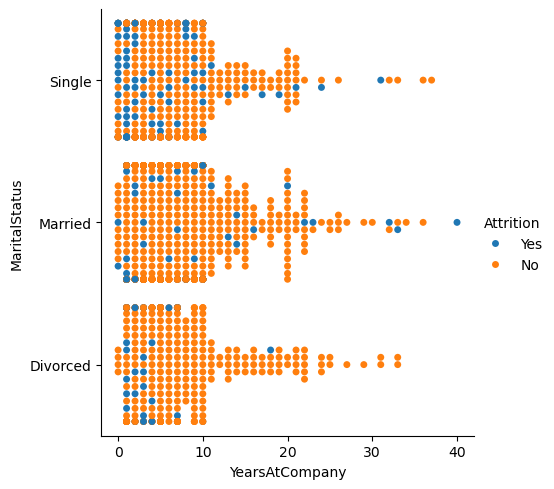

In [226]:
sns.catplot(data=df,x="YearsAtCompany",y="MaritalStatus",kind="swarm",hue="Attrition")

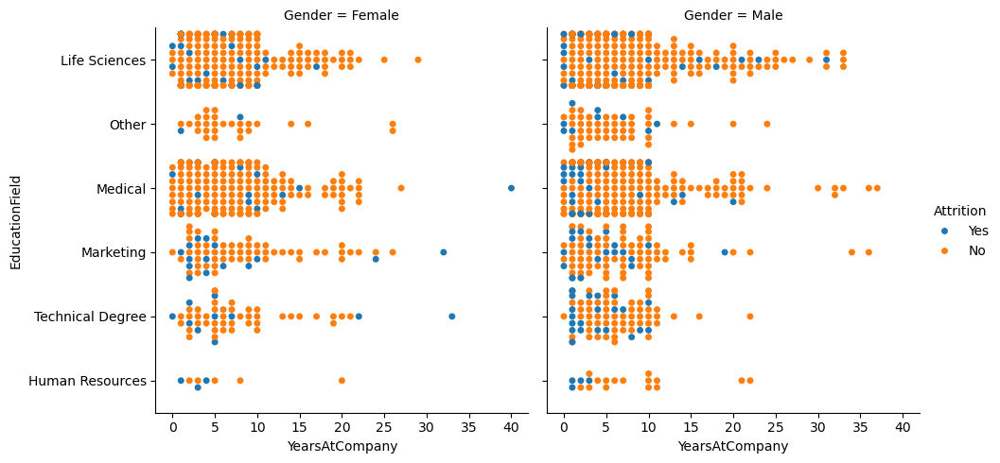

In [227]:
sns.catplot(data=df,x="YearsAtCompany",y="EducationField",kind="swarm",hue="Attrition",col="Gender")

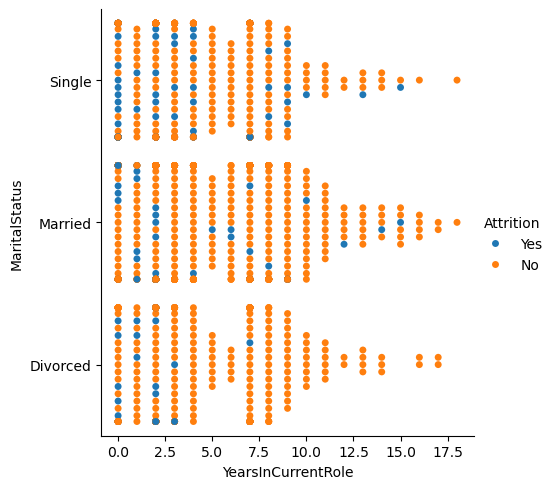

In [228]:
sns.catplot(data=df,x="YearsInCurrentRole",y="MaritalStatus",kind="swarm",hue="Attrition")

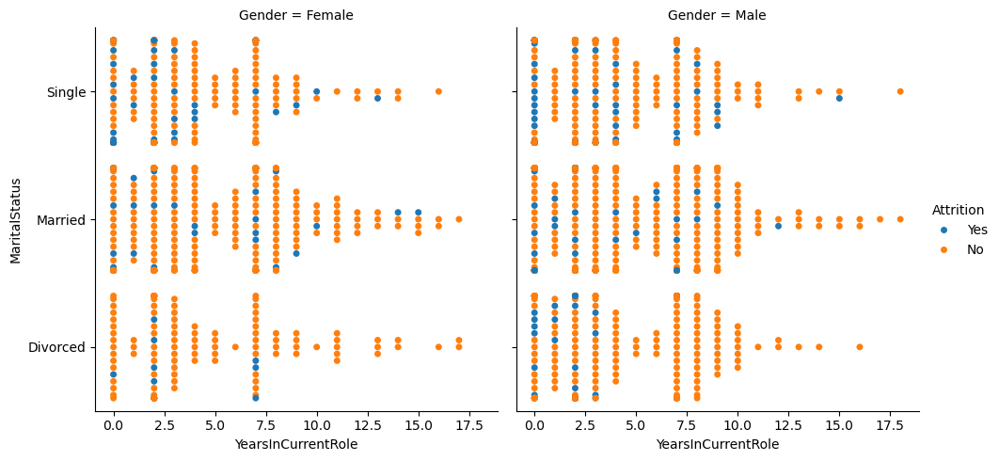

In [229]:
sns.catplot(data=df,x="YearsInCurrentRole",y="MaritalStatus",kind="swarm",hue="Attrition",col="Gender")

# YearAtCompany insight:
- Employees with less experience in their current role are more likely to leave.
- Employees with more years in their current role (more than 5-10 years) generally show lower attrition rates.
- employees are more prone to leave in the early stages of their current role.
- divorced females seem to exhibit the highest stability, while single employees are more prone to early attrition.

# 12. YearsSinceLastPromotion

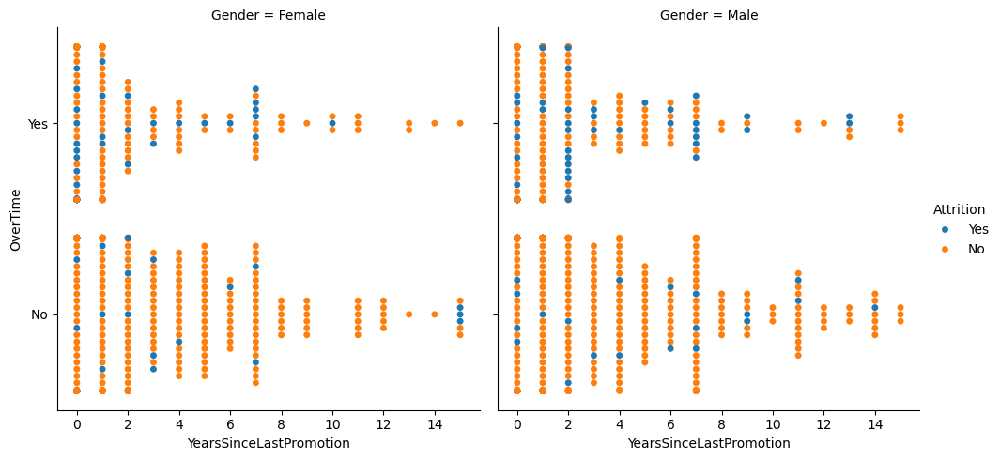

In [232]:
sns.catplot(data=df,x="YearsSinceLastPromotion",y="OverTime",kind="swarm",hue="Attrition",col="Gender")

# YearsSinceLastPromotion insight:
- Employees who work overtime are more likely to leave the company

# 13. DistanceFromHome

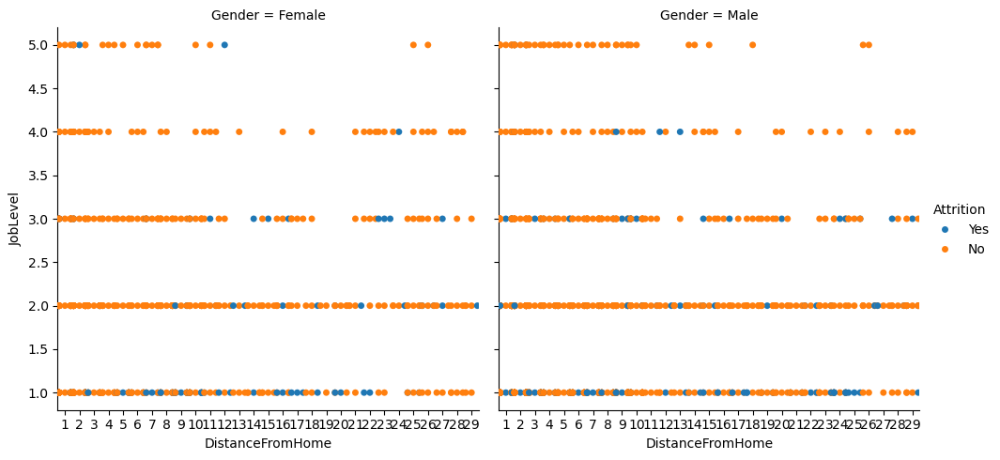

In [235]:
sns.catplot(data=df,x="DistanceFromHome",y="JobLevel",kind="swarm",hue="Attrition",col="Gender")

# Distance From Home Insight
- Attrition rate of job Level 5 and 4 is very low.
- mostly employee in level 5 live in small distance.

# JobRole

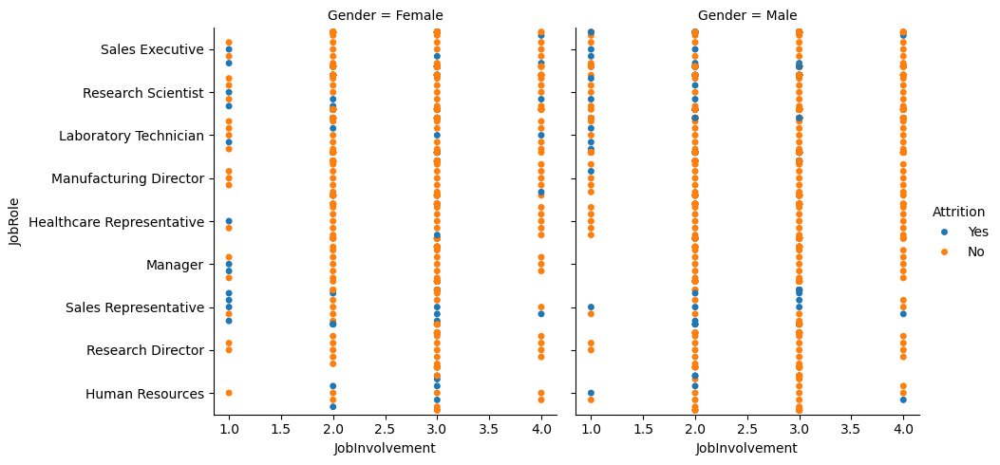

In [238]:
sns.catplot(data=df,y="JobRole",hue="Attrition",x="JobInvolvement",kind="swarm",col="Gender")

# Insight : 
- As the JobInvolvement increase the Attrition rate decrease in all Job Role.

# Summary of Key Factors Influencing Turnover


# Positive Points (Factors that Reduce Attrition):
1. Job Involvement:
- Higher job involvement (levels 3 and 4) is associated with lower attrition rates, indicating that employees who are more involved in their work are less likely to leave the company.

2. Job Satisfaction:
- Increased job satisfaction (levels 3 and 4) correlates with lower attrition rates, suggesting that satisfied employees are more likely to stay.

3. Work-Life Balance:
- Employees with better work-life balance (levels 3 and 4) are less likely to leave, emphasizing the importance of maintaining a healthy work-life equilibrium.

4. Environment Satisfaction:
- Higher levels of environment satisfaction (levels 3 and 4) reduce the likelihood of attrition, indicating that a positive work environment is crucial for employee retention.

5. Relationship Satisfaction:
- Strong relationships at work (satisfaction levels 3 and 4) contribute to lower attrition rates, highlighting the importance of fostering a supportive work culture.

6. Monthly Income:
- Employees who stay with the company tend to have a higher median monthly income, suggesting that competitive salaries are effective in retaining talent.

7. Stock Options:
- Offering stock options or higher stock option levels (up to level 4) can enhance employee retention by aligning employees’ interests with the company's success.

8. Job Levels:
- Senior employees (Job Levels 4 and 5) generally exhibit lower attrition rates, indicating that experienced employees are more satisfied and less likely to leave.

9. Retention of Experienced Employees:
- Married and divorced employees with more total working years show better retention, suggesting the company’s success in retaining experienced employees.

# Negative Points (Factors that Increase Attrition):

1. Low Job Involvement:
- Employees with low job involvement (level 1) have the highest attrition rate (33.7%), indicating a need to engage employees more effectively in their roles.

2. Low Job Satisfaction:
- Low job satisfaction (level 1) is associated with higher attrition (22.8%), showing that dissatisfaction significantly drives employees to leave.

3. Poor Work-Life Balance:
- Employees with poor work-life balance (level 1) have the highest attrition rate (31.25%), suggesting that heavy workloads and lack of flexibility are key factors in employee turnover.

4. Low Environment Satisfaction:
- Employees with low environment satisfaction (level 1) are more likely to leave (25.35% attrition rate), highlighting the need for improvements in work conditions and management practices.

5. Low Relationship Satisfaction:
- Employees with low satisfaction in workplace relationships (level 1) have higher attrition (20.65%), indicating the need to enhance interpersonal dynamics.

6. No Stock Options:
- Employees without stock options (level 0) have the highest attrition rate (24.40%), suggesting that the lack of equity incentives may drive employees to leave.

7. Early Career Attrition:
- Employees in the early stages of their roles, particularly those who are single and have fewer total working years, are more prone to leave.

8. Years Since Last Promotion:
- Employees who have gone longer without a promotion and work overtime are more likely to leave, indicating a need to address career progression and workload balance.

9. Multiple Companies Worked:
- Employees who have worked for multiple companies before their current role are more likely to leave, especially among males, indicating a possible 
 lack of long-term commitment.

10. Distance from Home:
- Employees living farther from the workplace, especially those in lower job levels, are more likely to leave, suggesting that commute times might impact retention.

# Highlights key areas where the company can focus its efforts to improve employee retention, particularly by enhancing job involvement, satisfaction, work-life balance, and career progression opportunities.

In [668]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Attrition1'],
      dtype='object')

In [670]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [681]:
num.remove("EmployeeCount")
num.remove("StandardHours")

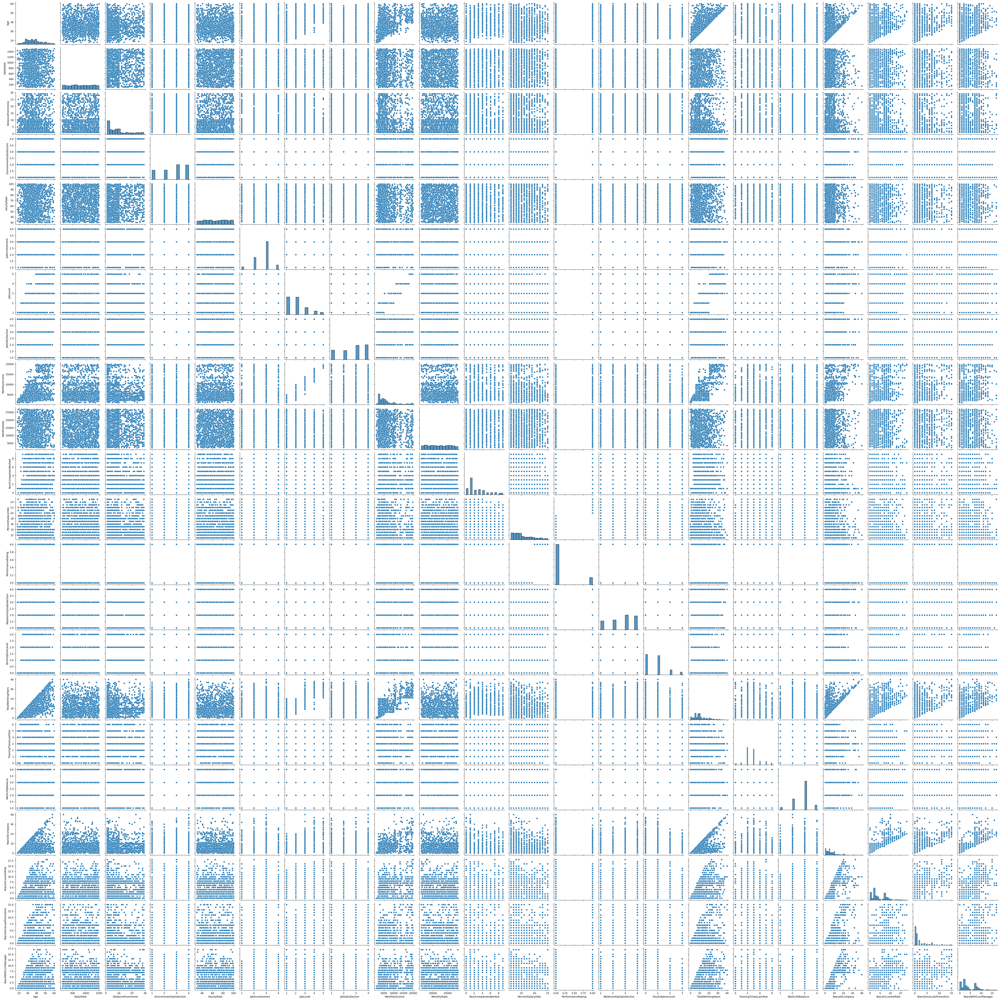

In [683]:
sns.pairplot(df[num])

# 2. Predictive Modeling:

In [685]:
# Understand the Problem

In [687]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition1
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5,1
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7,0
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0,1
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2,0


# Aim:- Develop a machine learning model to predict which employees are at the highest risk of attrition

In [690]:
df1=df.copy()

In [692]:
# Detecting the missing value
df1.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
Attrition1                  0
dtype: int64

 # No null value detected

In [695]:
df1.duplicated().sum()

0

# No duplicate value detected

In [698]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [700]:
cate=[]
nume=[]
for i in df1.columns:
    if df1[i].dtype =='O':
        cate.append(i)
    else:
        nume.append(i)

In [702]:
# Categorical columns
cate

['Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

In [704]:
# numerical columns
nume

['Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'Attrition1']

# Outlier Detection

- check distribution

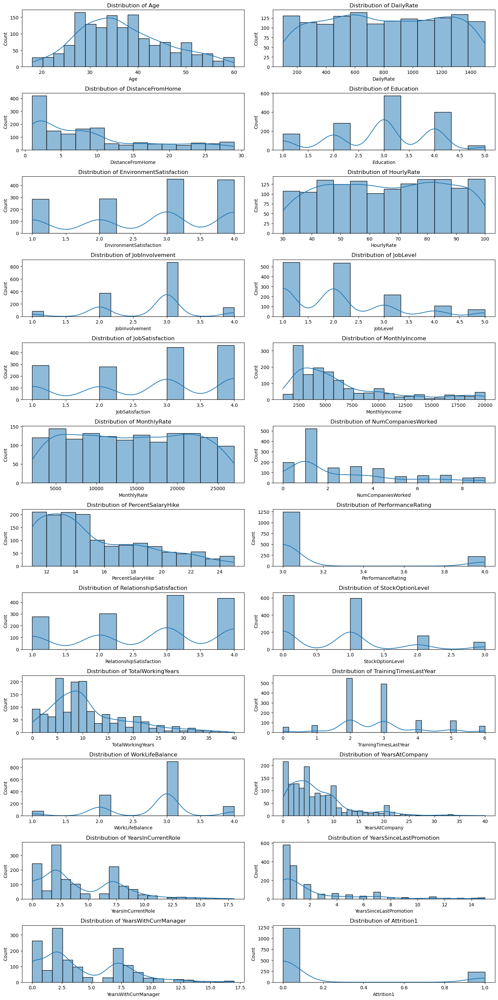

In [708]:
# Initialize the figure and subplots
fig, axes = plt.subplots(nrows=12, ncols=2, figsize=(15, 30))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through the numerical columns and plot
for i, col in enumerate(df1[nume].columns):
    sns.histplot(data=df1[col],kde=True,ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

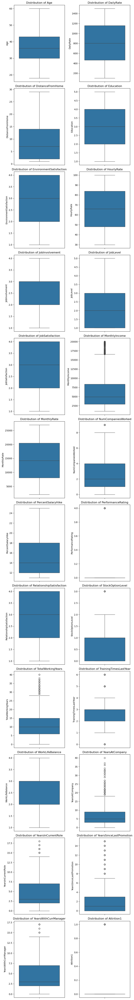

In [709]:
# Initialize the figure and subplots
fig, axes = plt.subplots(nrows=12, ncols=2, figsize=(8, 60))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through the numerical columns and plot
for i, col in enumerate(df1[nume].columns):
    sns.boxplot(data=df1[col],ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

<Axes: xlabel='TotalWorkingYears', ylabel='Density'>

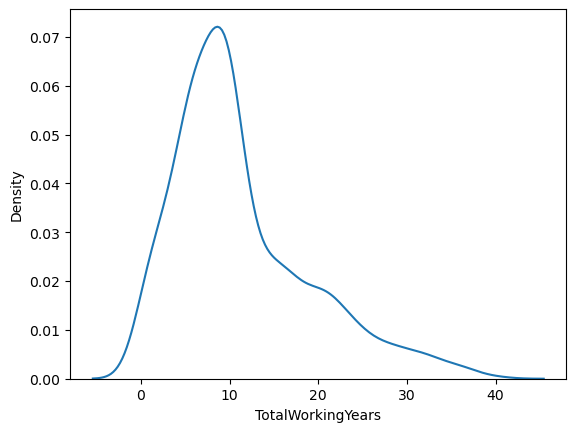

In [710]:
sns.kdeplot(df1["TotalWorkingYears"])

In [711]:
# skewed="NumCompaniesWorked","YearsSinceLastPromotion","MonthlyIncome","TotalWorkingYears","YearsAtCompany"

In [720]:
# "NumCompaniesWorked","StockOptionLevel","YearsInCurrentRole","YearsSinceLastPromotion","YearWithCurrManager"

# Monthly Income

In [723]:
df1["MonthlyIncome"]

0       5993
1       5130
2       2090
3       2909
4       3468
        ... 
1465    2571
1466    9991
1467    6142
1468    5390
1469    4404
Name: MonthlyIncome, Length: 1470, dtype: int64

In [725]:
MonthlyIncome_Q1=np.percentile(df1["MonthlyIncome"],25)
MonthlyIncome_Q1

2911.0

In [727]:
MonthlyIncome_Q3=np.percentile(df1["MonthlyIncome"],75)
MonthlyIncome_Q3

8379.0

In [729]:
MonthlyIncome_IQR=MonthlyIncome_Q3-MonthlyIncome_Q1
MonthlyIncome_IQR

5468.0

In [731]:
MonthlyIncome_upper_limit=MonthlyIncome_Q3+(1.5*(MonthlyIncome_IQR))
MonthlyIncome_upper_limit

16581.0

In [733]:
MonthlyIncome_lower_limit=MonthlyIncome_Q1-(1.5*(MonthlyIncome_IQR))
MonthlyIncome_lower_limit

-5291.0

# Trimming method

In [736]:
df11=df1[df1["MonthlyIncome"]<=MonthlyIncome_upper_limit].copy()

In [738]:
df.shape

(1470, 32)

In [740]:
df11.shape

(1356, 32)

# TotalWorkingYears

In [743]:
TotalWorkingYears_Q1=np.percentile(df11["TotalWorkingYears"],25)
TotalWorkingYears_Q1

6.0

In [745]:
TotalWorkingYears_Q3=np.percentile(df11["TotalWorkingYears"],75)
TotalWorkingYears_Q3

13.0

In [747]:
TotalWorkingYears_IQR=TotalWorkingYears_Q3-TotalWorkingYears_Q1
TotalWorkingYears_IQR

7.0

In [749]:
TotalWorkingYears_lowerlimit=TotalWorkingYears_Q1-(1.5 * TotalWorkingYears_IQR) 
TotalWorkingYears_lowerlimit

-4.5

In [751]:
TotalWorkingYears_upperlimit=TotalWorkingYears_Q1+(1.5 * TotalWorkingYears_IQR) 
TotalWorkingYears_upperlimit

16.5

In [753]:
df11.shape

(1356, 32)

In [755]:
df11=df11[df11["TotalWorkingYears"]<= TotalWorkingYears_upperlimit]

In [757]:
df11.shape

(1148, 32)

# YearsAtCompany

In [760]:
df11["YearsAtCompany"].value_counts()

YearsAtCompany
5     167
1     140
2     113
3     112
10    104
4      95
7      73
6      72
9      72
8      70
0      42
11     30
13     18
15     14
14     11
12     10
16      5
Name: count, dtype: int64

In [762]:
YearsAtCompany_Q1=np.percentile(df11["YearsAtCompany"],25)
YearsAtCompany_Q1

2.0

In [764]:
YearsAtCompany_Q3=np.percentile(df11["YearsAtCompany"],75)
YearsAtCompany_Q3

8.0

In [765]:
YearsAtCompany_IQR=YearsAtCompany_Q3-YearsAtCompany_Q1

In [768]:
YearsAtCompany_lowerlimit=YearsAtCompany_Q1-(1.5 * YearsAtCompany_IQR)
YearsAtCompany_lowerlimit

-7.0

In [770]:
YearsAtCompany_upperlimit=YearsAtCompany_Q3+(1.5 * YearsAtCompany_IQR)
YearsAtCompany_upperlimit

17.0

In [772]:
df11=df11[df11["YearsAtCompany"]<=YearsAtCompany_upperlimit]

In [774]:
df11

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition1
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5,1
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7,0
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0,1
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1463,31,No,Non-Travel,325,Research & Development,5,3,Medical,2,Male,74,3,2,Manufacturing Director,1,Single,9936,3787,0,No,19,3,2,0,10,2,3,9,4,1,7,0
1464,26,No,Travel_Rarely,1167,Sales,5,3,Other,4,Female,30,2,1,Sales Representative,3,Single,2966,21378,0,No,18,3,4,0,5,2,3,4,2,0,0,0
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,No,15,3,1,1,9,5,3,7,7,1,7,0
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Yes,20,4,2,1,6,0,3,6,2,0,3,0


# YearsSinceLastPromotion

In [777]:
YearsSinceLastPromotion_Q1=np.percentile(df11["YearsSinceLastPromotion"],25)

In [779]:
YearsSinceLastPromotion_Q3=np.percentile(df11["YearsSinceLastPromotion"],75)

In [781]:
YearsSinceLastPromotion_IQR=YearsSinceLastPromotion_Q3-YearsSinceLastPromotion_Q1

In [783]:
YearsSinceLastPromotion_upperlimit=YearsSinceLastPromotion_Q3+(1.5*YearsSinceLastPromotion_IQR)
YearsSinceLastPromotion_upperlimit

5.0

In [785]:
YearsSinceLastPromotion_lowerlimit=YearsSinceLastPromotion_Q1-(1.5*YearsSinceLastPromotion_IQR)
YearsSinceLastPromotion_lowerlimit

-3.0

In [789]:
df11=df11[df11["YearsSinceLastPromotion"]<YearsSinceLastPromotion_upperlimit]

# NumCompaniesWorked

In [791]:
NumCompaniesWorked_Q1=np.percentile(df11["NumCompaniesWorked"],25)

In [792]:
NumCompaniesWorked_Q3=np.percentile(df11["NumCompaniesWorked"],75)

In [793]:
NumCompaniesWorked_IQR=NumCompaniesWorked_Q3-NumCompaniesWorked_Q1
NumCompaniesWorked_IQR

3.0

In [794]:
NumCompaniesWorked_upperlimit=NumCompaniesWorked_Q3+(1.5*NumCompaniesWorked_IQR)
NumCompaniesWorked_upperlimit

8.5

In [795]:
df11=df11[df11["NumCompaniesWorked"]<NumCompaniesWorked_upperlimit]

# YearsInCurrentRole

In [797]:
df11["YearsInCurrentRole"].value_counts()

YearsInCurrentRole
2     303
0     190
7     117
3     109
4      79
1      48
8      40
5      29
9      18
6       9
10      9
11      6
13      2
15      1
14      1
12      1
Name: count, dtype: int64

In [798]:
YearsInCurrentRole_Q1=np.percentile(df11["YearsInCurrentRole"],25)
YearsInCurrentRole_Q3=np.percentile(df11["YearsInCurrentRole"],75)
YearsInCurrentRole_IQR=YearsInCurrentRole_Q3-YearsInCurrentRole_Q1

In [799]:
YearsInCurrentRole_upperlimit=YearsInCurrentRole_Q3+(1.5*YearsInCurrentRole_IQR)
YearsInCurrentRole_upperlimit

7.0

In [800]:
df11=df11[df11["YearsInCurrentRole"]<YearsInCurrentRole_upperlimit]

# YearsWithCurrManager

In [802]:
YearsWithCurrManager_Q1=np.percentile(df11["YearsWithCurrManager"],25)
YearsWithCurrManager_Q3=np.percentile(df11["YearsWithCurrManager"],75)
YearsWithCurrManager_IQR=YearsWithCurrManager_Q3-YearsWithCurrManager_Q1

In [803]:
YearsWithCurrManager_upperlimit=YearsWithCurrManager_Q3+(1.5 * YearsWithCurrManager_IQR)
YearsWithCurrManager_upperlimit

7.5

In [804]:
df11=df11[df11["YearsWithCurrManager"]<YearsWithCurrManager_upperlimit]

In [805]:
df.shape

(1470, 32)

In [806]:
df11.shape

(747, 32)

# Note: As we see after trimming we see huge decrease in data approx half of data is vanished.
- So we decided to do capping instead to trimming

In [808]:
Trimmed_columns=["YearsWithCurrManager","YearsInCurrentRole","NumCompaniesWorked","YearsSinceLastPromotion","YearsAtCompany","TotalWorkingYears","MonthlyIncome"]

In [809]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition1
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5,1
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7,0
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0,1
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,No,17,3,3,1,17,3,3,5,2,0,3,0
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,No,15,3,1,1,9,5,3,7,7,1,7,0
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Yes,20,4,2,1,6,0,3,6,2,0,3,0
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,No,14,3,4,0,17,3,2,9,6,0,8,0


In [810]:
df12=df1.copy()

In [811]:
skew=["YearsWithCurrManager","YearsInCurrentRole","NumCompaniesWorked","YearsSinceLastPromotion","YearsAtCompany","TotalWorkingYears","MonthlyIncome"]

# step1: identifing the outlier and fill it by capping method

In [813]:
for i in skew:
    Q1=np.percentile(df12[i],25)
    Q3=np.percentile(df12[i],75)
    IQR=Q3-Q1
    upperlimit=np.ceil(Q3+(1.5*IQR))
    lowerlimit=np.ceil(Q1-(1.5*IQR))
    df12[i]=np.where(df12[i]>upperlimit,upperlimit,df12[i])

In [814]:
df12.sample(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition1
194,45,No,Non-Travel,1195,Research & Development,2,2,Medical,1,Male,65,2,4,Manager,4,Married,16581.0,20462,9.0,No,23,4,4,1,22.0,1,3,18.0,8.0,8.0,8.0,0
942,36,No,Travel_Rarely,325,Research & Development,10,4,Technical Degree,4,Female,63,3,3,Healthcare Representative,3,Married,7094.0,5747,3.0,No,12,3,1,0,10.0,0,3,7.0,7.0,1.0,7.0,0
1097,24,No,Travel_Rarely,350,Research & Development,21,2,Technical Degree,3,Male,57,2,1,Laboratory Technician,1,Divorced,2296.0,10036,0.0,No,14,3,2,3,2.0,3,3,1.0,1.0,0.0,0.0,0
703,38,No,Non-Travel,152,Sales,10,3,Technical Degree,3,Female,85,3,2,Sales Executive,4,Single,5666.0,19899,1.0,Yes,13,3,2,0,6.0,1,3,5.0,3.0,1.0,3.0,0
500,32,No,Travel_Rarely,646,Research & Development,9,4,Life Sciences,1,Female,92,3,2,Research Scientist,4,Married,6322.0,18089,1.0,Yes,12,3,4,1,6.0,2,2,6.0,4.0,0.0,5.0,0


In [815]:
 import scipy.stats as stats

# Steps we are going to do:-
- features transformation
- Onehotencoding
- scaling
- smote (treat Imbalance dataset)
- feature selection
- model traing

In [817]:
cate=[]
nume=[]
for col in df12.columns:
    if df12[col].dtype =='O':
        cate.append(col)
    else:
        nume.append(col)
nume.remove("Attrition1")
cate.remove("Attrition")
    

- Before going to do any transformation we should seaprate continuous and discret features 

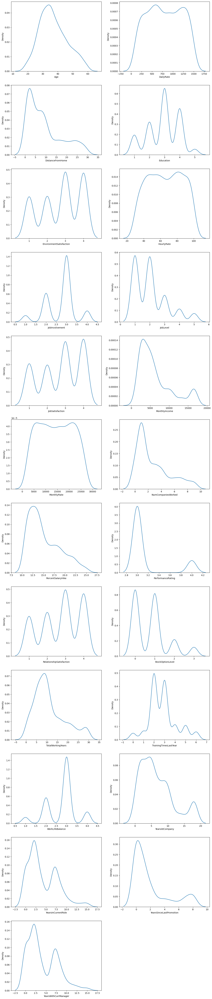

In [819]:
plt.figure(figsize=(16,80))
i=1
for col in nume:
    plt.subplot(12,2,i)
    sns.kdeplot(df12[col])
    i+=1
plt.show()

In [820]:
# According to me i seprate numerical features to continuous and discret features.

In [821]:
# dist is our discret variable.
dist=['Education','EnvironmentSatisfaction','JobInvolvement','JobLevel','PerformanceRating','JobSatisfaction','RelationshipSatisfaction','StockOptionLevel','WorkLifeBalance']

In [822]:
# conti is act as continuous variable.
conti=list(set(nume).difference(dist))

In [823]:
conti

['Age',
 'MonthlyRate',
 'YearsSinceLastPromotion',
 'DistanceFromHome',
 'YearsWithCurrManager',
 'HourlyRate',
 'TrainingTimesLastYear',
 'MonthlyIncome',
 'PercentSalaryHike',
 'YearsInCurrentRole',
 'TotalWorkingYears',
 'YearsAtCompany',
 'NumCompaniesWorked',
 'DailyRate']

In [824]:
dist

['Education',
 'EnvironmentSatisfaction',
 'JobInvolvement',
 'JobLevel',
 'PerformanceRating',
 'JobSatisfaction',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'WorkLifeBalance']

In [825]:
col_name=conti+dist+cate

In [826]:
cate

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

In [827]:
x=df12.drop(columns=["Attrition","Attrition1"])
y=df12.iloc[:,-1]

In [828]:
print(x.shape,y.shape)

(1470, 30) (1470,)


In [829]:
x=x.reindex(col_name,axis=1)

In [830]:
x.shape

(1470, 30)

In [831]:
x.columns

Index(['Age', 'MonthlyRate', 'YearsSinceLastPromotion', 'DistanceFromHome',
       'YearsWithCurrManager', 'HourlyRate', 'TrainingTimesLastYear',
       'MonthlyIncome', 'PercentSalaryHike', 'YearsInCurrentRole',
       'TotalWorkingYears', 'YearsAtCompany', 'NumCompaniesWorked',
       'DailyRate', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement',
       'JobLevel', 'PerformanceRating', 'JobSatisfaction',
       'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance',
       'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'OverTime'],
      dtype='object')

In [832]:
x[conti].describe()

,Age,MonthlyRate,YearsSinceLastPromotion,DistanceFromHome,YearsWithCurrManager,HourlyRate,TrainingTimesLastYear,MonthlyIncome,PercentSalaryHike,YearsInCurrentRole,TotalWorkingYears,YearsAtCompany,NumCompaniesWorked,DailyRate
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,14313.103401,1.959184,9.192517,4.112245,65.891156,2.799320,6361.891837,15.209524,4.214966,11.124490,6.617687,2.693197,802.485714
std,9.135373,7117.786044,2.562168,8.106864,3.531872,20.329428,1.289271,4353.345470,3.659938,3.576459,7.355424,4.989788,2.498009,403.509100
min,18.000000,2094.000000,0.000000,1.000000,0.000000,30.000000,0.000000,1009.000000,11.000000,0.000000,0.000000,0.000000,0.000000,102.000000
25%,30.000000,8047.000000,0.000000,2.000000,2.000000,48.000000,2.000000,2911.000000,12.000000,2.000000,6.000000,3.000000,1.000000,465.000000
50%,36.000000,14235.500000,1.000000,7.000000,3.000000,66.000000,3.000000,4919.000000,14.000000,3.000000,10.000000,5.000000,2.000000,802.000000
75%,43.000000,20461.500000,3.000000,14.000000,7.000000,83.750000,3.000000,8379.000000,18.000000,7.000000,15.000000,9.000000,4.000000,1157.000000
max,60.000000,26999.000000,8.000000,29.000000,15.000000,100.000000,6.000000,16581.000000,25.000000,15.000000,29.000000,18.000000,9.000000,1499.000000


In [833]:
import scipy.stats as stats

In [834]:
from sklearn.preprocessing import PowerTransformer

In [835]:
x[conti].isnull().sum()

Age                        0
MonthlyRate                0
YearsSinceLastPromotion    0
DistanceFromHome           0
YearsWithCurrManager       0
HourlyRate                 0
TrainingTimesLastYear      0
MonthlyIncome              0
PercentSalaryHike          0
YearsInCurrentRole         0
TotalWorkingYears          0
YearsAtCompany             0
NumCompaniesWorked         0
DailyRate                  0
dtype: int64

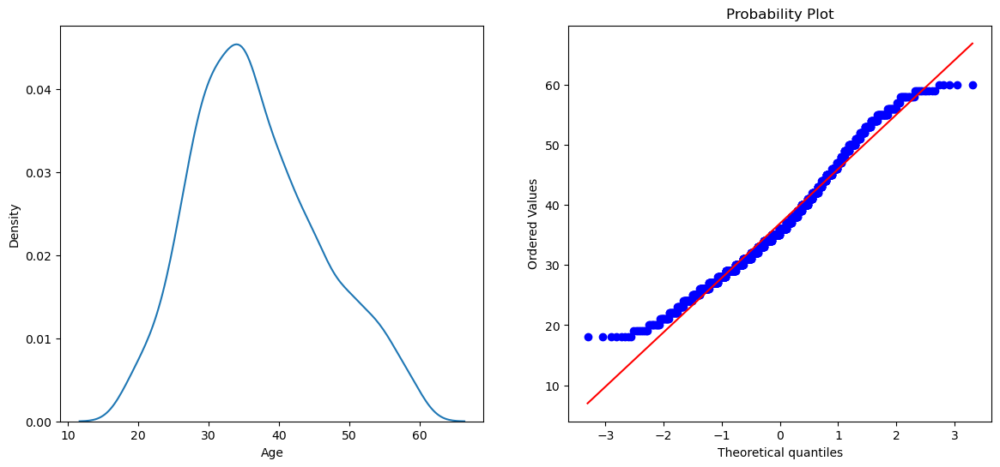

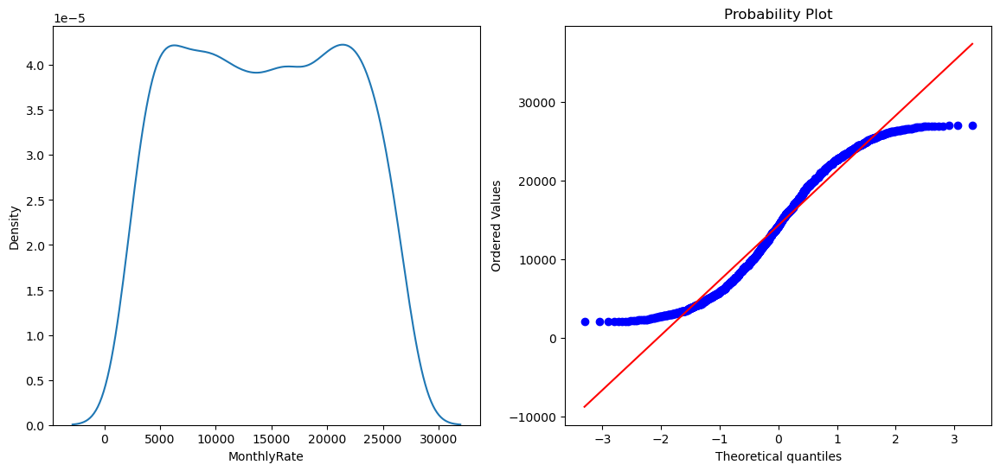

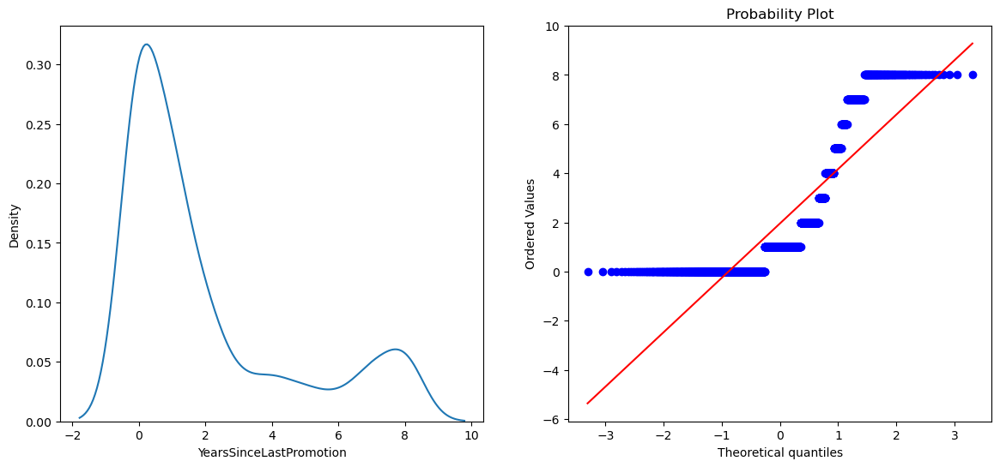

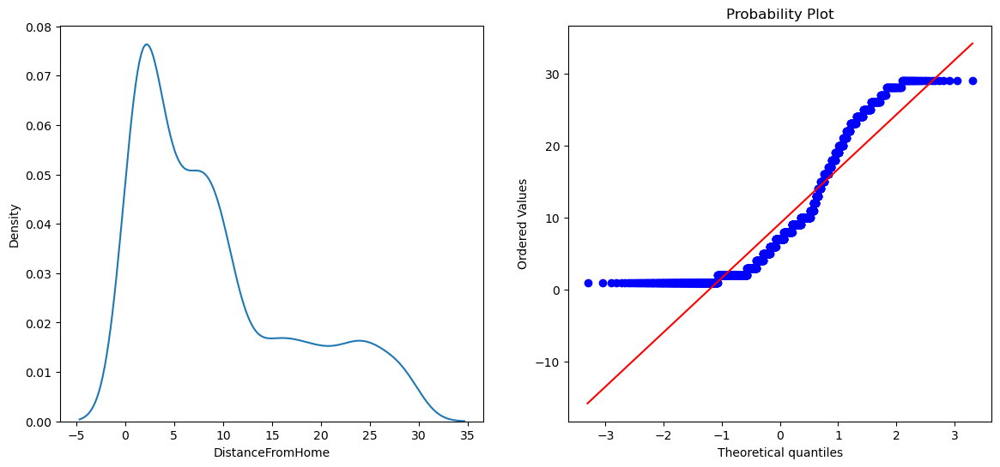

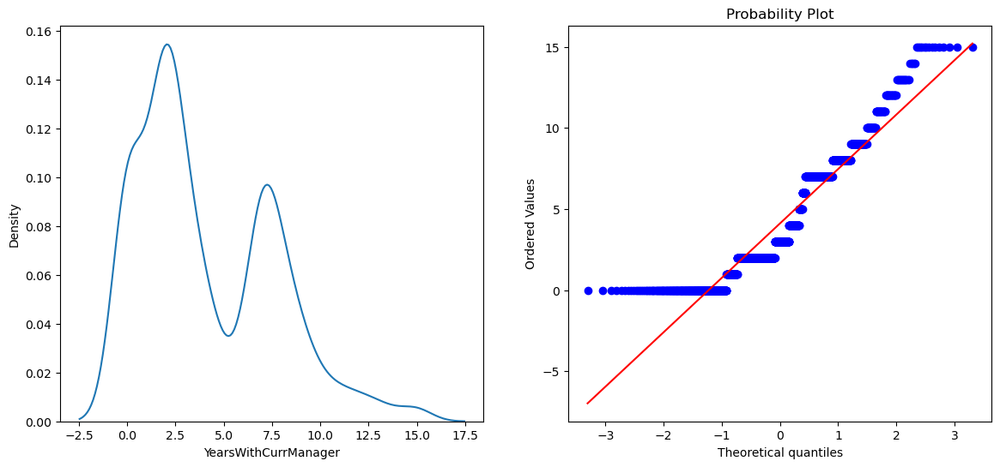

...

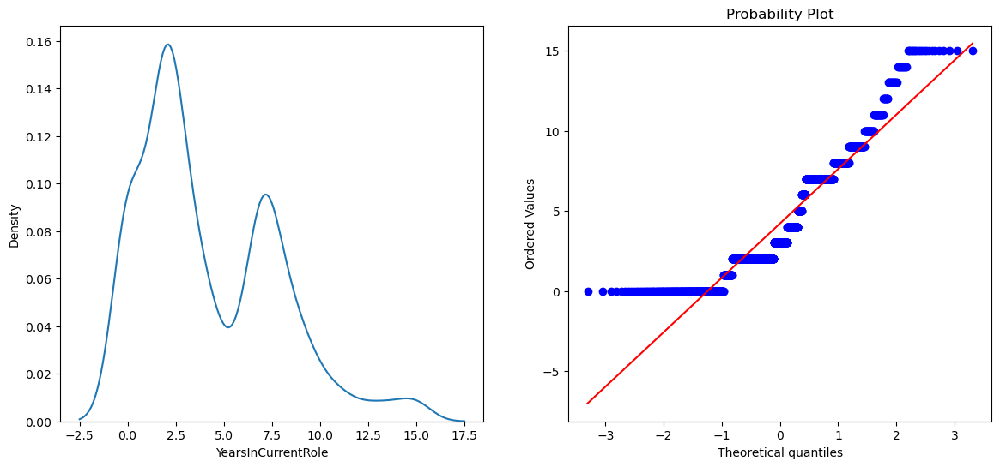

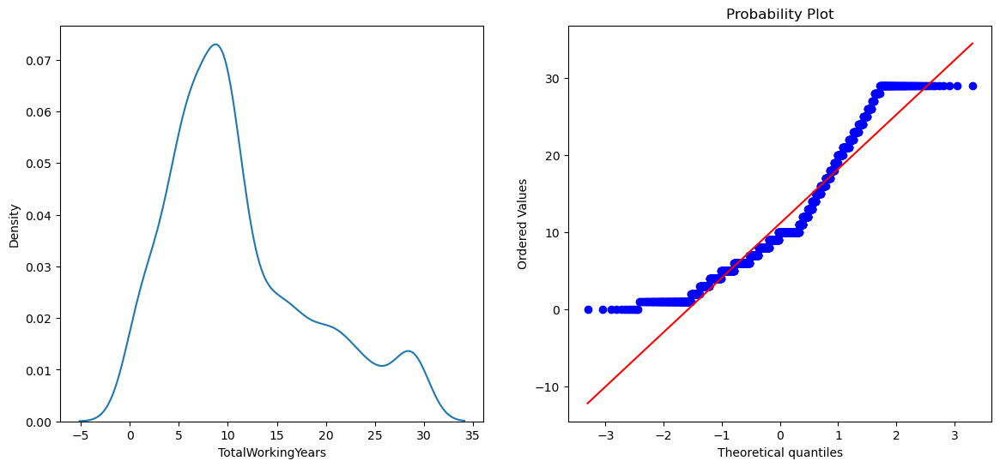

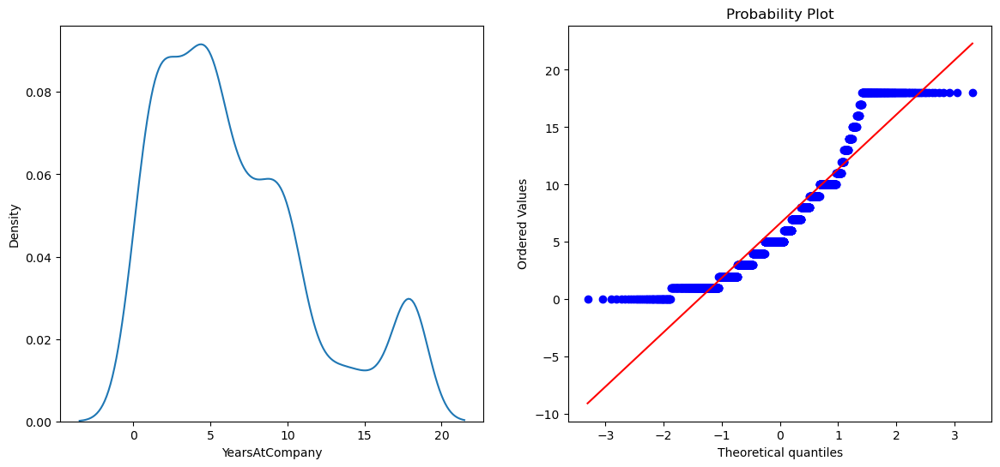

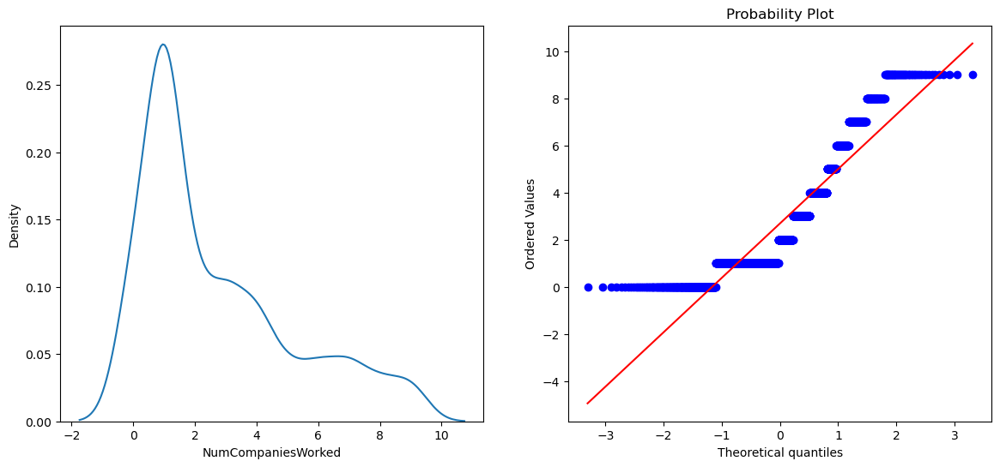

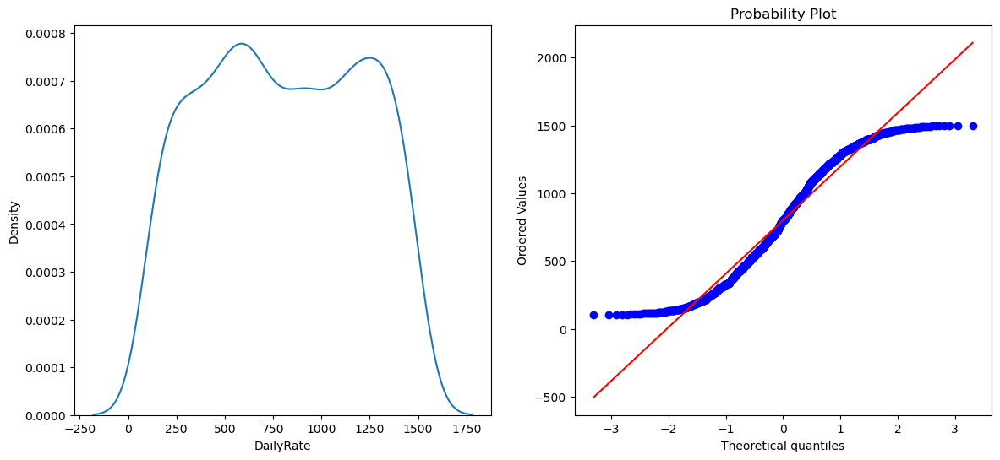

In [836]:
for i in conti:
    plt.figure(figsize=(14,6))
    plt.subplot(121)
    sns.kdeplot(x[i])
    plt.subplot(122)
    stats.probplot(x[i],plot=plt)
    plt.show()

In [837]:
# Split dataset in training and testing dataset

In [1352]:
from sklearn.model_selection import train_test_split

In [1375]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=86)

# Applying Box-Cox Transform

In [1382]:
x_train_conti=x_train[conti]+0.0001
x_test_conti=x_test[conti]+0.0001

In [1383]:
# box-cox handle only positive value.
pt=PowerTransformer(method='box-cox')
x_train_transformed_box_cox=pt.fit_transform(x_train_conti)

In [1384]:
x_train_transformed_box_cox=pd.DataFrame(x_train_transformed_box_cox,columns=x_train_conti.columns)

In [1385]:
x_train_transformed_box_cox.head()

,Age,MonthlyRate,YearsSinceLastPromotion,DistanceFromHome,YearsWithCurrManager,HourlyRate,TrainingTimesLastYear,MonthlyIncome,PercentSalaryHike,YearsInCurrentRole,TotalWorkingYears,YearsAtCompany,NumCompaniesWorked,DailyRate
0,-1.115962,0.334408,-1.225554,1.170710,0.809813,0.124899,0.214030,-0.320991,-1.485357,0.796658,-0.420324,0.303207,-0.380142,1.173440
1,-0.117341,-1.162555,0.509274,1.108177,-1.857993,1.020686,0.214030,-0.124997,0.474191,-0.168465,-0.784479,-0.083630,-0.380142,0.997986
2,-0.004929,-0.882400,-1.225554,0.901246,-1.857993,0.790318,0.214030,-0.047674,-0.121803,-1.907533,-0.109141,-1.338648,1.325154,-0.282735
3,0.722901,0.308024,0.509274,1.635372,-0.116376,0.366269,-0.550864,-0.078672,-0.945473,-0.168465,0.961051,-0.576256,0.708819,0.422349
4,1.366980,0.894000,1.187283,1.230536,1.429623,-1.217457,0.214030,1.189516,0.198521,0.926135,1.922390,1.729868,0.097486,1.029916


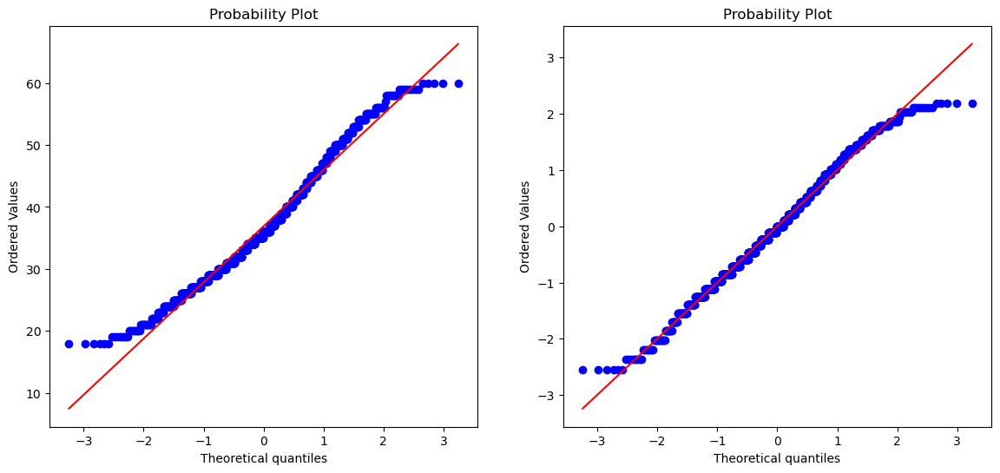

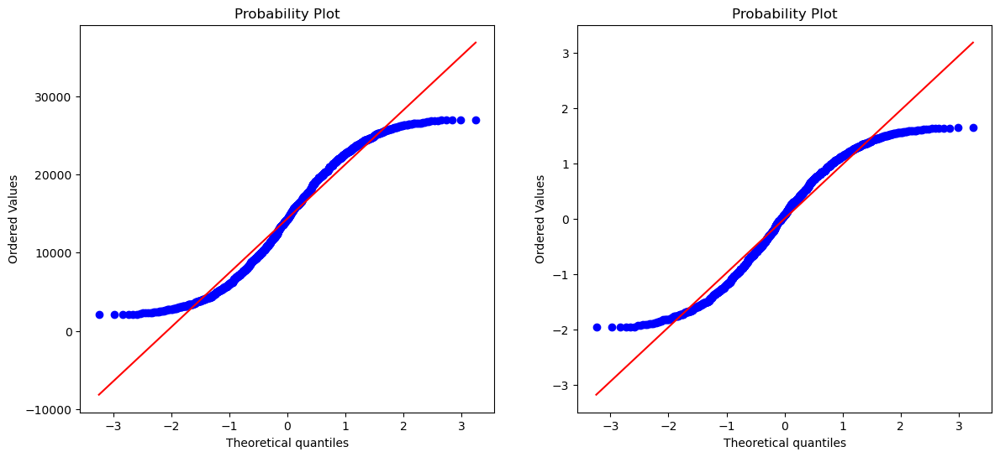

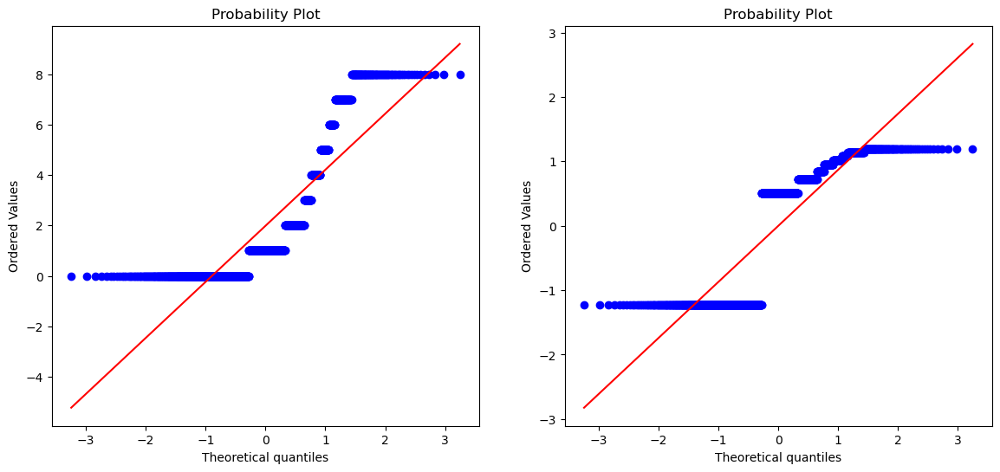

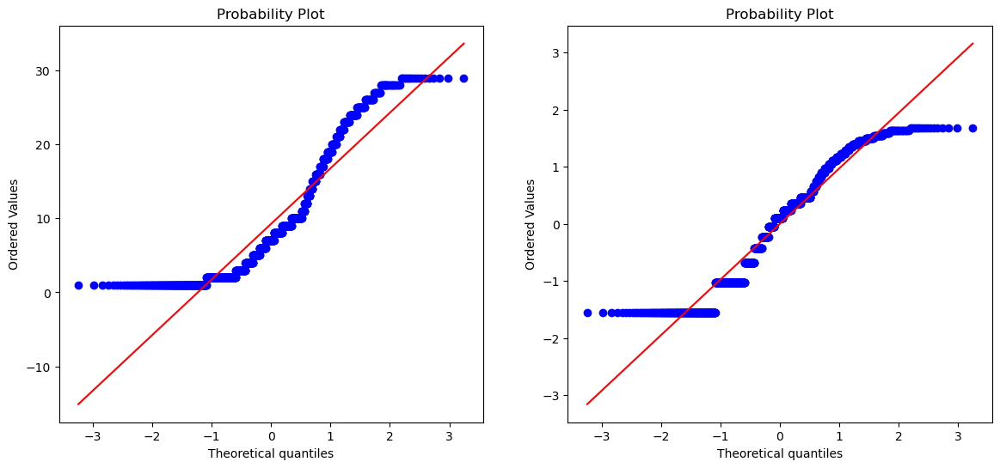

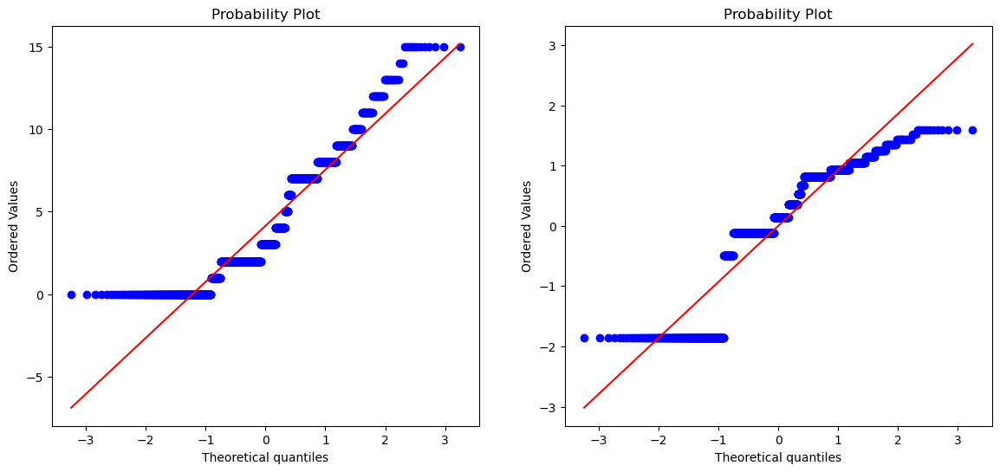

...

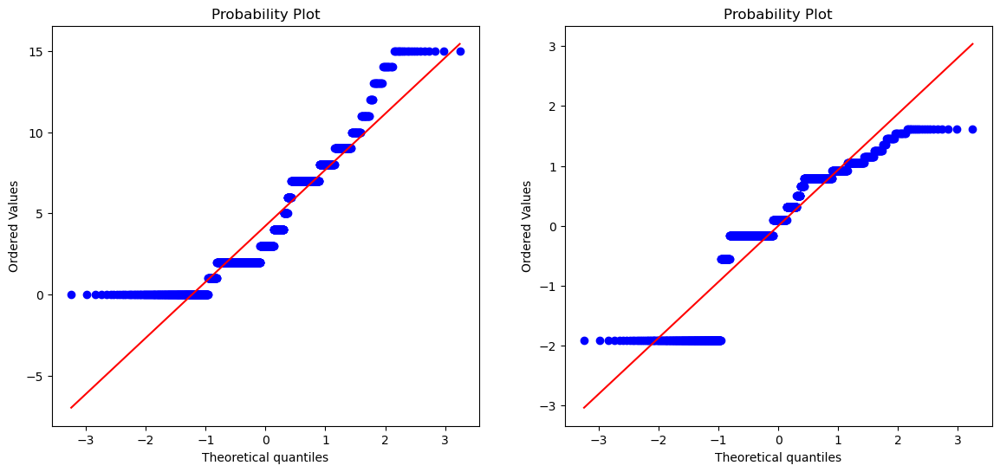

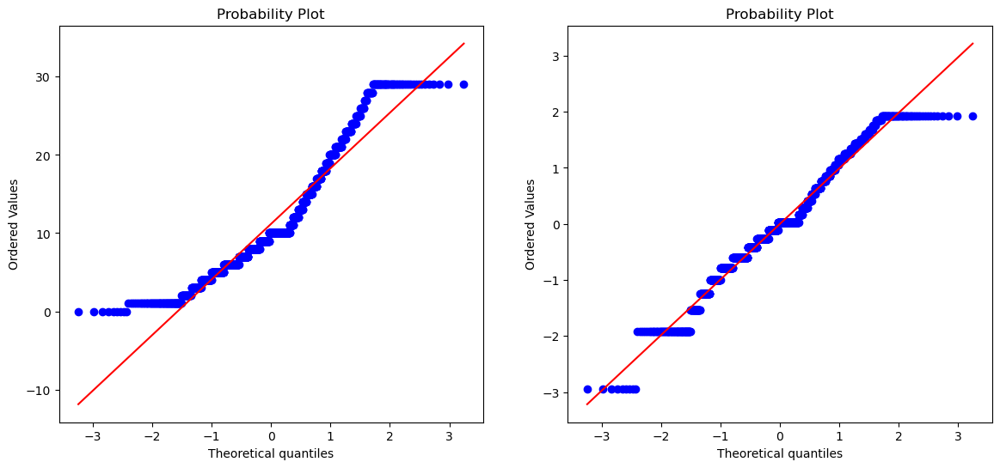

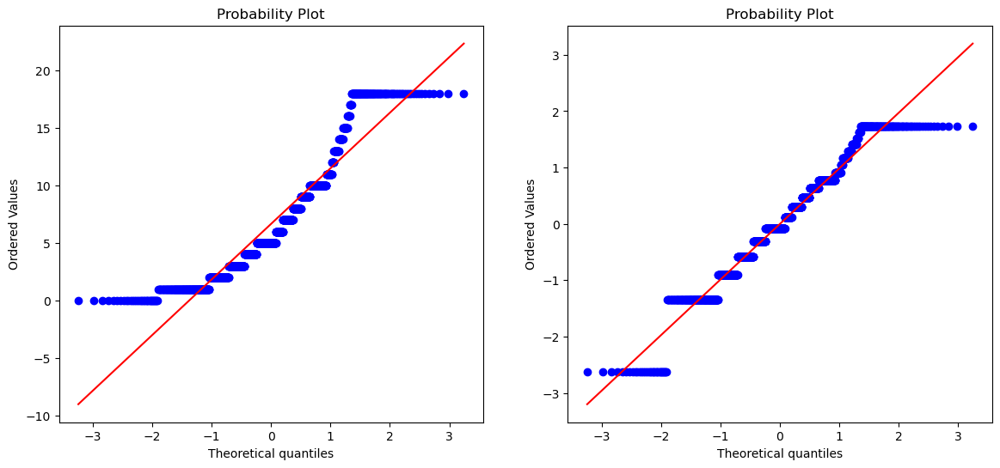

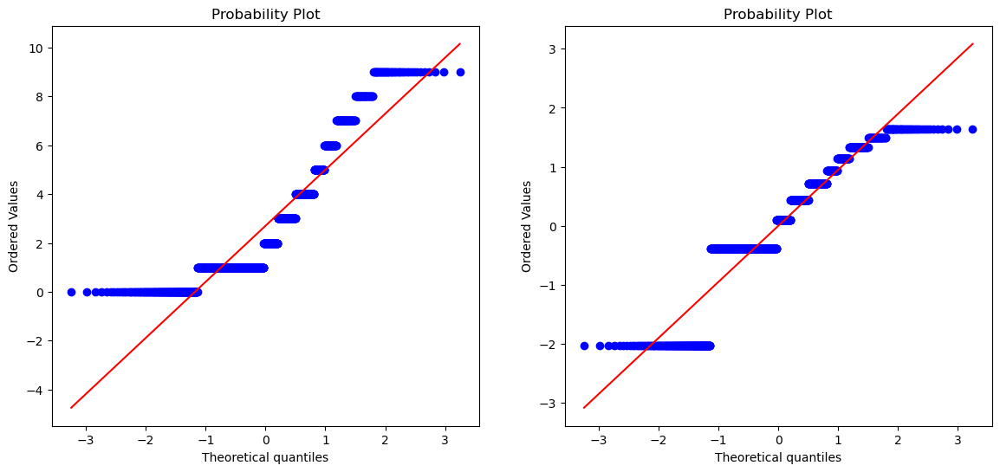

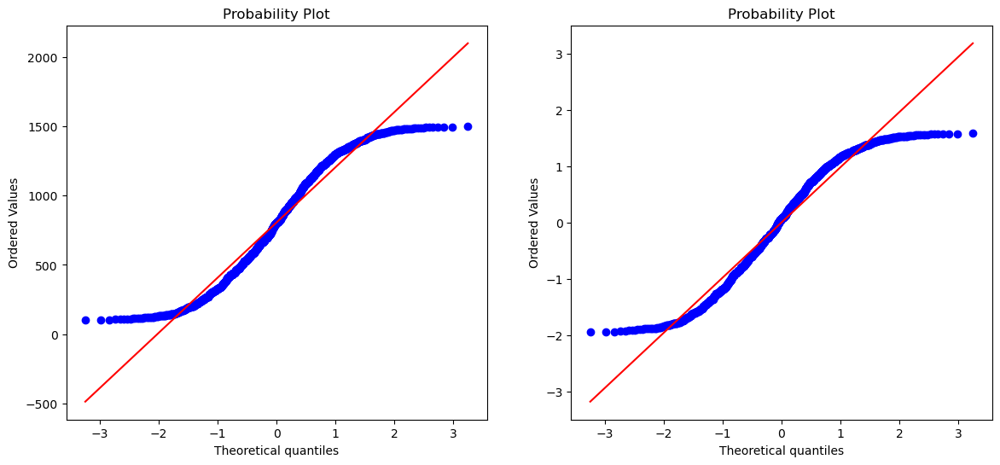

In [1386]:
for i in conti:
    plt.figure(figsize=(14,6))
    plt.subplot(121)
    stats.probplot(x_train[i],plot=plt)
    plt.subplot(122)
    stats.probplot(x_train_transformed_box_cox[i],plot=plt)
    plt.show()

# Apply yeo-johnson Transformation:
- it is applicable for positive, negative and zero values also.

In [1388]:
pt_y=PowerTransformer(standardize=False)
x_train_transformed_yeo_johnson=pt_y.fit_transform(x_train[conti])

In [1389]:
x_train_transformed_yeo_johnson=pd.DataFrame(x_train_transformed_yeo_johnson,columns=x_train[conti].columns)

In [1390]:
x_train_transformed_yeo_johnson.head()

,Age,MonthlyRate,YearsSinceLastPromotion,DistanceFromHome,YearsWithCurrManager,HourlyRate,TrainingTimesLastYear,MonthlyIncome,PercentSalaryHike,YearsInCurrentRole,TotalWorkingYears,YearsAtCompany,NumCompaniesWorked,DailyRate
0,5.038941,1494.741853,-0.000000,3.189849,2.715849,29.853113,2.193753,4.763675,0.700882,2.710673,3.093081,2.629244,0.676998,275.894320
1,5.601900,743.195377,0.588172,3.131830,0.000000,36.146044,2.193753,4.799131,0.709832,1.260399,2.515797,2.190935,0.676998,262.666401
2,5.665294,883.844793,-0.000000,2.938342,0.000000,34.527238,2.193753,4.813118,0.707098,0.000000,3.583844,0.748112,1.938544,166.120165
3,6.075715,1481.495873,0.588172,3.613844,1.261623,31.548233,1.572741,4.807511,0.703335,1.260399,5.236239,1.617927,1.524146,219.269796
4,6.438740,1775.687487,1.348402,3.245152,3.717253,20.436427,2.193753,5.036920,0.708566,2.909407,6.667352,4.125069,1.058413,265.073713


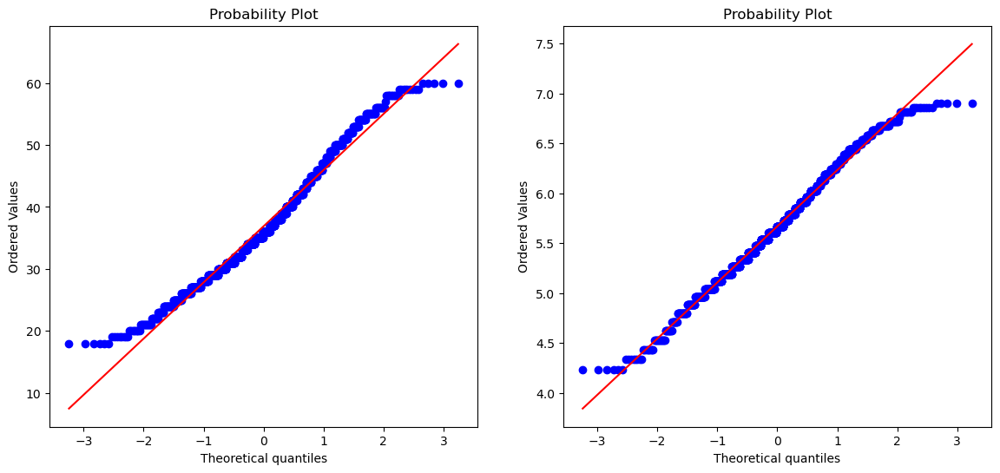

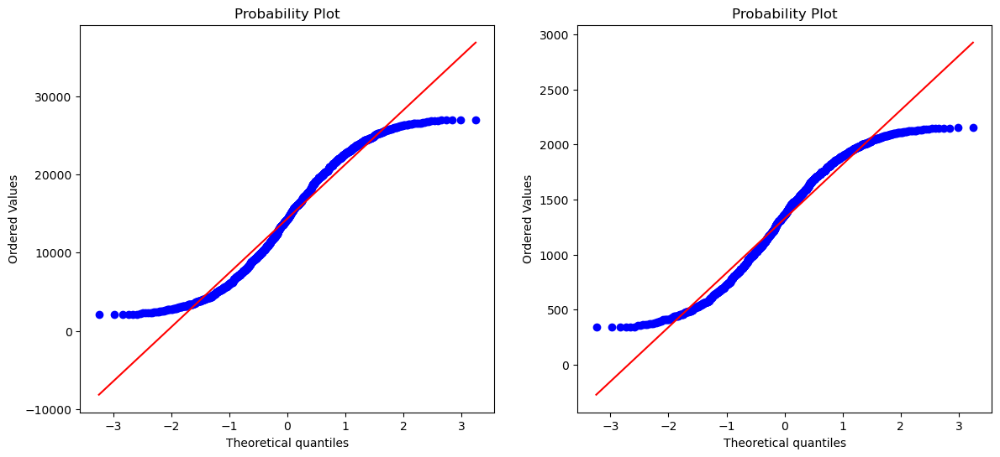

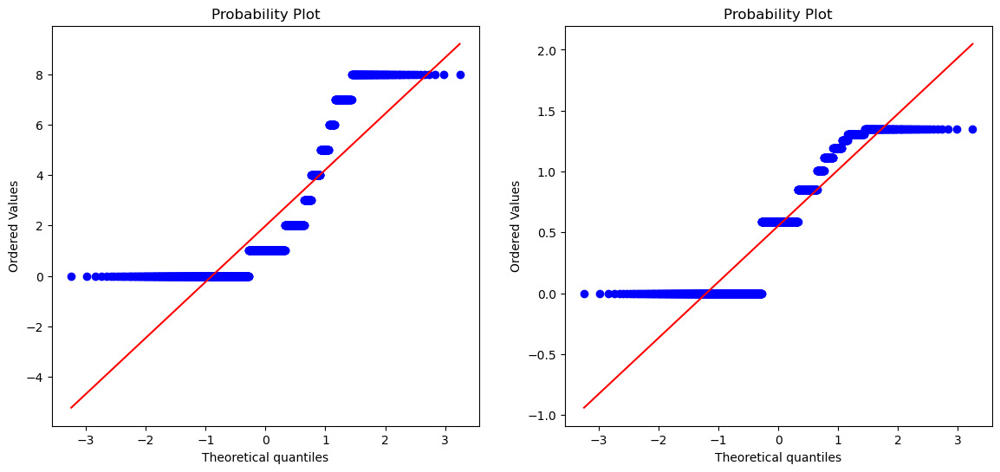

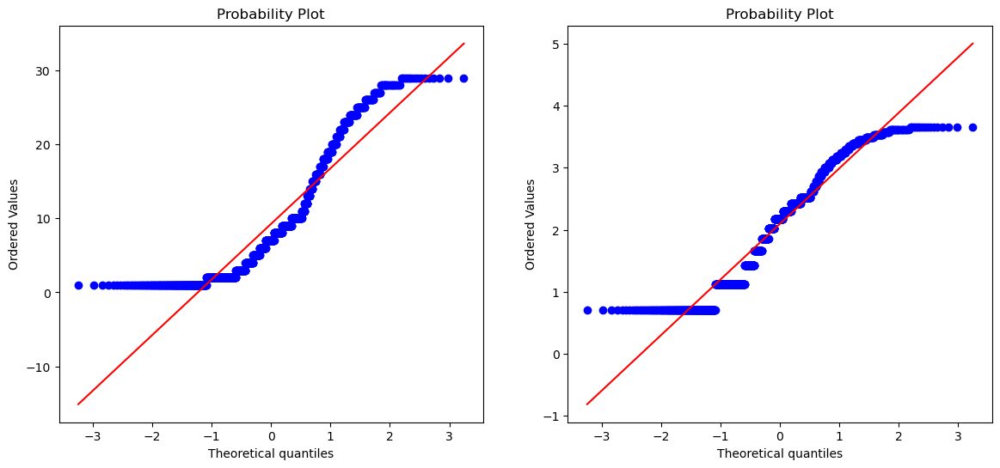

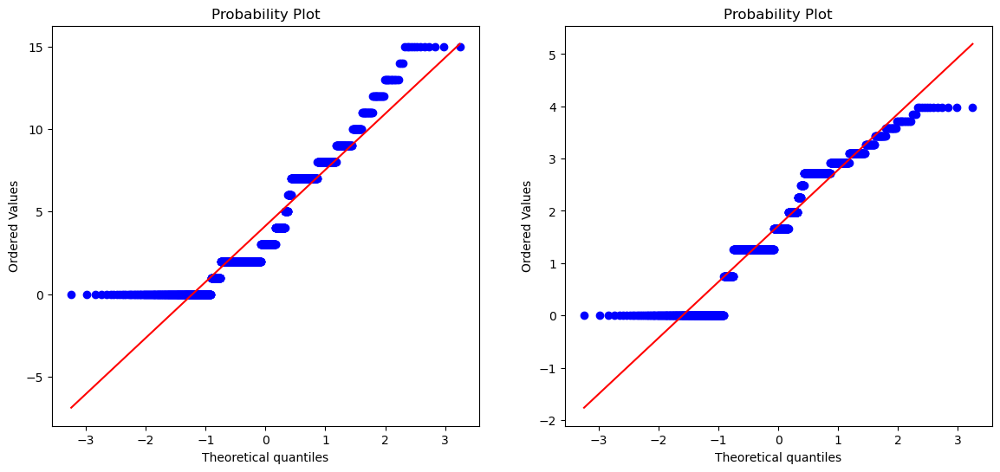

...

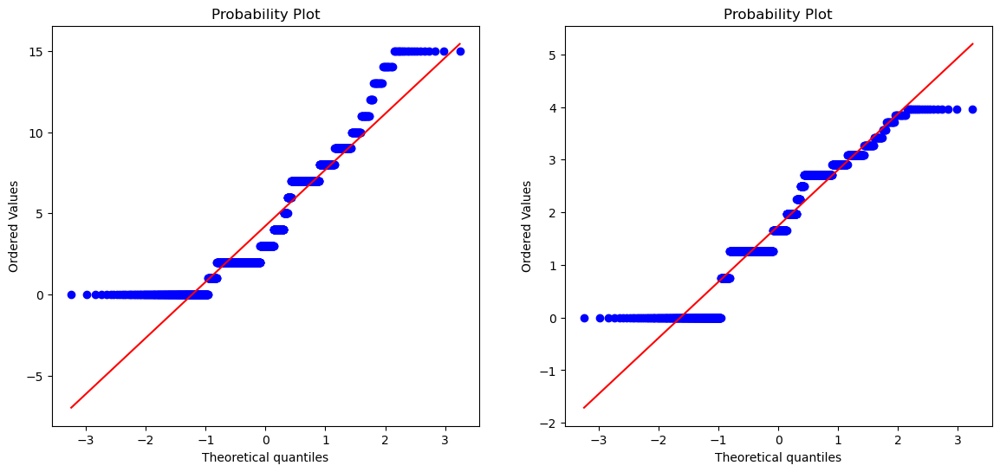

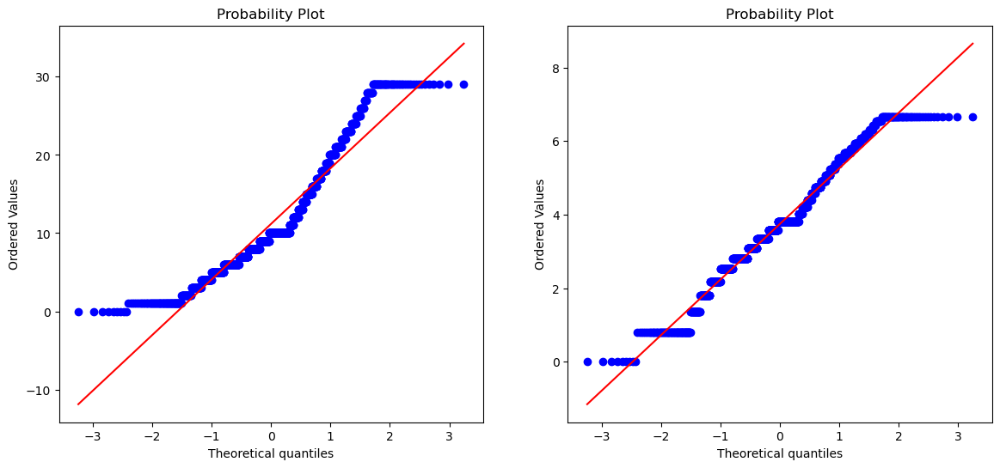

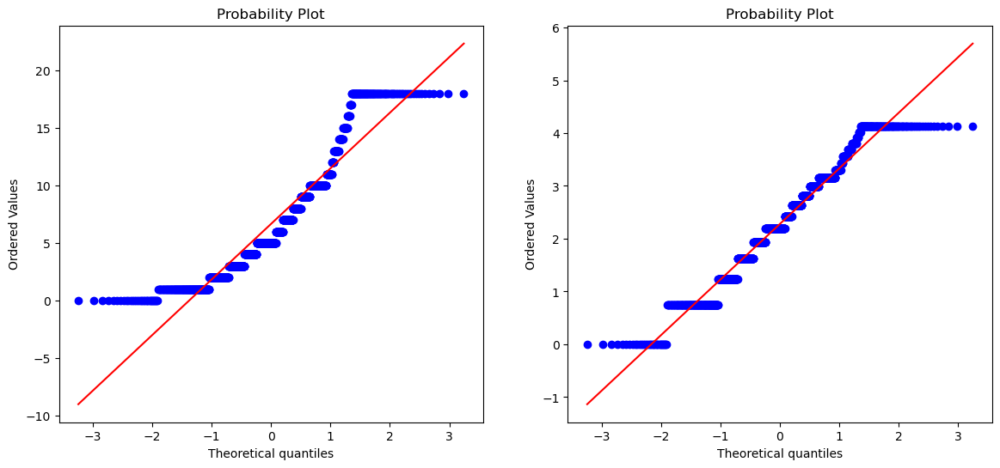

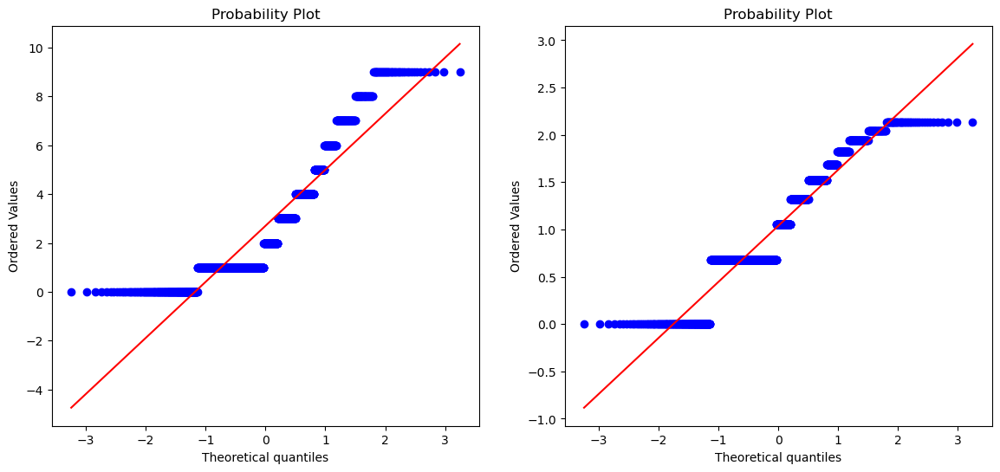

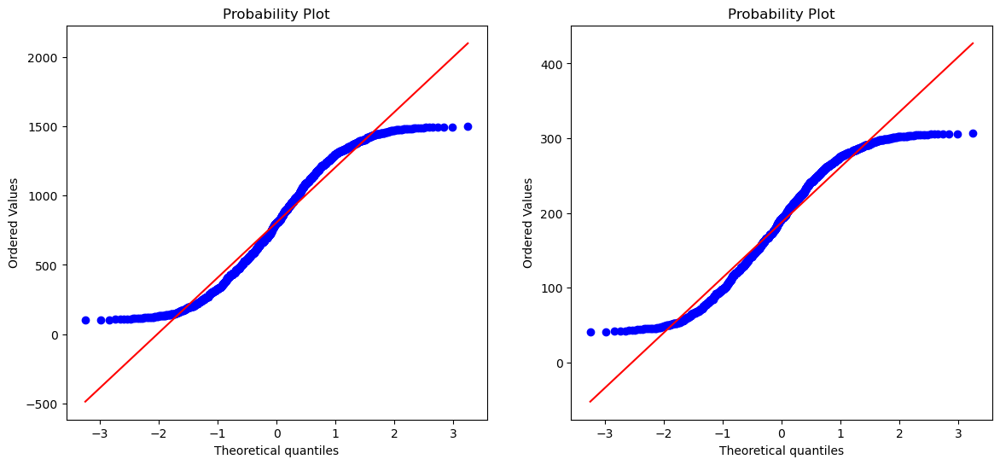

In [1391]:
for i in conti:
    plt.figure(figsize=(14,6))
    plt.subplot(121)
    stats.probplot(x_train[i],plot=plt)
    plt.subplot(122)
    stats.probplot(x_train_transformed_yeo_johnson[i],plot=plt)
    plt.show()

In [1392]:
# comparision of pdf between box-cox and yeo-johnson 

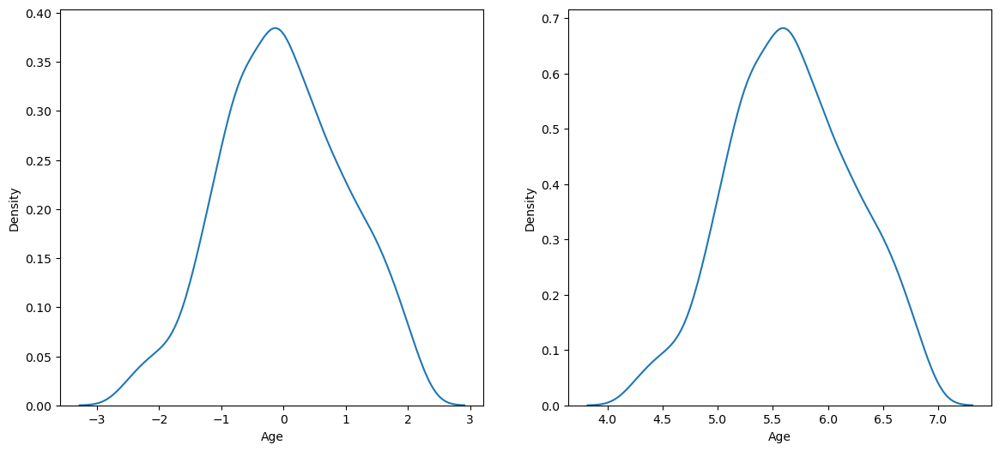

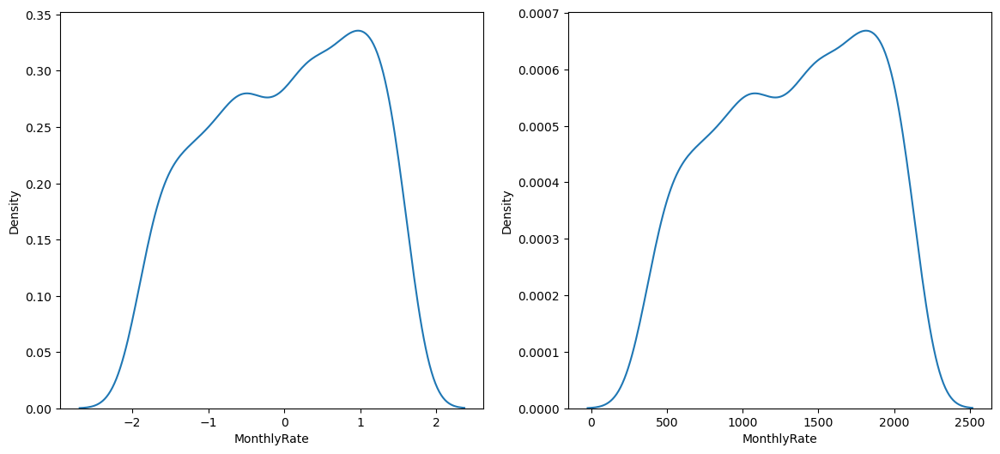

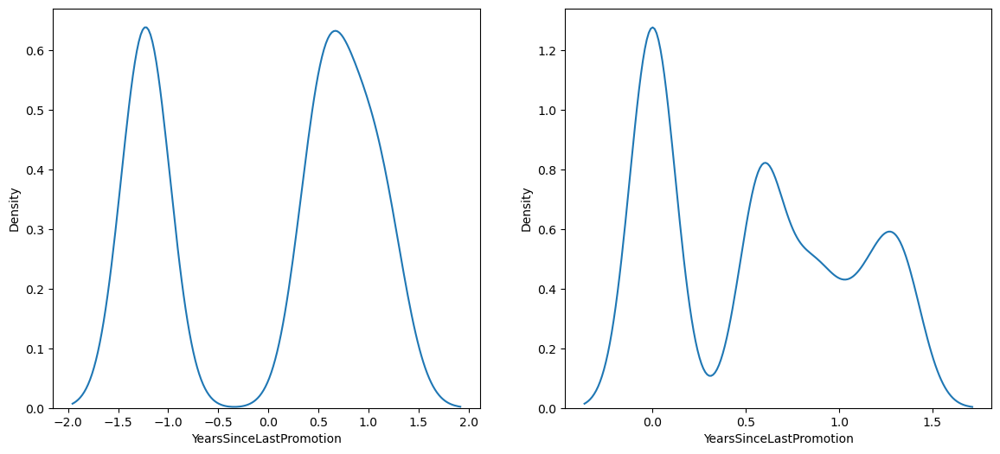

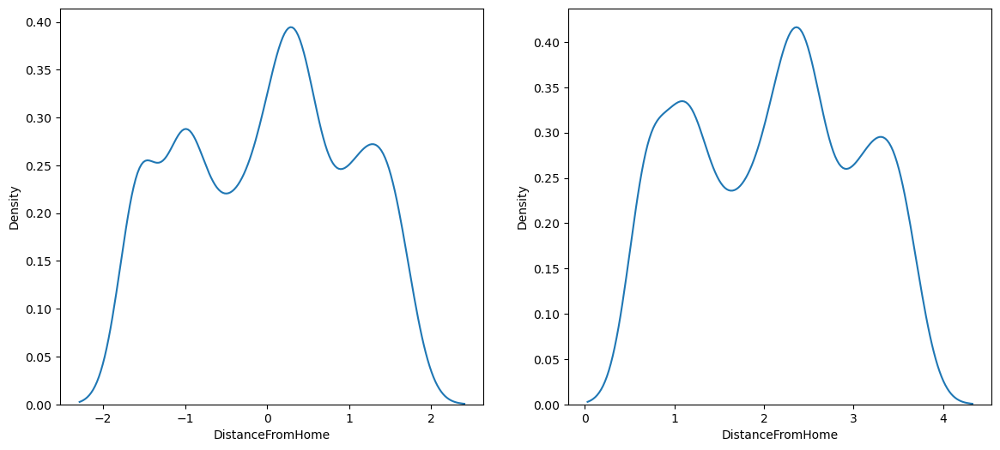

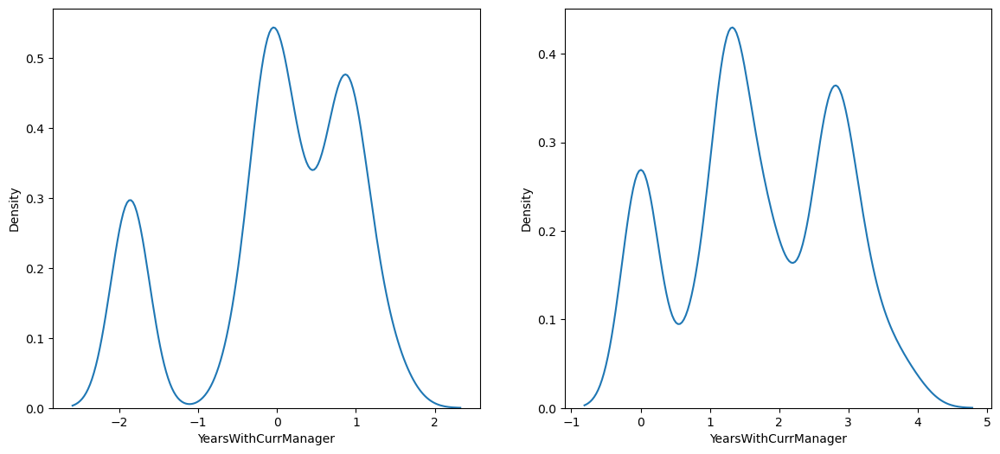

...

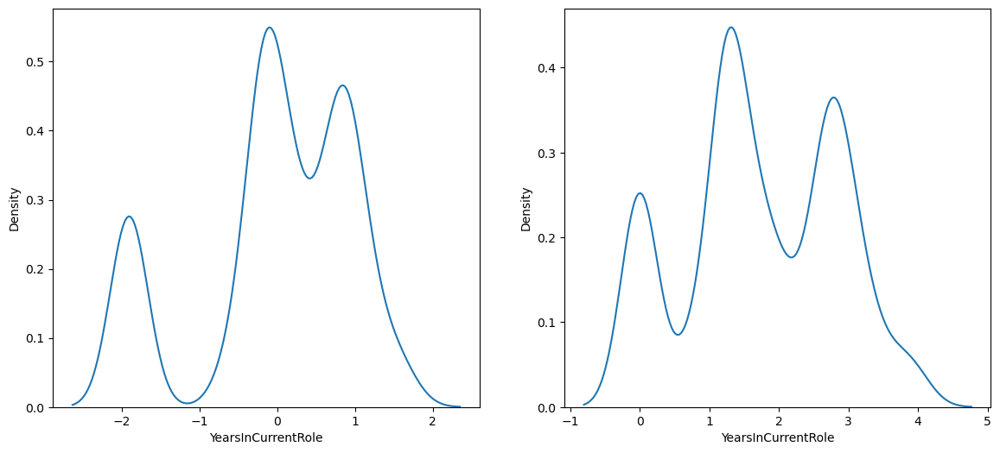

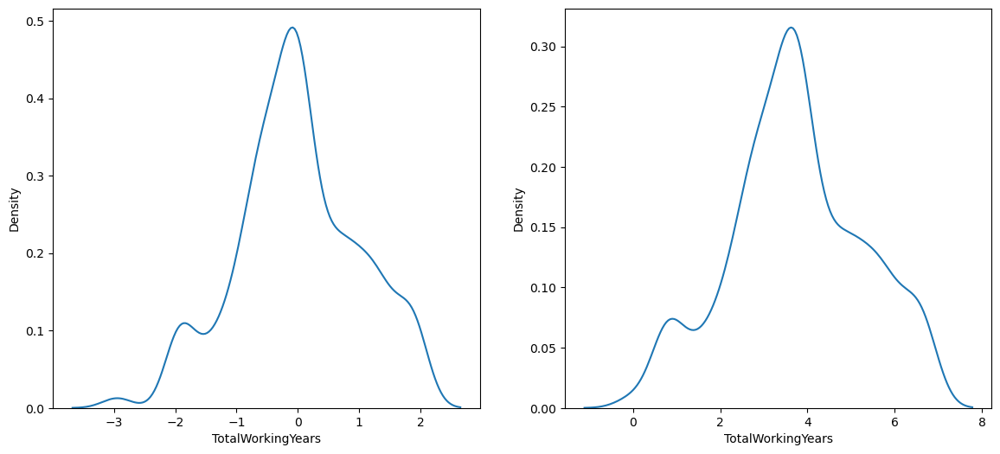

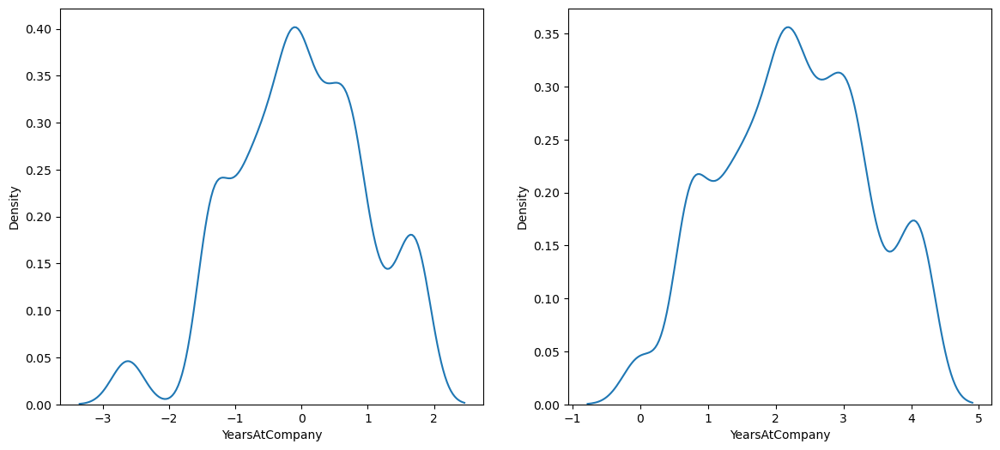

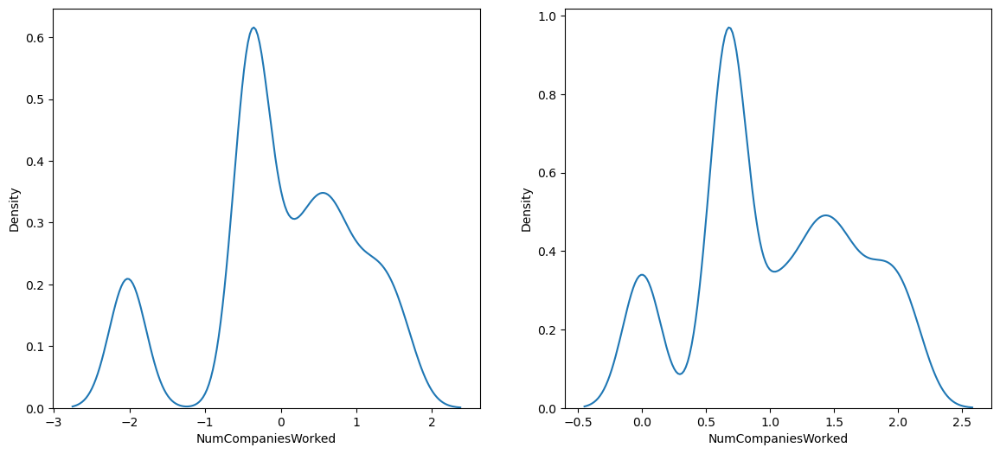

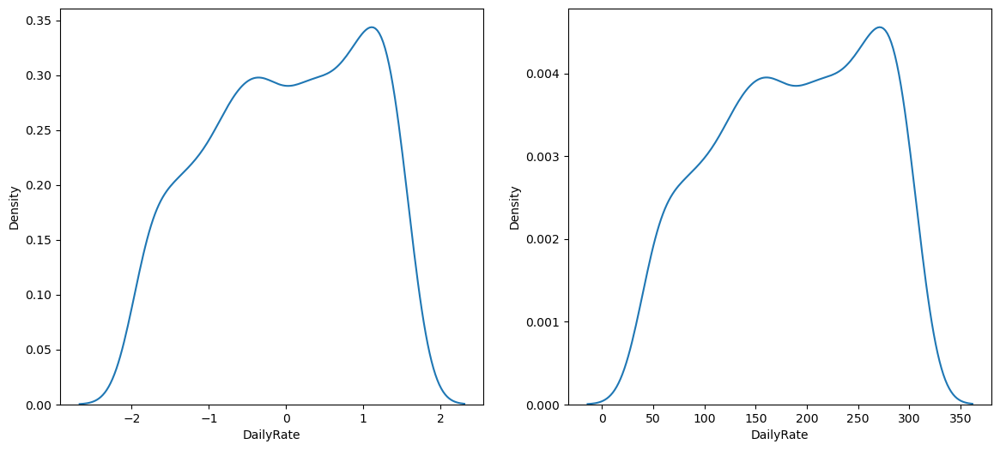

In [1393]:
for i in conti:
    plt.figure(figsize=(14,6))
    plt.subplot(121)
    sns.kdeplot(x_train_transformed_box_cox[i])
    plt.subplot(122)
    sns.kdeplot(x_train_transformed_yeo_johnson[i])
    plt.show()

# comparision of Q-Q plot between box-cox and yeo-johnson 

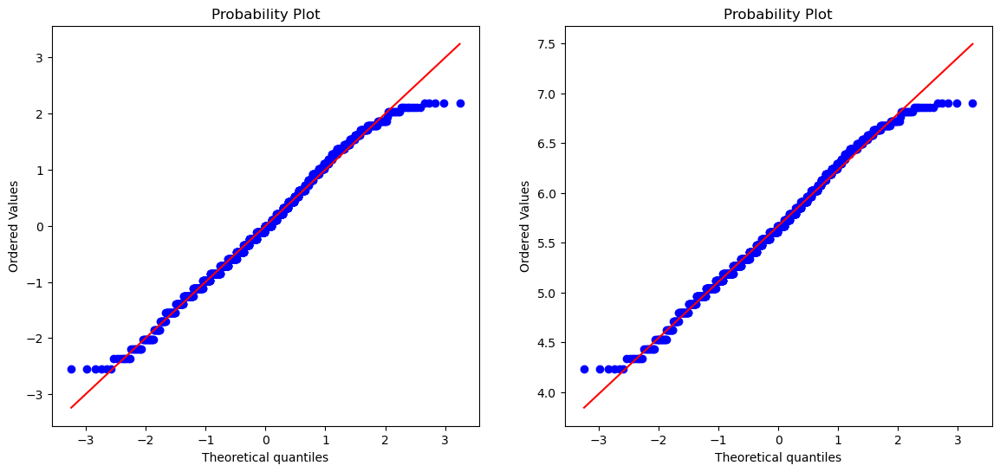

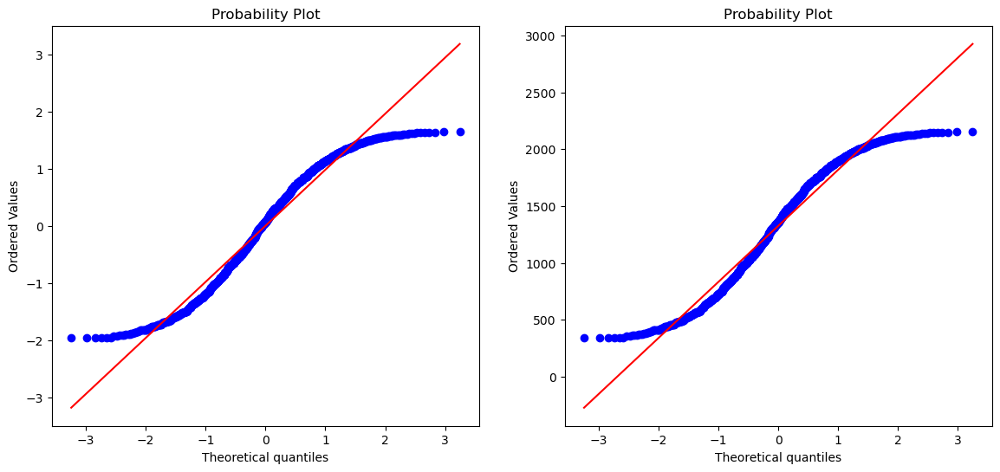

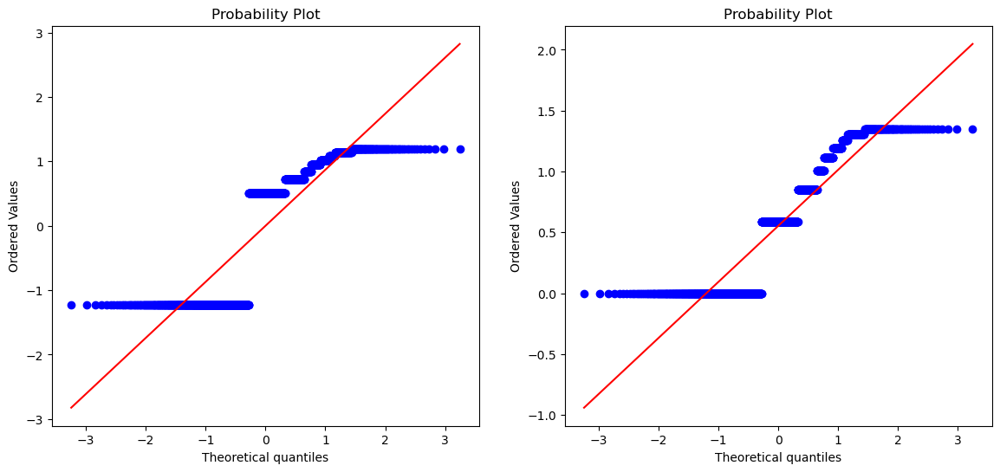

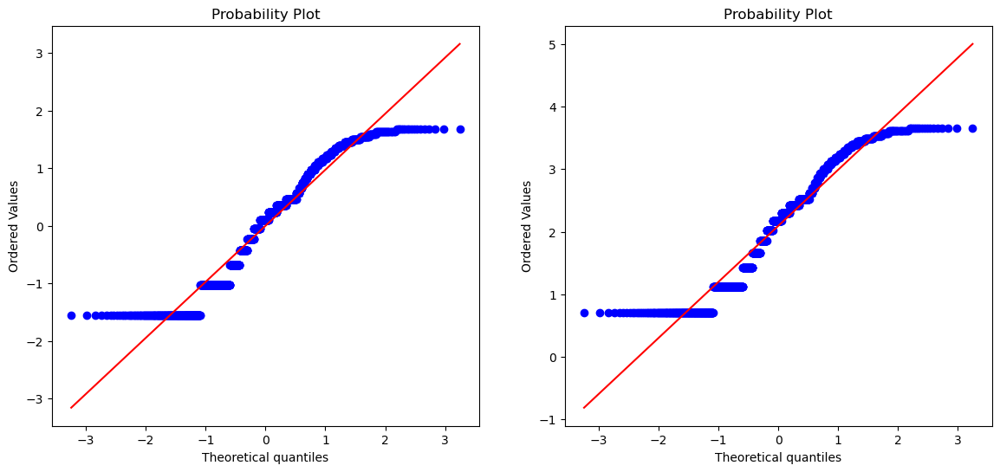

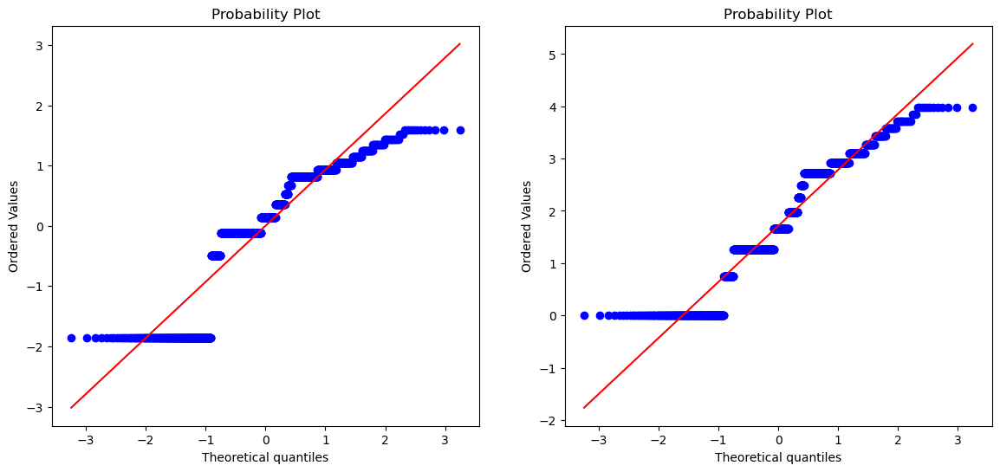

...

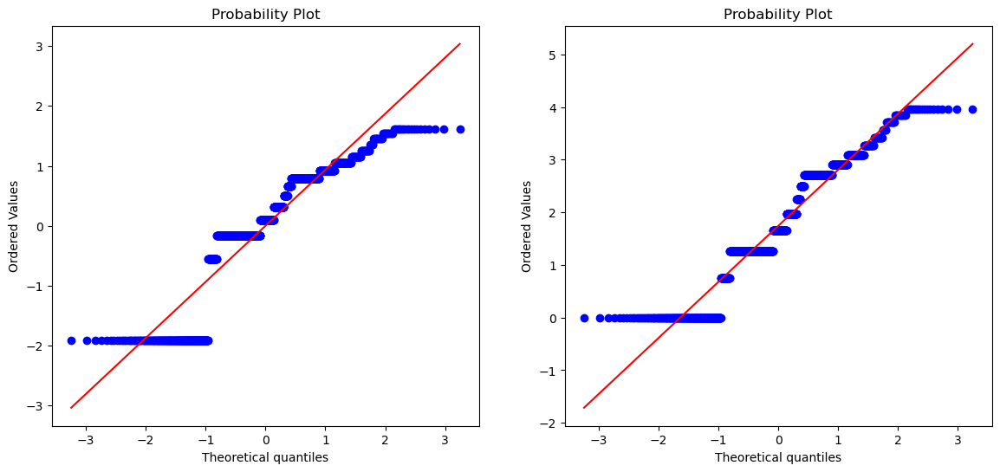

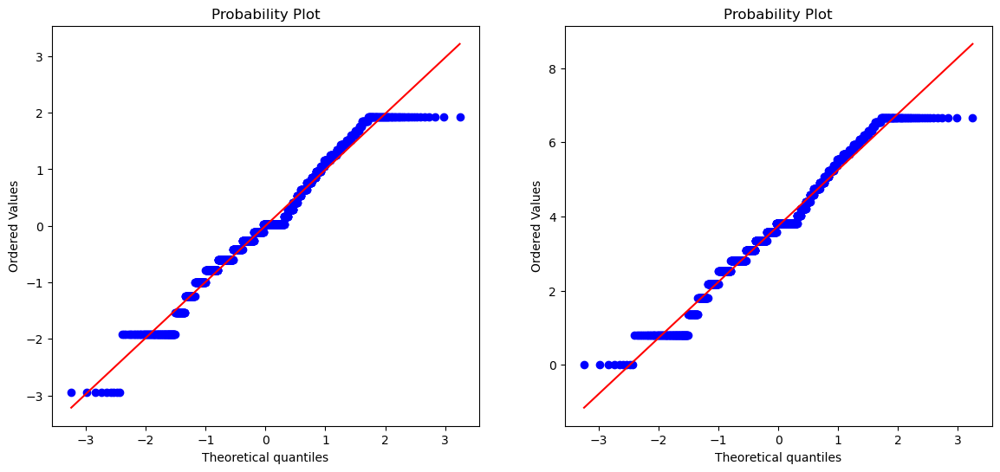

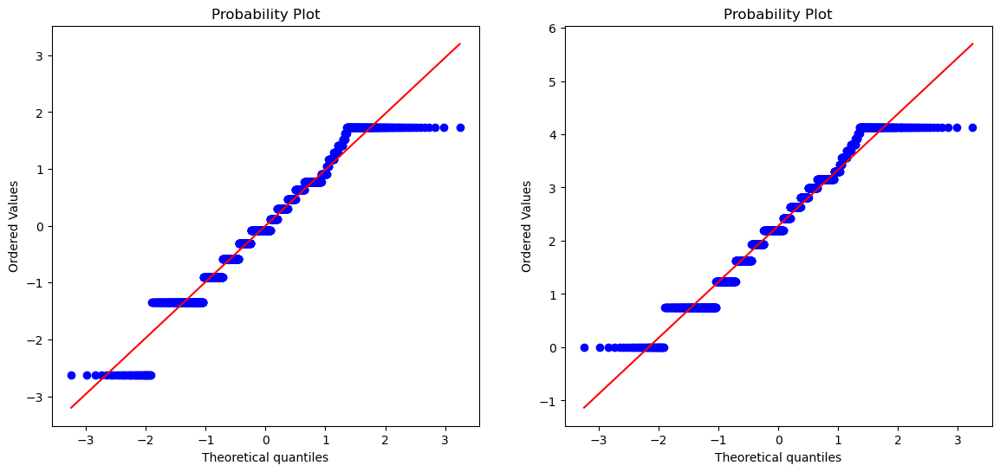

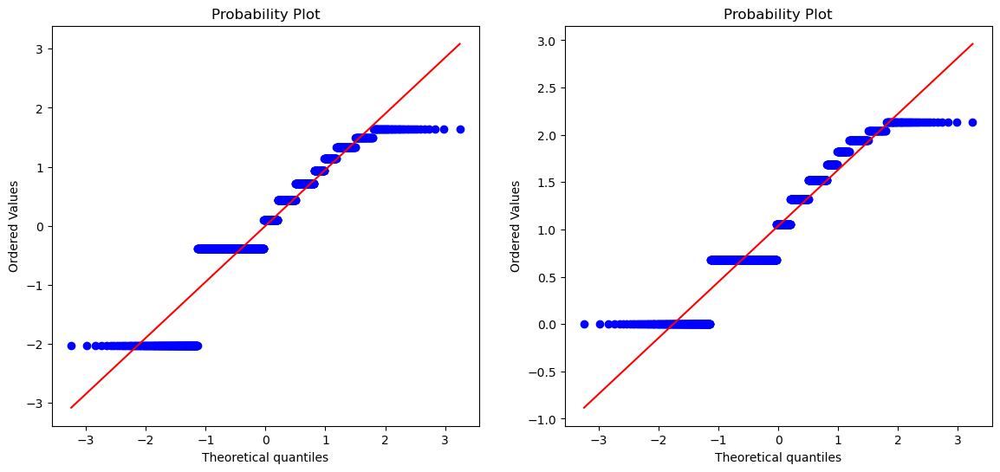

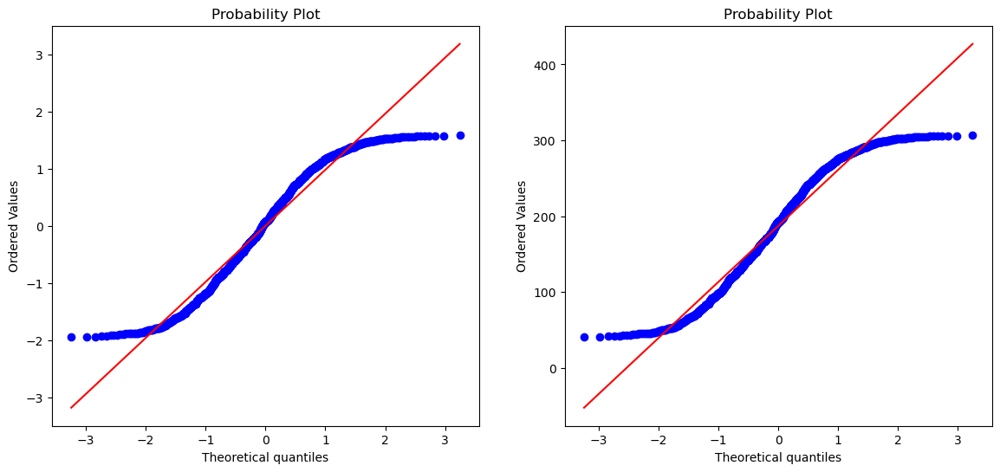

In [1395]:
for i in conti:
    plt.figure(figsize=(14,6))
    plt.subplot(121)
    stats.probplot(x_train_transformed_box_cox[i],plot=plt)
    plt.subplot(122)
    stats.probplot(x_train_transformed_yeo_johnson[i],plot=plt)
    plt.show()

 Both box-cox and yeo-johnson look similar but we prefer yeo-johnson here.

In [1397]:
from sklearn.compose import ColumnTransformer

In [1398]:
def find_column_number(list1=None,df=None):
    """ 
    This function is used to know the position or location of the features in the dataframe.
    
    list1: Give the list of name whose loction you want.

    df=dataframe
    
    Ex:-l1=["A","B","C"]
    find_column_number(l1,df)
    return:- {"A":1,"B":2,"C":3}
    
    """
    col={}
    for i in list1:
        k=0
        for j in df.columns:
            if i==j:
                col[i]=k
            k+=1
    return col

In [1399]:
find_column_number(conti,x_train)

{'Age': 0,
 'MonthlyRate': 1,
 'YearsSinceLastPromotion': 2,
 'DistanceFromHome': 3,
 'YearsWithCurrManager': 4,
 'HourlyRate': 5,
 'TrainingTimesLastYear': 6,
 'MonthlyIncome': 7,
 'PercentSalaryHike': 8,
 'YearsInCurrentRole': 9,
 'TotalWorkingYears': 10,
 'YearsAtCompany': 11,
 'NumCompaniesWorked': 12,
 'DailyRate': 13}

In [1400]:
find_column_number(cate,x_train)

{'BusinessTravel': 23,
 'Department': 24,
 'EducationField': 25,
 'Gender': 26,
 'JobRole': 27,
 'MaritalStatus': 28,
 'OverTime': 29}

In [1401]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

# First transformer to make data ready to predict

In [1403]:

trf1=ColumnTransformer(
    [
        ("yeo_",PowerTransformer(method='yeo-johnson',standardize=True),list(range(0,14))),
        ('scaled',StandardScaler(),list(range(14,23))),
        ('ecd_',OneHotEncoder(drop="first"),list(range(23,30)))
        
    ],remainder='passthrough'
)

In [1404]:
x_train.shape

(1176, 30)

In [1405]:
trf=trf1.fit_transform(x_train)

In [1406]:
trf_x_test=trf1.transform(x_test)

In [1407]:
trf1.get_feature_names_out()

array(['yeo___Age', 'yeo___MonthlyRate', 'yeo___YearsSinceLastPromotion',
       'yeo___DistanceFromHome', 'yeo___YearsWithCurrManager',
       'yeo___HourlyRate', 'yeo___TrainingTimesLastYear',
       'yeo___MonthlyIncome', 'yeo___PercentSalaryHike',
       'yeo___YearsInCurrentRole', 'yeo___TotalWorkingYears',
       'yeo___YearsAtCompany', 'yeo___NumCompaniesWorked',
       'yeo___DailyRate', 'scaled__Education',
       'scaled__EnvironmentSatisfaction', 'scaled__JobInvolvement',
       'scaled__JobLevel', 'scaled__PerformanceRating',
       'scaled__JobSatisfaction', 'scaled__RelationshipSatisfaction',
       'scaled__StockOptionLevel', 'scaled__WorkLifeBalance',
       'ecd___BusinessTravel_Travel_Frequently',
       'ecd___BusinessTravel_Travel_Rarely',
       'ecd___Department_Research & Development',
       'ecd___Department_Sales', 'ecd___EducationField_Life Sciences',
       'ecd___EducationField_Marketing', 'ecd___EducationField_Medical',
       'ecd___EducationField_Other',

# Balancing the datasets

In [1409]:
from imblearn.over_sampling import SMOTE

In [1410]:
sr=SMOTE()

In [1411]:
x_train_smote,y_train_smote=sr.fit_resample(trf,y_train)

In [1412]:
y_train_smote.value_counts()

Attrition1
0    983
1    983
Name: count, dtype: int64

In [1413]:
x_train_smote

array([[-1.11631717,  0.33440284, -1.10703203, ...,  0.        ,
         0.        ,  0.        ],
       [-0.11749673, -1.16255778,  0.06828774, ...,  1.        ,
         0.        ,  0.        ],
       [-0.00502164, -0.88240659, -1.10703203, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 1.39802968, -1.07247555,  0.46169763, ...,  0.        ,
         1.        ,  0.75029645],
       [-0.73375062,  0.29416692,  0.39746883, ...,  0.        ,
         1.        ,  0.22921101],
       [ 0.06184489, -0.45690805,  0.06828774, ...,  1.        ,
         0.        ,  0.        ]])

In [1414]:
# Here we change some X_smote to x_train_smote
# x_train_smote_df=pd.DataFrame(x_smote,columns=trf1.get_feature_names_out())
x_train_smote_df=pd.DataFrame(x_train_smote,columns=trf1.get_feature_names_out())
x_test_df=pd.DataFrame(trf_x_test,columns=trf1.get_feature_names_out())

In [1415]:
y_train_smote

0       0
1       0
2       1
3       0
4       0
       ..
1961    1
1962    1
1963    1
1964    1
1965    1
Name: Attrition1, Length: 1966, dtype: int64

# Feature selection

In [1417]:
# by Random forest

In [1418]:
from sklearn.ensemble import RandomForestClassifier

In [1419]:
rf_model=RandomForestClassifier(n_estimators=100)

In [1420]:
rf_model.fit(x_train_smote_df,y_train_smote)

RandomForestClassifier()

In [1421]:
features_imp=rf_model.feature_importances_

In [1422]:
features_imp

array([0.03138121, 0.02280806, 0.01384527, 0.02458815, 0.0339477 ,
       0.02552947, 0.02077201, 0.03786278, 0.02551896, 0.02249776,
       0.03044125, 0.03321593, 0.02612   , 0.02340463, 0.0180286 ,
       0.03789962, 0.02084154, 0.04092696, 0.003568  , 0.03307772,
       0.01673131, 0.04601148, 0.01666313, 0.03195951, 0.01440817,
       0.01732759, 0.01213739, 0.01633136, 0.00465385, 0.01552031,
       0.00217017, 0.00779305, 0.01806572, 0.00277226, 0.00887519,
       0.00184703, 0.00668687, 0.00112871, 0.00760345, 0.01187049,
       0.00599946, 0.0267543 , 0.02882174, 0.15159184])

In [1423]:
d={}
for i in range(44):
    d[trf1.get_feature_names_out()[i]]=features_imp[i]
    

In [1424]:
features_imp_all=sorted(d.items(),key=lambda x:x[1],reverse=True)

In [1425]:
features_imp_high_low=[]
for i in features_imp_all:
    features_imp_high_low.append(i[0])

In [1426]:
features_imp_high_low

['ecd___OverTime_Yes',
 'scaled__StockOptionLevel',
 'scaled__JobLevel',
 'scaled__EnvironmentSatisfaction',
 'yeo___MonthlyIncome',
 'yeo___YearsWithCurrManager',
 'yeo___YearsAtCompany',
 'scaled__JobSatisfaction',
 'ecd___BusinessTravel_Travel_Frequently',
 'yeo___Age',
 'yeo___TotalWorkingYears',
 'ecd___MaritalStatus_Single',
 'ecd___MaritalStatus_Married',
 'yeo___NumCompaniesWorked',
 'yeo___HourlyRate',
 'yeo___PercentSalaryHike',
 'yeo___DistanceFromHome',
 'yeo___DailyRate',
 'yeo___MonthlyRate',
 'yeo___YearsInCurrentRole',
 'scaled__JobInvolvement',
 'yeo___TrainingTimesLastYear',
 'ecd___Gender_Male',
 'scaled__Education',
 'ecd___Department_Research & Development',
 'scaled__RelationshipSatisfaction',
 'scaled__WorkLifeBalance',
 'ecd___EducationField_Life Sciences',
 'ecd___EducationField_Medical',
 'ecd___BusinessTravel_Travel_Rarely',
 'yeo___YearsSinceLastPromotion',
 'ecd___Department_Sales',
 'ecd___JobRole_Sales Executive',
 'ecd___JobRole_Laboratory Technician',
 

In [1427]:
find_column_number(features_imp_high_low[:22],x_train_smote_df)

{'ecd___OverTime_Yes': 43,
 'scaled__StockOptionLevel': 21,
 'scaled__JobLevel': 17,
 'scaled__EnvironmentSatisfaction': 15,
 'yeo___MonthlyIncome': 7,
 'yeo___YearsWithCurrManager': 4,
 'yeo___YearsAtCompany': 11,
 'scaled__JobSatisfaction': 19,
 'ecd___BusinessTravel_Travel_Frequently': 23,
 'yeo___Age': 0,
 'yeo___TotalWorkingYears': 10,
 'ecd___MaritalStatus_Single': 42,
 'ecd___MaritalStatus_Married': 41,
 'yeo___NumCompaniesWorked': 12,
 'yeo___HourlyRate': 5,
 'yeo___PercentSalaryHike': 8,
 'yeo___DistanceFromHome': 3,
 'yeo___DailyRate': 13,
 'yeo___MonthlyRate': 1,
 'yeo___YearsInCurrentRole': 9,
 'scaled__JobInvolvement': 16,
 'yeo___TrainingTimesLastYear': 6}

In [1428]:
# select only important features 
imp_fea_index=find_column_number(features_imp_high_low[:45],x_train_smote_df).values()

In [1429]:
imp_fea_index

dict_values([43, 21, 17, 15, 7, 4, 11, 19, 23, 0, 10, 42, 41, 12, 5, 8, 3, 13, 1, 9, 16, 6, 32, 14, 25, 20, 22, 27, 29, 24, 2, 26, 39, 34, 31, 38, 36, 40, 28, 18, 33, 30, 35, 37])

In [1430]:
x_train_smote_df_imp_fea=x_train_smote_df.iloc[:,list(imp_fea_index)]
x_test_df_imp_fea=x_test_df.iloc[:,list(imp_fea_index)]

In [1431]:
x_test_df_imp_fea.head()

,ecd___OverTime_Yes,scaled__StockOptionLevel,scaled__JobLevel,scaled__EnvironmentSatisfaction,yeo___MonthlyIncome,yeo___YearsWithCurrManager,yeo___YearsAtCompany,scaled__JobSatisfaction,ecd___BusinessTravel_Travel_Frequently,yeo___Age,yeo___TotalWorkingYears,ecd___MaritalStatus_Single,ecd___MaritalStatus_Married,yeo___NumCompaniesWorked,yeo___HourlyRate,yeo___PercentSalaryHike,yeo___DistanceFromHome,yeo___DailyRate,yeo___MonthlyRate,yeo___YearsInCurrentRole,scaled__JobInvolvement,yeo___TrainingTimesLastYear,ecd___Gender_Male,scaled__Education,ecd___Department_Research & Development,scaled__RelationshipSatisfaction,scaled__WorkLifeBalance,ecd___EducationField_Life Sciences,ecd___EducationField_Medical,ecd___BusinessTravel_Travel_Rarely,yeo___YearsSinceLastPromotion,ecd___Department_Sales,ecd___JobRole_Sales Executive,ecd___JobRole_Laboratory Technician,ecd___EducationField_Technical Degree,ecd___JobRole_Research Scientist,ecd___JobRole_Manufacturing Director,ecd___JobRole_Sales Representative,ecd___EducationField_Marketing,scaled__PerformanceRating,ecd___JobRole_Human Resources,ecd___EducationField_Other,ecd___JobRole_Manager,ecd___JobRole_Research Director
0,0.0,0.208385,-0.966845,0.284030,-1.112416,-0.863535,-0.973965,1.166712,0.0,-1.858287,-1.278670,0.0,1.0,-1.686639,1.649533,-0.123981,-1.051203,-0.449912,0.721146,-0.898739,0.382980,-0.600833,1.0,-1.897535,1.0,0.260289,0.354618,0.0,0.0,1.0,0.592627,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,-0.426509,0.0,0.0,0.0,0.0
1,0.0,0.208385,0.852370,1.189231,1.139588,0.902327,0.502307,0.261664,0.0,1.008176,0.428728,0.0,0.0,1.273356,0.508676,-0.500143,0.083803,-0.522184,1.317775,0.880199,0.382980,0.198356,1.0,-0.907517,1.0,-0.675796,0.354618,0.0,1.0,1.0,-1.107032,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.426509,0.0,0.0,0.0,0.0
2,1.0,0.208385,-0.057237,1.189231,-0.337234,-0.055794,-0.331232,-0.643385,0.0,-0.847916,0.037675,0.0,1.0,0.789249,-0.945822,-0.500143,0.752381,1.331745,1.255233,-0.084499,-1.020087,-0.600833,1.0,-0.907517,1.0,-1.611882,0.354618,0.0,0.0,1.0,-1.107032,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.426509,0.0,1.0,0.0,0.0
3,1.0,0.208385,-0.057237,1.189231,0.195472,-0.407848,-0.083985,0.261664,0.0,2.025065,0.304930,0.0,0.0,0.032692,-1.728056,-0.500143,-1.507077,-1.000454,0.434627,-0.084499,-2.423153,-0.600833,1.0,1.072520,1.0,1.196374,0.354618,1.0,0.0,0.0,0.068288,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.426509,0.0,0.0,0.0,0.0
4,1.0,0.208385,-0.057237,-0.621171,-0.033555,-0.863535,0.663307,1.166712,0.0,-0.349836,0.037675,0.0,1.0,-1.686639,1.427716,-0.500143,0.914219,-0.693625,1.011972,0.880199,0.382980,2.225917,0.0,-0.907517,1.0,-1.611882,0.354618,0.0,1.0,1.0,1.587423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.426509,0.0,0.0,0.0,0.0


In [1432]:
x_train_smote_df_imp_fea.head()

,ecd___OverTime_Yes,scaled__StockOptionLevel,scaled__JobLevel,scaled__EnvironmentSatisfaction,yeo___MonthlyIncome,yeo___YearsWithCurrManager,yeo___YearsAtCompany,scaled__JobSatisfaction,ecd___BusinessTravel_Travel_Frequently,yeo___Age,yeo___TotalWorkingYears,ecd___MaritalStatus_Single,ecd___MaritalStatus_Married,yeo___NumCompaniesWorked,yeo___HourlyRate,yeo___PercentSalaryHike,yeo___DistanceFromHome,yeo___DailyRate,yeo___MonthlyRate,yeo___YearsInCurrentRole,scaled__JobInvolvement,yeo___TrainingTimesLastYear,ecd___Gender_Male,scaled__Education,ecd___Department_Research & Development,scaled__RelationshipSatisfaction,scaled__WorkLifeBalance,ecd___EducationField_Life Sciences,ecd___EducationField_Medical,ecd___BusinessTravel_Travel_Rarely,yeo___YearsSinceLastPromotion,ecd___Department_Sales,ecd___JobRole_Sales Executive,ecd___JobRole_Laboratory Technician,ecd___EducationField_Technical Degree,ecd___JobRole_Research Scientist,ecd___JobRole_Manufacturing Director,ecd___JobRole_Sales Representative,ecd___EducationField_Marketing,scaled__PerformanceRating,ecd___JobRole_Human Resources,ecd___EducationField_Other,ecd___JobRole_Manager,ecd___JobRole_Research Director
0,0.0,1.358905,-0.966845,1.189231,-0.321004,0.902327,0.326636,-1.548433,0.0,-1.116317,-0.429389,0.0,0.0,-0.586894,0.124291,-1.482046,1.186674,1.173550,0.334403,0.880199,-1.020087,0.198356,1.0,0.082502,1.0,-1.611882,0.354618,0.0,0.0,1.0,-1.107032,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.426509,0.0,1.0,0.0,0.0
1,0.0,-0.942135,-0.057237,0.284030,-0.125003,-1.544499,-0.083985,0.261664,0.0,-0.117497,-0.807718,0.0,1.0,-0.586894,1.020856,0.473353,1.123822,0.998044,-1.162558,-0.439270,0.382980,0.198356,0.0,0.082502,0.0,-0.675796,0.354618,0.0,1.0,1.0,0.068288,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.426509,0.0,0.0,0.0,0.0
2,0.0,0.208385,-0.057237,-1.526372,-0.047677,-1.544499,-1.435666,0.261664,0.0,-0.005022,-0.107763,0.0,0.0,1.462415,0.790222,-0.123981,0.914219,-0.282912,-0.882407,-1.585988,0.382980,0.198356,1.0,0.082502,1.0,-0.675796,-1.044815,0.0,0.0,1.0,-1.107032,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.426509,0.0,1.0,0.0,0.0
3,0.0,-0.942135,-0.966845,-0.621171,-0.078676,-0.407848,-0.620797,0.261664,1.0,0.723161,0.975151,1.0,0.0,0.789249,0.365797,-0.946171,1.645983,0.422266,0.308019,-0.439270,1.786047,-0.600833,0.0,0.082502,1.0,1.196374,0.354618,0.0,1.0,0.0,0.068288,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.426509,0.0,0.0,0.0,0.0
4,1.0,0.208385,1.761978,-0.621171,1.189532,1.804535,1.727971,0.261664,1.0,1.367251,1.913045,0.0,1.0,0.032692,-1.217321,0.196896,1.246583,1.029984,0.894002,1.061007,0.382980,0.198356,1.0,2.062538,1.0,0.260289,0.354618,0.0,1.0,0.0,1.587423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.426509,0.0,0.0,0.0,0.0


In [1433]:
x_train_final=x_train_smote_df_imp_fea.copy()
x_test_final=x_test_df_imp_fea.copy()
y_train_final=y_train_smote.copy()
y_test_final=y_test.copy()

In [1434]:
features_imp_all[:11]

[('ecd___OverTime_Yes', 0.15159183943213542),
 ('scaled__StockOptionLevel', 0.04601148084497137),
 ('scaled__JobLevel', 0.04092695766374918),
 ('scaled__EnvironmentSatisfaction', 0.03789961991918225),
 ('yeo___MonthlyIncome', 0.03786277625373261),
 ('yeo___YearsWithCurrManager', 0.03394769644987023),
 ('yeo___YearsAtCompany', 0.033215926119899736),
 ('scaled__JobSatisfaction', 0.03307771710129099),
 ('ecd___BusinessTravel_Travel_Frequently', 0.031959513792622025),
 ('yeo___Age', 0.031381210680623856),
 ('yeo___TotalWorkingYears', 0.030441247588230733)]

In [1435]:
features_imp_all[11:]

[('ecd___MaritalStatus_Single', 0.028821741779013),
 ('ecd___MaritalStatus_Married', 0.02675429657793132),
 ('yeo___NumCompaniesWorked', 0.02611999754734156),
 ('yeo___HourlyRate', 0.025529468592432283),
 ('yeo___PercentSalaryHike', 0.02551896223422687),
 ('yeo___DistanceFromHome', 0.02458814744531235),
 ('yeo___DailyRate', 0.023404633976237856),
 ('yeo___MonthlyRate', 0.02280806285744183),
 ('yeo___YearsInCurrentRole', 0.022497759524552987),
 ('scaled__JobInvolvement', 0.020841538749549797),
 ('yeo___TrainingTimesLastYear', 0.020772009496644345),
 ('ecd___Gender_Male', 0.018065717798175566),
 ('scaled__Education', 0.01802859826378558),
 ('ecd___Department_Research & Development', 0.01732759339650941),
 ('scaled__RelationshipSatisfaction', 0.016731310484435654),
 ('scaled__WorkLifeBalance', 0.01666312572780327),
 ('ecd___EducationField_Life Sciences', 0.01633136313699874),
 ('ecd___EducationField_Medical', 0.015520314310487632),
 ('ecd___BusinessTravel_Travel_Rarely', 0.014408168060262

In [1436]:
x_train_smote_df.iloc[:,[43, 21, 42, 8, 19, 5, 17, 7, 3, 13, 41, 6, 32, 4, 16, 1, 22, 15, 12, 11, 34, 9]].shape

(1966, 22)

In [1437]:
x_train_smote_df_imp_fea.shape

(1966, 44)

# Model training and prediction without feature selection

# Model

In [1440]:
# Our main aim to improve recall score

In [1441]:
from sklearn.metrics import confusion_matrix,recall_score,precision_score,f1_score
from sklearn.model_selection import cross_val_score

In [1442]:
def result(model,features=None,cv1=5):
    x_train=x_train_final.iloc[:,:features]
    x_test=x_test_final.iloc[:,:features]
    y_train=y_train_final
    # y_test=y_test
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    print("Accuracy_score = {} , Recall_score= {}, precision_score={} , f1_score={}".format(accuracy_score(y_test,y_pred),recall_score(y_test,y_pred),precision_score(y_test, y_pred),f1_score(y_test,y_pred)))
    skf = StratifiedKFold(n_splits=cv1, shuffle=True)
    x=cross_val_score(model,X=x_train,y=y_train,cv=skf)
    print("cross_validation_score= {}".format(np.round(np.mean(x),2)))
    print("Confusion matrix = ")
    return confusion_matrix(y_test,y_pred)

In [1443]:
def hyperperameter(model,model_name,parameters,cv=10,scoring='recall'):
    for i in range(2,45,3):
        print("code {} start running".format(i))
        mgd=GridSearchCV(estimator=model,param_grid=parameters,cv=cv,scoring='recall',n_jobs=-1)
        mgd.fit(x_train_final.iloc[:,:i],y_train_final) 
        best_params=mgd.best_params_
        m=model_name(**best_params)
        print("number_of_features={}, best_para={}".format(i,best_params))
        print(result(m,features=i,cv1=cv))
       
        

In [1444]:
from sklearn.model_selection import StratifiedKFold

In [1445]:
from xgboost import XGBClassifier

# 1. Logistic Regression (with all features)

In [1447]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,recall_score,confusion_matrix,precision_score


- Model Hyper Parameter tuning

In [2133]:
Lr=LogisticRegression()
parameters_Lr={
    "penalty":['l1', 'l2', 'elasticnet'],
    "C": [0.001,0.05, 0.01, 0.1, 0.5,1],
    "solver" : ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
    "max_iter" : [100,200,300,]
}

In [2135]:
hyperperameter(LogisticRegression(),LogisticRegression,parameters=parameters_Lr)

code 2 start running
number_of_features=2, best_para={'C': 0.01, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Accuracy_score = 0.5068027210884354 , Recall_score= 0.9318181818181818, precision_score=0.22404371584699453 , f1_score=0.36123348017621143
cross_validation_score= 0.65
Confusion matrix = 
[[108 142]
 [  3  41]]
code 5 start running
number_of_features=5, best_para={'C': 0.01, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Accuracy_score = 0.5476190476190477 , Recall_score= 0.7727272727272727, precision_score=0.21656050955414013 , f1_score=0.3383084577114428
cross_validation_score= 0.64
Confusion matrix = 
[[127 123]
 [ 10  34]]
code 8 start running
number_of_features=8, best_para={'C': 0.1, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Accuracy_score = 0.7482993197278912 , Recall_score= 0.7045454545454546, precision_score=0.33695652173913043 , f1_score=0.45588235294117646
cross_validation_score= 0.75
Confusion matrix = 
[[189  61]
 [ 13  31]]
cod

# Best result in Lr:-

# 2. Support vector classifier

In [1814]:
from sklearn.svm import SVC

In [1816]:
parameters_svc={
    "C":[0.001,0.01,0.1,0.5,1,1.5],
    "kernel":['linear', 'poly', 'rbf', 'sigmoid'],
    #"degree ":[2,3,4], degree are only used for 'poly' kernel we have to try this also for poly.
    'gamma': [0.001, 0.01, 0.1, 1]
    
}

In [1818]:
hyperperameter(SVC(),SVC,parameters=parameters_svc)

code 2 start running
number_of_features=2, best_para={'C': 0.5, 'gamma': 0.1, 'kernel': 'poly'}
Accuracy_score = 0.17687074829931973 , Recall_score= 1.0, precision_score=0.15384615384615385 , f1_score=0.26666666666666666
cross_validation_score= 0.51
Confusion matrix = 
[[  8 242]
 [  0  44]]
code 5 start running
number_of_features=5, best_para={'C': 0.01, 'gamma': 0.1, 'kernel': 'poly'}
Accuracy_score = 0.272108843537415 , Recall_score= 0.9772727272727273, precision_score=0.16796875 , f1_score=0.2866666666666667
cross_validation_score= 0.56
Confusion matrix = 
[[ 37 213]
 [  1  43]]
code 8 start running
number_of_features=8, best_para={'C': 1.5, 'gamma': 1, 'kernel': 'rbf'}
Accuracy_score = 0.8061224489795918 , Recall_score= 0.5, precision_score=0.38596491228070173 , f1_score=0.43564356435643564
cross_validation_score= 0.9
Confusion matrix = 
[[215  35]
 [ 22  22]]
code 11 start running
number_of_features=11, best_para={'C': 1.5, 'gamma': 1, 'kernel': 'rbf'}
Accuracy_score = 0.82312925

# Best result in Support vector classifier

# 3. KNeighborsClassifier

In [1865]:
from sklearn.neighbors import  KNeighborsClassifier

In [1867]:
parameters_knn= {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

In [1869]:
hyperperameter(KNeighborsClassifier(),KNeighborsClassifier,parameters=parameters_knn)

code 2 start running
number_of_features=2, best_para={'algorithm': 'auto', 'n_neighbors': 3, 'weights': 'distance'}
Accuracy_score = 0.8503401360544217 , Recall_score= 0.0, precision_score=0.0 , f1_score=0.0
cross_validation_score= 0.78
Confusion matrix = 
[[250   0]
 [ 44   0]]
code 5 start running
number_of_features=5, best_para={'algorithm': 'auto', 'n_neighbors': 3, 'weights': 'distance'}
Accuracy_score = 0.8095238095238095 , Recall_score= 0.5, precision_score=0.39285714285714285 , f1_score=0.44
cross_validation_score= 0.82
Confusion matrix = 
[[216  34]
 [ 22  22]]
code 8 start running
number_of_features=8, best_para={'algorithm': 'auto', 'n_neighbors': 3, 'weights': 'distance'}
Accuracy_score = 0.7448979591836735 , Recall_score= 0.6363636363636364, precision_score=0.3218390804597701 , f1_score=0.42748091603053434
cross_validation_score= 0.84
Confusion matrix = 
[[191  59]
 [ 16  28]]
code 11 start running
number_of_features=11, best_para={'algorithm': 'auto', 'n_neighbors': 3, 'w

# Best result of KNeighbors classifier

# 4. GaussianNB

In [1875]:
from sklearn.naive_bayes import GaussianNB

In [1877]:
parameters_gnb={'var_smoothing': [1e-9, 1e-8, 1e-7]}

In [1879]:
hyperperameter(GaussianNB(),GaussianNB,parameters=parameters_gnb)

code 2 start running
number_of_features=2, best_para={'var_smoothing': 1e-09}
Accuracy_score = 0.7244897959183674 , Recall_score= 0.5909090909090909, precision_score=0.29213483146067415 , f1_score=0.39097744360902253
cross_validation_score= 0.68
Confusion matrix = 
[[187  63]
 [ 18  26]]
code 5 start running
number_of_features=5, best_para={'var_smoothing': 1e-09}
Accuracy_score = 0.6326530612244898 , Recall_score= 0.7045454545454546, precision_score=0.24603174603174602 , f1_score=0.36470588235294116
cross_validation_score= 0.7
Confusion matrix = 
[[155  95]
 [ 13  31]]
code 8 start running
number_of_features=8, best_para={'var_smoothing': 1e-09}
Accuracy_score = 0.6700680272108843 , Recall_score= 0.7727272727272727, precision_score=0.2809917355371901 , f1_score=0.4121212121212121
cross_validation_score= 0.7
Confusion matrix = 
[[163  87]
 [ 10  34]]
code 11 start running
number_of_features=11, best_para={'var_smoothing': 1e-09}
Accuracy_score = 0.6428571428571429 , Recall_score= 0.681

# Best GaussianNB result and parameters.

# 5. Decision Tree Classifiers

In [1883]:
from sklearn.tree import  DecisionTreeClassifier

In [1885]:
parameters_dtc={
    'criterion' : ["gini", "entropy", "log_loss"],
    'splitter' : ["best", "random"],
    'max_depth'  : [2,3,4,5,6],
    'min_samples_split' : [2,3,4,5],
    'min_samples_leaf' : [1,2,3,4,5]
}

In [1887]:
hyperperameter(DecisionTreeClassifier(),DecisionTreeClassifier,parameters=parameters_dtc)

code 2 start running
number_of_features=2, best_para={'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
Accuracy_score = 0.8231292517006803 , Recall_score= 0.38636363636363635, precision_score=0.40476190476190477 , f1_score=0.3953488372093023
cross_validation_score= 0.82
Confusion matrix = 
[[225  25]
 [ 27  17]]
code 5 start running
number_of_features=5, best_para={'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 5, 'min_samples_split': 2, 'splitter': 'best'}
Accuracy_score = 0.7993197278911565 , Recall_score= 0.4772727272727273, precision_score=0.3684210526315789 , f1_score=0.4158415841584158
cross_validation_score= 0.82
Confusion matrix = 
[[214  36]
 [ 23  21]]
code 8 start running
number_of_features=8, best_para={'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
Accuracy_score = 0.5884353741496599 , Recall_score= 0.7045454545454546, precision_score=0.2230215827338129

# Best result and parameters

In [ ]:
----** try from here again

# 6. Voting Ensemble

In [1891]:
from sklearn.ensemble import VotingClassifier

In [1893]:
Lr=LogisticRegression(C= 0.5, max_iter= 100, penalty= 'l1', solver= 'liblinear')

In [1895]:
svc=SVC(C=0.001, gamma= 1, kernel= 'poly')

In [1897]:
gnb=GaussianNB(var_smoothing= 1e-09)

In [1899]:
dtc=DecisionTreeClassifier(criterion= 'gini', max_depth= 6, min_samples_leaf=1, min_samples_split= 3, splitter= 'best')

In [1927]:
lr = LogisticRegression()
svc = SVC()
gnb = GaussianNB(var_smoothing=1e-09)
dtc = DecisionTreeClassifier()

In [1931]:
estimators=[('Lr',lr),('svc',svc),('gnb',gnb),('dtc',dtc)]

In [1935]:
param_grid = {
    'Lr__C': [0.1, 1, 10],                # Logistic Regression regularization parameter
    'svc__C': [0.1, 1, 10],               # SVC regularization parameter
    'svc__kernel': ['linear', 'rbf'],      # SVC kernel
    'dtc__max_depth': [None, 5, 10],        # Decision Tree max depth
    'voting': ['soft', 'hard']             # Voting type
}

In [1937]:
voting_clf = VotingClassifier(estimators=estimators,voting='soft')

In [1919]:
grid_search = GridSearchCV(estimator=voting_clf, param_grid=param_grid, cv=5)

In [1921]:
grid_search.fit(x_train_final,y_train_final)

GridSearchCV(cv=5,
             estimator=VotingClassifier(estimators=[('Lr',
                                                     LogisticRegression()),
                                                    ('svc', SVC()),
                                                    ('gnb', GaussianNB()),
                                                    ('dtc',
                                                     DecisionTreeClassifier())],
                                        voting='soft'),
             param_grid={'Lr__C': [0.1, 1, 10], 'dtc__max_depth': [None, 5, 10],
                         'svc__C': [0.1, 1, 10],
                         'svc__kernel': ['linear', 'rbf'],
                         'voting': ['soft', 'hard']})

{'Lr__C': 10,
 'dtc__max_depth': 5,
 'svc__C': 10,
 'svc__kernel': 'rbf',
 'voting': 'hard'}

In [1923]:
grid_search.best_score_

0.8891424807222847

In [1942]:
y_pred=grid_search.predict(x_test_final)

In [1944]:
confusion_matrix(y_test_final,y_pred)

array([[233,  17],
       [ 23,  21]], dtype=int64)

In [1946]:
accuracy_score(y_test_final,y_pred)

0.8639455782312925

In [1960]:
recall_score(y_test_final,y_pred)

0.4772727272727273

In [1962]:
precision_score(y_test_final,y_pred)

0.5526315789473685

In [1952]:
grid_search.best_params_

{'Lr__C': 10,
 'dtc__max_depth': 5,
 'svc__C': 10,
 'svc__kernel': 'rbf',
 'voting': 'hard'}

# 6. Bagging

In [1956]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
BaggingClassifier()

In [ ]:
GaussianNB('var_smoothing': 1e-09)

In [2004]:
parameter_bagging={
    "estimator": [GaussianNB(),SVC(),KNeighborsClassifier(),DecisionTreeClassifier()],
    "n_estimators":[30,50,100,200,500],
    "bootstrap":[True,False],
    "max_samples":[1.0,0.25,0.50,0.75,0.9],
    "max_features":[1.0,0.2,0.4,0.5,0.8,0.1],
    "bootstrap_features":[True,False],
    "n_jobs":[-1],
    "verbose":[2],
    "random_state":[95]
    }

In [2006]:
hyperperameter(BaggingClassifier(),BaggingClassifier,parameters=parameter_bagging,cv=5)

code 2 start running


KeyboardInterrupt: 

In [1980]:

bc=BaggingClassifier(estimator=GaussianNB(),n_estimators=200,bootstrap=True,max_samples=0.5,max_features=7,bootstrap_features=True,n_jobs=-1,verbose=1,random_state=45)
# give :- acc=58%  and recall=71%

In [1982]:
bc.fit(x_train_final,y_train_final,)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   8 | elapsed:   13.9s remaining:   41.9s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:   13.9s finished


BaggingClassifier(bootstrap_features=True, estimator=GaussianNB(),
                  max_features=7, max_samples=0.5, n_estimators=200, n_jobs=-1,
                  random_state=45, verbose=1)

In [1992]:
y_pred=bc.predict(x_test_final)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   8 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:    0.0s finished


In [2000]:
print(accuracy_score(y_test_final,y_pred))
print(recall_score(y_test_final,y_pred))
print(precision_score(y_test_final,y_pred))
print(f1_score(y_test_final,y_pred))

0.5408163265306123
0.7272727272727273
0.2064516129032258
0.32160804020100503


# acc=44% recall=77%  
bc=BaggingClassifier(estimator=svc,n_estimators=200,bootstrap=True,max_samples=0.25,max_features=5,bootstrap_features=True,n_jobs=-1,verbose=1,random_state=45)

# bc=BaggingClassifier(estimator=svc,n_estimators=500,bootstrap=True,max_samples=0.9,max_features=15,bootstrap_features=True,n_jobs=-1,verbose=1,random_state=45)
acc= 68% recall= 68.8% 

In [2139]:
bc=BaggingClassifier(estimator=KNeighborsClassifier(),n_estimators=500,bootstrap=True,max_samples=0.9,bootstrap_features=False,max_features=2,n_jobs=-1,verbose=1,random_state=45)

In [2141]:
bc.fit(x_train_smote_df,y_train_smote)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   8 | elapsed:   15.6s remaining:   46.9s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:   18.3s finished


BaggingClassifier(estimator=KNeighborsClassifier(), max_features=2,
                  max_samples=0.9, n_estimators=500, n_jobs=-1, random_state=45,
                  verbose=1)

In [2142]:
y_pred=bc.predict(x_test_df)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   8 | elapsed:    1.0s remaining:    3.1s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:    1.4s finished


In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
recall_score(y_test,y_pred)

In [ ]:
confusion_matrix(y_test,y_pred)

In [ ]:
y_test.value_counts()

In [ ]:
bc=BaggingClassifier(estimator=svc,n_estimators=500,bootstrap=True,max_samples=0.9,max_features=15,bootstrap_features=True,n_jobs=-1,verbose=1,random_state=45)

In [ ]:
result(bc)

# 6. Random Forest Classifers

In [2008]:
from sklearn.ensemble import RandomForestClassifier

In [2010]:
rfc=RandomForestClassifier(max_depth= 3, max_features=5 , bootstrap=False, n_estimators = 150)

In [2041]:
rfc.fit(x_train_final,y_train_final)

RandomForestClassifier(bootstrap=False, max_depth=3, max_features=5,
                       n_estimators=150)

In [2043]:
y_pred=rfc.predict(x_test_final)

In [2045]:
accuracy_score(y_test,y_pred)

0.8707482993197279

In [2047]:
confusion_matrix(y_test_final,y_pred)

array([[228,  22],
       [ 16,  28]], dtype=int64)

In [2049]:
recall_score(y_test_final,y_pred)

0.6363636363636364

In [2051]:
rfc1=RandomForestClassifier(criterion= 'entropy',
 max_depth= 2,
 max_features= 6,
 max_samples= 0.9,
 n_estimators= 30
)

In [2055]:
rfc1.fit(x_train_final,y_train_final)

RandomForestClassifier(criterion='entropy', max_depth=2, max_features=6,
                       max_samples=0.9, n_estimators=30)

In [2057]:
y_pred1=rfc1.predict(x_test_final)

In [2059]:
accuracy_score(y_test_final,y_pred)

0.8707482993197279

In [2061]:
confusion_matrix(y_test_final,y_pred1)

array([[215,  35],
       [ 18,  26]], dtype=int64)

In [2063]:
recall_score(y_test_final,y_pred1)

0.5909090909090909

In [2065]:
precision_score(y_test_final,y_pred1)

0.4262295081967213

# 7. Adaboost

In [2067]:
from sklearn.ensemble import AdaBoostClassifier

In [2069]:
base_clf = DecisionTreeClassifier(max_depth=1)

In [2071]:
ada_clf = AdaBoostClassifier(estimator=base_clf, n_estimators=100, learning_rate=1, random_state=42)

In [2073]:
ada_clf.fit(x_train_final,y_train_final)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1),
                   learning_rate=1, n_estimators=100, random_state=42)

In [2147]:
y_pred=ada_clf.predict(x_test_final)

In [2149]:
accuracy_score(y_test_final,y_pred)

0.8843537414965986

In [2151]:
recall_score(y_test_final,y_pred)

0.5454545454545454

In [2152]:
precision_score(y_test_final,y_pred)

0.631578947368421

In [2153]:
confusion_matrix(y_test_final,y_pred)

array([[236,  14],
       [ 20,  24]], dtype=int64)

# 8. Gradient boosting

In [2157]:
from sklearn.ensemble import GradientBoostingClassifier

In [2165]:
parameters_gradient = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [2,3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 1.0],
    'max_features': ['sqrt', 'log2', None]
}

In [2161]:
gb = GradientBoostingClassifier()

In [2167]:
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_gradient, cv=3, n_jobs=-1, verbose=2, scoring='recall')

In [ ]:
hyperperameter(model=gb,model_name=GradientBoostingClassifier,parameters=parameters_gradient)

code 2 start running
number_of_features=2, best_para={'learning_rate': 0.05, 'max_depth': 5, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300, 'subsample': 0.8}
Accuracy_score = 0.8231292517006803 , Recall_score= 0.38636363636363635, precision_score=0.40476190476190477 , f1_score=0.3953488372093023
cross_validation_score= 0.82
Confusion matrix = 
[[225  25]
 [ 27  17]]
code 5 start running
number_of_features=5, best_para={'learning_rate': 0.1, 'max_depth': 5, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 0.8}
Accuracy_score = 0.8401360544217688 , Recall_score= 0.38636363636363635, precision_score=0.4594594594594595 , f1_score=0.41975308641975306
cross_validation_score= 0.9
Confusion matrix = 
[[230  20]
 [ 27  17]]
code 8 start running
number_of_features=8, best_para={'learning_rate': 0.05, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estim

# 9. Xgboost 

In [ ]:
!pip install xgboost

In [2115]:
from xgboost import XGBClassifier

In [2119]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 1.5, 2]
}

# Create the XGBoost model
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='accracy')

# Fit the grid search to the data
grid_search.fit(x_train_final, y_train_final)


InvalidParameterError: The 'scoring' parameter of GridSearchCV must be a str among {'completeness_score', 'precision_micro', 'neg_negative_likelihood_ratio', 'neg_brier_score', 'neg_log_loss', 'balanced_accuracy', 'precision', 'f1_weighted', 'neg_mean_squared_log_error', 'neg_mean_poisson_deviance', 'd2_absolute_error_score', 'explained_variance', 'homogeneity_score', 'f1_micro', 'matthews_corrcoef', 'f1_samples', 'precision_macro', 'roc_auc_ovr', 'v_measure_score', 'normalized_mutual_info_score', 'adjusted_mutual_info_score', 'recall', 'neg_mean_absolute_percentage_error', 'jaccard_weighted', 'jaccard_samples', 'fowlkes_mallows_score', 'f1_macro', 'f1', 'jaccard', 'neg_mean_squared_error', 'roc_auc_ovo', 'top_k_accuracy', 'adjusted_rand_score', 'mutual_info_score', 'jaccard_macro', 'positive_likelihood_ratio', 'roc_auc_ovr_weighted', 'neg_mean_absolute_error', 'recall_macro', 'recall_weighted', 'roc_auc', 'neg_root_mean_squared_log_error', 'accuracy', 'neg_root_mean_squared_error', 'r2', 'rand_score', 'neg_mean_gamma_deviance', 'precision_weighted', 'recall_micro', 'roc_auc_ovo_weighted', 'max_error', 'neg_median_absolute_error', 'precision_samples', 'recall_samples', 'jaccard_micro', 'average_precision'}, a callable, an instance of 'list', an instance of 'tuple', an instance of 'dict' or None. Got 'accracy' instead.

In [ ]:
grid_search.best_estimator_

In [ ]:
grid_search.best_params_

In [2121]:
xgb1=XGBClassifier(
    colsample_bytree = 1.0,
 gamma = 0,
 learning_rate = 0.01,
 max_depth = 5,
 min_child_weight = 1,
 n_estimators = 300,
 reg_alpha = 0,
 reg_lambda = 1,
 subsample = 0.8

)

In [2123]:
xgb1.fit(x_train_final,y_train_final)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [2127]:
y_pred=xgb1.predict(x_test_final)

In [2131]:
accuracy_score(y_test_final,y_pred)

0.8707482993197279

In [2129]:
recall_score(y_test_final,y_pred)

0.36363636363636365

In [ ]:
xgb1=XGBClassifier(n_estimators=500)